# 0. Load Data

## 0.1 Load Data

In [ ]:
"""Load Data
Structure:
    1. Imports, Variables, Functions
    2. Load Data
"""

# 1. Imports, Variables, Functions
# imports
import pandas as pd, numpy as np, os, sys
import anndata as ad
import logging
from typing import *
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import json
from sklearn.metrics import (
    roc_auc_score,
    roc_curve,
    auc,
    precision_recall_curve,
    average_precision_score,
)
from sklearn.metrics import confusion_matrix, classification_report

logging.basicConfig(level=logging.INFO)

# variables
# run_dir = os.path.join("..", "outputs", "run-25-05-01-01")  # doid - no controls
# run_dir = os.path.join("..", "outputs", "run-25-05-07-01")  # doid - grouped diseases
run_dir = os.path.join("..", "outputs", "run-25-07-08-07")  # doid - grouped diseases - ECS
# run_dir = os.path.join("..", "outputs", "run-25-07-09-05")  # doid - grouped diseases - DAB
# run_dir = os.path.join("..", "outputs", "run-25-05-07-02")  # doid - control + dataset
run_dir = os.path.abspath("..","outputs","run-25-07-24-02")
output_dir = os.path.join(run_dir, "outputs")

if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# functions


def load_run_output(input_dir: str) -> tuple:
    """Load the output of a run
    Args:
        input_dir (str): path to the run output directory
    Returns:
        loaded_variables (tuple): tuple of loaded variables
    """

    variables_to_load = [
        # "split",
        "predictions_test",
        "labels_test",
        "results_test",
        "all_outputs_test",
        "predictions_valid",
        "labels_valid",
        "results_valid",
        "all_outputs_valid",
        "predictions_train",
        "labels_train",
        "results_train",
        "all_outputs_train",
        "adata_orig",
        "id2type",
        "train_indices",
        "valid_indices",
    ]

    # initialize loaded variables as an empty tuple
    loaded_variables = ()

    # loop through variables
    for variable in variables_to_load:
        if variable.startswith("adata_"):
            if False:
                # load everything
                loaded_variable = ad.read_h5ad(
                    os.path.join(input_dir, f"{variable}.h5ad")
                )

            else:
                # do not load everything
                loaded_variable = ad.read_h5ad(
                    os.path.join(input_dir, f"{variable}.h5ad"), backed="r"
                )

        else:
            with open(os.path.join(input_dir, f"{variable}.pkl"), "rb") as f:
                loaded_variable = pickle.load(f)

        # add the loaded variable to the tuple
        loaded_variables += (loaded_variable,)

    print(f"Nº of loaded variables {len(loaded_variables)}")

    return loaded_variables


# 2. Load Data
(
    # split,
    predictions_test,
    labels_test,
    results_test,
    all_outputs_test,
    predictions_valid,
    labels_valid,
    results_valid,
    all_outputs_valid,
    predictions_train,
    labels_train,
    results_train,
    all_outputs_train,
    adata_orig,
    id2type,
    train_indices,
    valid_indices,
) = load_run_output(run_dir)

# load json

with open(os.path.join(run_dir, "parameters.json"), "r") as f:
    parameters = json.load(f)

for k, v in parameters.items():
    print(f"{k}: {v}")

Nº of loaded variables 16
data_path: /aloy/home/ddalton/projects/scGPT_playground/data/pp_data-25-05-07-01/data.h5ad
max_seq_len: 3501
batch_size: 16
gene_presence_pct: 0.9
benchmark_data: False
split_type: stratified
val_split_type: random
n_splits: 3
n_tested_splits: 3
epochs: 2
gene_filtering: top_presence
sample_presence_pct: 0.3
DAB: True
ADV: False
ECS: False
INPUT_BATCH_LABELS: False
do_combat: True
ontology: do


### Quality Control

In [2]:
group_size = adata_orig.obs.groupby("celltype")["do_id_study"].nunique().to_dict().values()
_mean = np.mean(list(group_size))
_std = np.std(list(group_size))


/tmp/ipykernel_233863/956365965.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  group_size = adata_orig.obs.groupby("celltype")["do_id_study"].nunique().to_dict().values()


In [3]:

print(adata_orig.obs["do_id_study"].nunique())
print(adata_orig.obs["celltype"].nunique())
print(f"Mean ± Std: {_mean:.0f} ± {_std:.0f}")

324
1163
Mean ± Std: 1 ± 0


/tmp/ipykernel_233863/2349067977.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped_data = adata_orig.obs.groupby("celltype")["do_id_study"].nunique().to_dict()


<Axes: >

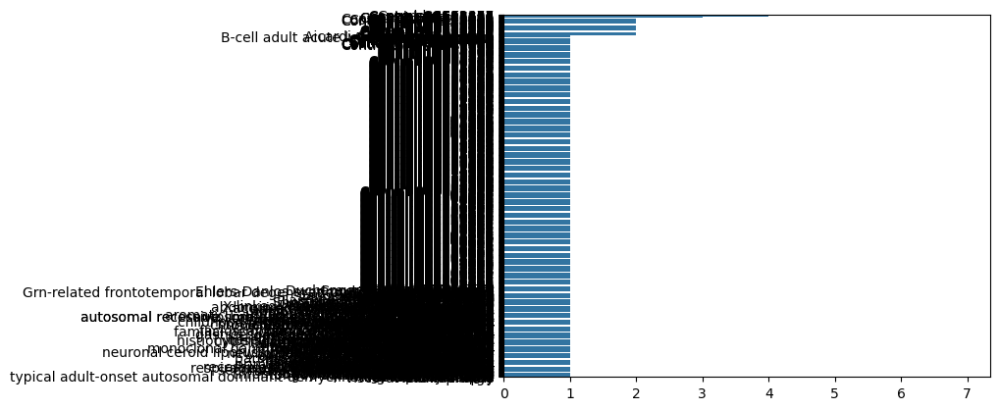

In [4]:
# Group by 'celltype' and count unique 'do_id_study', then sort by values
grouped_data = adata_orig.obs.groupby("celltype")["do_id_study"].nunique().to_dict()

# sort the dictionary by values
grouped_data = dict(sorted(grouped_data.items(), key=lambda item: item[1], reverse=True))

# Create a vertical barplot
sns.barplot(x=list(grouped_data.values()), y=list(grouped_data.keys()), orient="h")


In [5]:
data = list()

for i in range(0, len(results_test)):
    data.append(
        {
            "accuracy": results_test[i]["test/accuracy"],
            "precision": results_test[i]["test/precision"],
            "recall": results_test[i]["test/recall"],
            "macro_f1": results_test[i]["test/macro_f1"],
            "type": "test",
        }
    )
    data.append(
        {
            "accuracy": results_valid[i]["test/accuracy"],
            "precision": results_valid[i]["test/precision"],
            "recall": results_valid[i]["test/recall"],
            "macro_f1": results_valid[i]["test/macro_f1"],
            "type": "validation",
        }
    )
    data.append(
        {
            "accuracy": results_train[i]["test/accuracy"],
            "precision": results_train[i]["test/precision"],
            "recall": results_train[i]["test/recall"],
            "macro_f1": results_train[i]["test/macro_f1"],
            "type": "train",
        }
    )

df_performance = pd.DataFrame(data)
df_performance

,accuracy,precision,recall,macro_f1,type
0,0.191528,0.035121,0.017613,0.021038,test
1,0.645576,0.558194,0.589901,0.558268,validation
2,0.719674,0.710856,0.669898,0.668112,train


(0.0, 1.0)

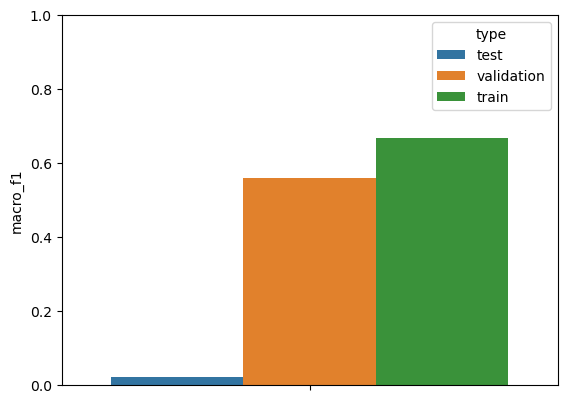

In [6]:
sns.barplot(data=df_performance, hue="type", y="macro_f1")


plt.ylim(0, 1)

In [7]:
# Grouping the dataframe by 'Type' and computing the mean for each metric
df_grouped_mean = df_performance.groupby("type").mean()

# Computing the standard deviation for each metric
df_grouped_std = df_performance.groupby("type").std()

# Merging the mean and std into a single dataframe with the format "mean ± std"
df_performance_summary = (
    df_grouped_mean.astype(str) + " ± " + df_grouped_std.astype(str)
)

# Formatting the mean and std to display only 3 decimal places
df_performance_summary = (
    df_grouped_mean.round(3).astype(str) + " ± " + df_grouped_std.round(3).astype(str)
)


df_performance_summary

,accuracy,precision,recall,macro_f1
type,,,,
test,0.192 ± nan,0.035 ± nan,0.018 ± nan,0.021 ± nan
train,0.72 ± nan,0.711 ± nan,0.67 ± nan,0.668 ± nan
validation,0.646 ± nan,0.558 ± nan,0.59 ± nan,0.558 ± nan


In [8]:
# Grouping the dataframe by 'Type' and computing the mean for each metric
df_grouped_mean = df_performance.groupby("type").mean()

# Computing the standard deviation for each metric
df_grouped_std = df_performance.groupby("type").std()

# Merging the mean and std into a single dataframe with the format "mean ± std"
df_performance_summary = (
    df_grouped_mean.astype(str) + " ± " + df_grouped_std.astype(str)
)

# Formatting the mean and std to display only 3 decimal places
df_performance_summary = (
    df_grouped_mean.round(3).astype(str) + " ± " + df_grouped_std.round(3).astype(str)
)


df_performance_summary

,accuracy,precision,recall,macro_f1
type,,,,
test,0.192 ± nan,0.035 ± nan,0.018 ± nan,0.021 ± nan
train,0.72 ± nan,0.711 ± nan,0.67 ± nan,0.668 ± nan
validation,0.646 ± nan,0.558 ± nan,0.59 ± nan,0.558 ± nan


In [9]:
# Grouping the dataframe by 'Type' and computing the mean for each metric
df_grouped_mean = df_performance.groupby("type").mean()

# Computing the standard deviation for each metric
df_grouped_std = df_performance.groupby("type").std()

# Merging the mean and std into a single dataframe with the format "mean ± std"
df_performance_summary = df_grouped_mean.astype(str)

# Formatting the mean and std to display only 3 decimal places
df_performance_summary = df_grouped_mean.round(3).astype(str)


df_performance_summary

,accuracy,precision,recall,macro_f1
type,,,,
test,0.192,0.035,0.018,0.021
train,0.72,0.711,0.67,0.668
validation,0.646,0.558,0.59,0.558


## 0.2 scGPT Plots

In [60]:
data_type = "test"


for i in range(0, len(results_test)):
    print(f"Fold {i}")

    if data_type == "test":
        adata_test = adata_orig.obs[adata_orig.obs[f"test_split_{i+1}"] == 1]
        predictions = np.array(predictions_test[i])
        celltypes = adata_test["celltype"].values
        labels = np.array(labels_test[i])

        print(
            f"Nº of celltypes Train: {adata_orig.obs[adata_orig.obs[f'test_split_{i+1}'] != 1]['celltype'].nunique()}"
        )

        print(
            f"Nº of celltypes Test: {adata_orig.obs[adata_orig.obs[f'test_split_{i+1}'] == 1]['celltype'].nunique()}"
        )


    elif data_type == "train":
        predictions = np.array(predictions_train)
        adata_train = adata_orig[adata_orig.obs[f"test_split_{i+1}"] == 0]
        celltypes = adata_train.obs["celltype"].values
        labels = np.array(labels_train)
        print(labels.shape)

    celltypes = list(celltypes)
    # for j in set([id2type[i][p] for p in predictions]):
    #     if j not in celltypes:
    #         celltypes.remove(j)

    # print(len(labels), len(predictions))

    all_labels = np.unique(np.concatenate((labels, predictions), axis=1))

    cm = confusion_matrix(labels, predictions, labels=all_labels)
    cm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

    # sorted celltypes by the order of the confusion matrix
    # sorted_celltypes = list()
    # for k in sorted(list(set(labels[i]))):
    #     sorted_celltypes.append(id2type[i][k])

    sorted_celltypes = list()
    for k in all_labels:
        sorted_celltypes.append(id2type[i][k])

    cm = pd.DataFrame(
        cm[:18][:, :18],
        index=sorted_celltypes[:18],
        columns=sorted_celltypes[:18],
    )
    plt.figure(figsize=(10, 10))
    sns.heatmap(cm, annot=True, fmt=".1f", cmap="Blues")
    plt.title(f"Confusion Matrix\nDisease Annotation Performance Fold {i+1}")
    plt.savefig(
        os.path.join(output_dir, f"{data_type}.fold_{i+1}.confusion_matrix.png"),
        dpi=300,
    )

Fold 0
Nº of celltypes Train: 19
Nº of celltypes Test: 19


AxisError: axis 1 is out of bounds for array of dimension 1

In [ ]:
data_type = "test"
for i in range(0, len(results_test)):
    print(f"Fold {i}")

    if data_type == "test":
        adata_test = adata_orig.obs[adata_orig.obs[f"test_split_{i+1}"] == 1]
        predictions = predictions_test[i]
        celltypes = adata_test["celltype"].values
        labels = labels_test

        print(
            f"Nº of celltypes Train: {adata_orig.obs[adata_orig.obs[f'test_split_{i+1}'] != 1]['celltype'].nunique()}"
        )

        print(
            f"Nº of celltypes Test: {adata_orig.obs[adata_orig.obs[f'test_split_{i+1}'] == 1]['celltype'].nunique()}"
        )

    elif data_type == "train":
        predictions = predictions_train
        adata_train = adata_orig[adata_orig.obs[f"test_split_{i+1}"] == 0]
        celltypes = adata_train.obs["celltype"].values
        labels = labels_train

    celltypes = list(celltypes)
    # for j in set([id2type[i][p] for p in predictions]):
    #     if j not in celltypes:
    #         celltypes.remove(j)

    # print(len(labels), len(predictions))

    all_labels = sorted(list(set(np.concatenate((labels[i], predictions)))))

    cm = confusion_matrix(labels[i], predictions, labels=all_labels)

    sorted_celltypes = [id2type[i][k] for k in all_labels]
    mask_celltypes = np.array(
        [True if i in interest_celltypes else False for i in sorted_celltypes]
    )

    cm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis]

    # sorted celltypes by the order of the confusion matrix
    # sorted_celltypes = list()
    # for k in sorted(list(set(labels[i]))):
    #     sorted_celltypes.append(id2type[i][k])

    sorted_celltypes = list()
    for k in all_labels:
        sorted_celltypes.append(id2type[i][k])

    sorted_celltypes = np.array(sorted_celltypes)

    cm = pd.DataFrame(
        cm[mask_celltypes][:, mask_celltypes],
        index=sorted_celltypes[mask_celltypes],
        columns=sorted_celltypes[mask_celltypes],
    )
    plt.figure(figsize=(5, 5))
    sns.heatmap(cm, annot=True, fmt=".1f", cmap="Blues")
    plt.title(f"Confusion Matrix\nDisease Annotation Performance Fold {i+1}")
    plt.savefig(
        os.path.join(output_dir, f"{data_type}.fold_{i+1}.confusion_matrix.png"),
        dpi=300,
    )

Fold 0
Nº of celltypes Train: 1162
Nº of celltypes Test: 89


NameError: name 'interest_celltypes' is not defined

INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


Fold 0


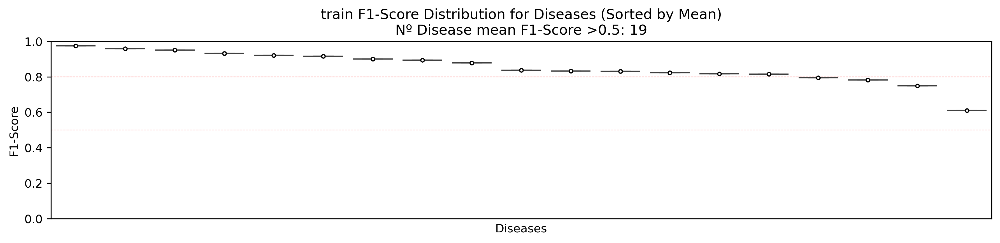

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score

# Placeholder for storing F1-scores of all diseases across folds
f1_scores_dict = {}

data_type = "train"

# Iterate through the folds
for i in range(0, len(results_test)):
    print(f"Fold {i}")

    if data_type == "test":
        adata_test = adata_orig.obs[adata_orig.obs[f"test_split_{i+1}"] == 1]
        predictions = predictions_test[i]
        celltypes = adata_test["celltype"].values
        labels = labels_test

    elif data_type == "train":
        adata_train = adata_orig[adata_orig.obs[f"test_split_{i+1}"] == 0]
        predictions = predictions_train[i]
        celltypes = adata_train.obs["celltype"].values
        labels = labels_train

    celltypes = list(celltypes)

    # Get unique diseases (labels) and compute F1-score for each disease
    unique_labels = sorted(list(set(labels[i])))

    for disease in unique_labels:
        # Filter true labels and predictions for the current disease
        disease_labels = [1 if label == disease else 0 for label in labels[i]]
        disease_predictions = [1 if pred == disease else 0 for pred in predictions]

        # Compute F1-score for this disease
        f1 = f1_score(disease_labels, disease_predictions, zero_division=0)

        # Add the F1-score to the dictionary
        if disease not in f1_scores_dict:
            f1_scores_dict[disease] = []
        f1_scores_dict[disease].append(f1)

# Convert the dictionary into a DataFrame for easier manipulation
f1_df = pd.DataFrame.from_dict(f1_scores_dict, orient="index").T

# Filter out diseases that are not present in any test split (i.e., no F1 scores)
f1_df = f1_df.dropna(axis=1, how="all")


# Convert numerical disease labels to strings
f1_df.columns = f1_df.columns.astype(str)

# Sort diseases by the mean F1-score across all folds
f1_df_mean_sorted = f1_df.mean().sort_values(ascending=False).index
f1_df = f1_df[f1_df_mean_sorted]

# Plot the boxplot
plt.figure(figsize=(12, 3), dpi=300)
sns.boxplot(
    data=f1_df,
    showmeans=True,
    meanprops={
        "marker": "o",
        "markerfacecolor": "white",
        "markeredgecolor": "black",
        "markersize": "3",
    },
)

plt.xticks([], rotation=90)
plt.ylim(0, 1)
plt.title(
    f"{data_type} F1-Score Distribution for Diseases (Sorted by Mean)\nNº Disease mean F1-Score >0.5: {np.sum(f1_df.mean() > 0.5)}"
)
plt.ylabel("F1-Score")
plt.xlabel("Diseases")

plt.tight_layout()
plt.axhline(y=0.5, color="r", linestyle="--", linewidth=0.5)
plt.axhline(y=0.8, color="r", linestyle="--", linewidth=0.5)

# Save the plot
# plt.savefig(os.path.join(output_dir, f"{data_type}.f1_score_boxplot.png"), dpi=300)
# plt.show()

# 1. Load Data

## 1.1 Load scGPT Embeddings

In [67]:
"""Here we will evaluate the Embeddings
Analyze how well the embeddings capture same disease as well as related diseases
"""

# 1. Imports, Variables, Functions
# imports
from typing import *
from scipy.spatial.distance import cdist
import itertools
import obonet
import networkx as nx
# variable
path_df_pairs = "/aloy/home/ddalton/projects/BQ_diseases/outputs/do_pairs.universe.ic.csv"
split_idx = 0

# functions
def merge_embeddings(output: List[Dict]) -> np.array:
    """Merge Embeddings
    Args:
        output (List[Dict]): List of dictionaries with embeddings
    Returns:
        np.array: Merged embeddings
    """
    for i in range(len(output)):
        embeddings_i = output[i]["cell_emb"].numpy()

        if i == 0:
            embeddings = embeddings_i
        else:
            embeddings = np.concatenate((embeddings, embeddings_i), axis=0)
    return embeddings


In [68]:
# 2. Load Data
# load DO graph
# url = "http://purl.obolibrary.org/obo/doid.obo"
# do_graph = obonet.read_obo(url)
# do_G = nx.DiGraph(do_graph)
# # Generate a mapping of DOID to its term (disease name)
# doid_to_term = {
#     node: data["name"] for node, data in do_G.nodes(data=True) if "name" in data
# }

# load all adata
adata_test =  ad.read_h5ad(
    os.path.join(run_dir, f"adata_test_{split_idx+1}.h5ad"), backed="r"
)
adata_valid =  ad.read_h5ad(
    os.path.join(run_dir, f"adata_valid_{split_idx+1}.h5ad"), backed="r"
)
adata_train =  ad.read_h5ad(
    os.path.join(run_dir, f"adata_train_{split_idx+1}.h5ad"), backed="r"
)

# load scGPT embeddings
embeddings_test = merge_embeddings(all_outputs_test[split_idx])
embeddings_valid = merge_embeddings(all_outputs_valid[split_idx])
embeddings_train = merge_embeddings(all_outputs_train[split_idx])



# compute cosine similarity between all embeddings
c_matrix_train = 1 - cdist(embeddings_train, embeddings_train, "cosine")
c_matrix_valid = 1 - cdist(embeddings_valid, embeddings_valid, "cosine")
c_matrix_test = 1 - cdist(embeddings_test, embeddings_test, "cosine")

## 1.2 Load DO pairs

In [31]:
"""1.2 Load Disease Ontology Pairs
Load pairs of related and unrelated diseases from the Disease Ontology.
Structure:
    1. Imports, Variables, Functions
    2. Load Disease Pairs

"""
# 1. Imports, Variables, Functions
# imports


# variables
similarity_file = "/aloy/home/ddalton/projects/BQ_diseases/outputs/do_similarity_results.pkl"

# functions


# 2. Load Disease Pairs

# Get disease IDs
d_ids = list(adata_train.obs["do_id_study"].unique())

# Define disease embeddings
# d_emb = data_matrix.copy()


# load Disease Ontology Lin Similarity amongst pairs!
results = pickle.load(open(similarity_file, "rb"))

# Load IC based similarity 
do_graph = obonet.read_obo("/aloy/home/ddalton/databases/DO_FILES/doid.obo")
dog_graph = nx.DiGraph(do_graph)
dog_graph = dog_graph.reverse()  
leaf_nodes = [n for n, d in dog_graph.out_degree() if d == 0]
print(f"Number of leaf nodes in DO graph: {len(leaf_nodes)}")


do_df_ic = pd.DataFrame(
    results,
    columns=[
        "do1",
        "do2",
        "pair_sorted",
        "resnik",
        "lin",
        "jiang",
        "mica_node",
        "shortest_path_length"
    ]
)

do_df_ic_query = do_df_ic.query("do1 in @d_ids and do2 in @d_ids")
print(do_df_ic_query.shape)

# get top 5% of values
ic_thr = np.quantile(do_df_ic_query["lin"].values, 0.95)
print(f"IC Threshold: {ic_thr:.3f}")

ic_thr_99 = np.quantile(do_df_ic_query["lin"].values, 0.99)
print(f"IC Threshold 99%: {ic_thr_99:.3f}")



Number of leaf nodes in DO graph: 9467
(15576, 8)
IC Threshold: 0.418
IC Threshold 99%: 0.605


In [32]:


# Filter: both DOIDs in embedding list and Lin similarity > 0.4
do_df_ic_query = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin > {ic_thr}")
do_df_ic_query_99 = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin > {ic_thr_99}")
do_df_negative_ic = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin <= {ic_thr}")
print(do_df_ic_query.shape)
print(f"99 pct {do_df_ic_query_99.shape}")

# Filter out parent child relationships
# do_df_ic_query = do_df_ic_query[
#     (do_df_ic_query["do1"] != do_df_ic_query["mica_node"]) &
#     (do_df_ic_query["do2"] != do_df_ic_query["mica_node"])
# ]
# print(do_df_ic_query.shape)


do_df_ic_leaf = do_df_ic_query.query("do1 in @leaf_nodes or do2 in @leaf_nodes")
print(do_df_ic_leaf.shape)


# get lca negative universe pairs
negative_ic_universe = list(
    zip(
        do_df_negative_ic["do1"].to_list(),
        do_df_negative_ic["do2"].to_list(),
    )
)


# Load Disease Pairs based on LCA
# Load the ontology
url = "http://purl.obolibrary.org/obo/doid.obo"
_do_file_path = "/aloy/home/ddalton/databases/DO_FILES/doid.obo"
do_graph = obonet.read_obo(_do_file_path)

# Generate a mapping of DOID to its term (disease name)
doid_to_term = {
    node: data["name"] for node, data in dog_graph.nodes(data=True) if "name" in data
}


(778, 8)
99 pct (153, 8)
(778, 8)


In [33]:

# # 2. Load Data
# # load DO graph
# url = "http://purl.obolibrary.org/obo/doid.obo"
# do_graph = obonet.read_obo(url)
# do_G = nx.DiGraph(do_graph)
# # Generate a mapping of DOID to its term (disease name)
# doid_to_term = {
#     node: data["name"] for node, data in do_G.nodes(data=True) if "name" in data
# }

# # load all adata
# adata_test =  ad.read_h5ad(
#     os.path.join(run_dir, f"adata_test_{split_idx+1}.h5ad"), backed="r"
# )
# adata_valid =  ad.read_h5ad(
#     os.path.join(run_dir, f"adata_valid_{split_idx+1}.h5ad"), backed="r"
# )
# adata_train =  ad.read_h5ad(
#     os.path.join(run_dir, f"adata_train_{split_idx+1}.h5ad"), backed="r"
# )

# # load scGPT embeddings
# embeddings_test = merge_embeddings(all_outputs_test[split_idx])
# embeddings_valid = merge_embeddings(all_outputs_valid[split_idx])
# embeddings_train = merge_embeddings(all_outputs_train[split_idx])



# # compute cosine similarity between all embeddings
# c_matrix_train = 1 - cdist(embeddings_train, embeddings_train, "cosine")

In [34]:
# # load all adata
# adata_test =  ad.read_h5ad(
#     os.path.join(run_dir, f"adata_test_{split_idx+1}.h5ad"), backed="r"
# )
# adata_valid =  ad.read_h5ad(
#     os.path.join(run_dir, f"adata_valid_{split_idx+1}.h5ad"), backed="r"
# )
# adata_train =  ad.read_h5ad(
#     os.path.join(run_dir, f"adata_train_{split_idx+1}.h5ad"), backed="r"
# )

In [35]:
adata_train.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3
14988,DSA03006;ERR3607138;Case,E-MTAB-8455,E-MTAB-8455,307,206,DSA03006,Skin,19399,Williams Syndrome,chromosomal disease,Williams Syndrome,RNA-Seq,DOID:1928,DOID:0080014,chromosomal disease,4,0,0,1
2882,DSA00666;GSM3021882;Case,GSE111085,GSE111085,759,521,DSA00666,nan,19399,Myelodysplastic Syndrome,hematopoietic system disease,Myelodysplastic Syndrome,RNA-Seq,DOID:0050908,DOID:74,hematopoietic system disease,10,0,1,0
5913,DSA01351;GSM4610643;Case,GSE152287,GSE152287,815,563,DSA01351,nan,17654,Ataxia Telangiectasia,brain disease,Ataxia Telangiectasia,Microarray,DOID:12704,DOID:936,brain disease,1,0,0,1
34395,DSA06325;GSM1875110;Case,GSE72946,GSE72946,436,294,DSA06325,Whole blood,16825,Leptospirosis,disease by infectious agent,Leptospirosis,Microarray,DOID:2297,DOID:0050117,disease by infectious agent,7,0,0,1
34393,DSA06325;GSM1875108;Case,GSE72946,GSE72946,436,294,DSA06325,Whole blood,16825,Leptospirosis,disease by infectious agent,Leptospirosis,Microarray,DOID:2297,DOID:0050117,disease by infectious agent,7,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42657,DSA08323;GSM5714785;Case,GSE190125,GSE190125,636,427,DSA08323,Whole blood,19399,Down Syndrome,chromosomal disease,Down Syndrome,RNA-Seq,DOID:14250,DOID:0080014,chromosomal disease,4,0,0,1
23095,DSA04320;GSM346942;Case,GSE13791,GSE13791,648,439,DSA04320,nan,17043,Chagas Disease,disease by infectious agent,Chagas Disease,Microarray,DOID:12140,DOID:0050117,disease by infectious agent,7,0,1,0
29626,DSA05470;GSM6509772;Case,GSE212126,GSE212126,848,585,DSA05470,Skin,19399,Psoriasis,integumentary system disease,Psoriasis,RNA-Seq,DOID:4398,DOID:16,integumentary system disease,12,0,0,1
30325,DSA05588;GSM6732736;Case,GSE218012,GSE218012,426,288,DSA05588,Skin,19399,Hypermobile Ehlers-Danlos Syndrome,connective tissue disease,Hypermobile Ehlers-Danlos Syndrome,RNA-Seq,DOID:14757,DOID:65,connective tissue disease,6,0,1,0


In [36]:
# # compute cosine similarity between all embeddings
# c_matrix_train = 1 - cdist(embeddings_train, embeddings_train, "cosine")

In [37]:

# # load all pairs of diseases from DO universe
# df_pairs = pd.read_csv(path_df_pairs)

# # filter only pairs in study
# doids_study = adata_train.obs["do_id"].to_list()
# df_query = df_pairs.query(
#     f"node_1 in {doids_study} and node_2 in {doids_study}"
# )
# print(f"Pairs in Study: {len(df_query)}")

# # filter most significant pairs based on IC Sanchez
# pct = 1
# doid_2_ic = dict(zip(df_pairs["node_lca"], df_pairs["ic_sanchez"]))
# ic_values = [doid_2_ic[doid] for doid in df_pairs["node_lca"].unique()]

# thr = np.percentile(ic_values, pct)

# print(f"Non-Significant LCAs: {[doid_to_term[doid] for doid in df_query['node_lca'].unique() if doid_2_ic[doid] < thr]}")

# df_query = df_query[df_query["ic_sanchez"] >= thr]
# print(f"Significant Pairs: {len(df_query)}")



In [38]:
# doids_study = adata_train.obs["do_id_study"].unique()

In [39]:
# doids_study = adata_train.obs["do_id"].to_list()
# len(set(doids_study))

In [40]:
# ic_thr = 0.4
# d_ids = doids_study

# # load Disease Ontology Lin Similarity amongst pairs!

# results = pickle.load(open("/aloy/home/ddalton/projects/BQ_diseases/outputs/do_similarity_results.pkl", "rb"))

# # Load IC based similarity 
# do_graph = obonet.read_obo("/aloy/home/ddalton/databases/DO_FILES/doid.obo")
# dog_graph = nx.DiGraph(do_graph)
# dog_graph = dog_graph.reverse()  
# leaf_nodes = [n for n, d in dog_graph.out_degree() if d == 0]
# print(f"Number of leaf nodes in DO graph: {len(leaf_nodes)}")


# do_df_ic = pd.DataFrame(
#     results,
#     columns=[
#         "do1",
#         "do2",
#         "pair_sorted",
#         "resnik",
#         "lin",
#         "jiang",
#         "mica_node",
#         "shortest_path_length"
#     ]
# )

# do_df_ic_query = do_df_ic.query("do1 in @d_ids and do2 in @d_ids")
# print(do_df_ic_query.shape)
# # Filter: both DOIDs in embedding list and Lin similarity > 0.4
# do_df_ic_query = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin > {ic_thr}")
# do_df_negative_ic = do_df_ic.query(f"do1 in @d_ids and do2 in @d_ids and lin <= {ic_thr}")
# print(do_df_ic_query.shape)

# # Filter out parent child relationships
# do_df_ic_query = do_df_ic_query[
#     (do_df_ic_query["do1"] != do_df_ic_query["mica_node"]) &
#     (do_df_ic_query["do2"] != do_df_ic_query["mica_node"])
# ]
# print(do_df_ic_query.shape)


# do_df_ic_leaf = do_df_ic_query.query("do1 in @leaf_nodes or do2 in @leaf_nodes")
# print(do_df_ic_leaf.shape)


# # get lca negative universe pairs
# negative_ic_universe = list(
#     zip(
#         do_df_negative_ic["do1"].to_list(),
#         do_df_negative_ic["do2"].to_list(),
#     )
# )


# # Load Disease Pairs based on LCA
# # Load the ontology
# # url = "http://purl.obolibrary.org/obo/doid.obo"
# # do_graph = obonet.read_obo(url)

# # Generate a mapping of DOID to its term (disease name)
# doid_to_term = {
#     node: data["name"] for node, data in dog_graph.nodes(data=True) if "name" in data
# }

# # get what we consider to be TRUE NEGATIVES
# # we will consider ONLY pairs which are connected through "disease" term - so they belong to different families all together
# _df_lca_universe = pd.read_csv("/aloy/home/ddalton/projects/BQ_diseases/outputs/do_pairs.universe.csv")
# values = [int(x / 2) for x in _df_lca_universe["node_lca"].value_counts().to_list()]
# pct_25, pct_75, pct_99 = np.percentile(values, [25, 75, 99])

# # remove redundant LCA !
# thr = pct_99
# lca_counts = dict(_df_lca_universe["node_lca"].value_counts())
# non_redundant_lca = [k for k, v in lca_counts.items() if v < thr]
# redundant_lca = [k for k, v in lca_counts.items() if v >= thr]
# print(f"Nº of redundant LCAs: {len(redundant_lca)}")

# # negatives
# _df_lca_universe_negative = _df_lca_universe.query("node_lca not in @non_redundant_lca")
# _df_lca_universe_negative = _df_lca_universe_negative.query("node_1 in @d_ids and node_2 in @d_ids")


# # remove large variables
# df_lca = _df_lca_universe.query("node_lca in @non_redundant_lca")
# df_lca = df_lca.query("node_1 in @d_ids and node_2 in @d_ids")

# # filter only leaf nodes
# df_leaf_lca = df_lca.query("node_1 in @leaf_nodes or node_2 in @leaf_nodes")
# print(df_leaf_lca.shape)

# # get lca negative universe pairs
# negative_lca_universe = list(
#     zip(
#         _df_lca_universe_negative["node_1"].to_list(),
#         _df_lca_universe_negative["node_2"].to_list(),
#     )
# )
# del _df_lca_universe
# del _df_lca_universe_negative



In [41]:
# do_df_ic_query.query("lin > 0.6").shape

# 2. Benchmark Disease vs Control Similarity

In [69]:
"""2. Benchmark Disease vs Control Similarity

Structure:
    1. Imports, Variables, Functions
    2. Plot Similarity
"""
# 1. Imports, Variables, Functions
# imports
from tqdm import tqdm
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

# variables


# functions
def plot_same_disease_strat_vs_random(
    c_matrix,
    adata_obs,
    df_query,
    color_same="#6baed6",
    color_diff="#08519c",
    color_rand="gray",
    seed=42,
):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import itertools
    from collections import defaultdict
    from tqdm import tqdm

    np.random.seed(seed)

    flatten = lambda l: [item for sublist in l for item in sublist]

    adata_obs = adata_obs.copy()
    adata_obs.reset_index(drop=True, inplace=True)
    adata_obs["is_control"] = ["C" if i.startswith("Control") else "D" for i in adata_obs["do_id_study"]]

    _c_same_same, _w_same_same = [], []
    _c_same_diff, _w_same_diff = [], []

    # Precompute DOID-to-sample indices
    doid_to_indices = defaultdict(list)
    for idx, doid in adata_obs["do_id_study"].items():
        doid_to_indices[doid].append(idx)

    # Build unrelated pairs
    unrelated_pairs = []
    # pair_key_set = set(tuple(sorted(eval(x))) for x in df_query["pair_sorted"])
    pair_key_set = set(tuple(sorted(p)) for p in df_query["pair_sorted"])
    doids = list(doid_to_indices.keys())
    for i in tqdm(range(len(doids)), desc="Building unrelated pairs"):
        for j in range(i + 1, len(doids)):
            d1, d2 = doids[i], doids[j]
            if d1 == d2 or tuple(sorted([d1, d2])) in pair_key_set:
                continue
            unrelated_pairs.extend(itertools.product(doid_to_indices[d1], doid_to_indices[d2]))

    # Process same disease pairs
    for do_id in tqdm(adata_obs["do_id_study"].unique(), desc="Processing same disease pairs"):
        if do_id.startswith("Control"):
            continue
        _df = adata_obs.query("do_id_study == @do_id")
        datasets = _df["dsaid"].unique()

        for dsaid in datasets:
            idxs = _df.query("dsaid == @dsaid").index
            if len(idxs) < 2:
                continue
            idxs_p = np.array(list(itertools.combinations(idxs, 2)))
            _c_same_same.extend(c_matrix[idxs_p[:, 0], idxs_p[:, 1]])
            _w_same_same.extend([len(idxs_p)] * len(idxs_p))

        if len(datasets) > 1:
            for d1, d2 in itertools.combinations(datasets, 2):
                idxs1 = _df.query("dsaid == @d1").index
                idxs2 = _df.query("dsaid == @d2").index
                idxs_p = np.array(list(itertools.product(idxs1, idxs2)))
                _c_same_diff.extend(c_matrix[idxs_p[:, 0], idxs_p[:, 1]])
                _w_same_diff.extend([len(idxs_p)] * len(idxs_p))

    # Normalize weights
    _w_same_same = np.array(_w_same_same) / len(_c_same_same)
    _w_same_diff = np.array(_w_same_diff) / len(_c_same_diff)

    # Sample unrelated pairs
    sample_size = len(_c_same_same) + len(_c_same_diff)
    selected_idxs = np.random.choice(len(unrelated_pairs), size=sample_size, replace=False)
    _rand_sample_pairs = [unrelated_pairs[i] for i in selected_idxs]
    _c_rand = [c_matrix[i, j] for i, j in _rand_sample_pairs]

    # Plot
    plt.figure(figsize=(4, 6.5), dpi=300)

    sns.kdeplot(x=_c_same_same, weights=_w_same_same,linewidth=3,  label="Same Disease (Same Dataset)", fill=True, color=color_same, zorder=3)
    sns.kdeplot(x=_c_same_diff, weights=_w_same_diff,linewidth=3,  label="Same Disease (Diff Datasets)", fill=True, color=color_diff, zorder=3)
    sns.kdeplot(_c_rand, label="Random Pairs", linewidth=3, linestyle="--", fill=True, color=color_rand, zorder=2)

    plt.title("Cosine Similarity: Same Disease vs Random")
    plt.xlabel("Cosine Similarity")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.xlim(0, 1)
    plt.grid(zorder=-3, linestyle="--")
    plt.show()

def plot_same_disease_vs_random_combined(
    c_matrix,
    adata_obs,
    df_query,
    color_same="#3182bd",
    color_rand="gray",
    seed=42,
):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import itertools
    from collections import defaultdict
    from tqdm import tqdm

    np.random.seed(seed)

    flatten = lambda l: [item for sublist in l for item in sublist]

    adata_obs = adata_obs.copy()
    adata_obs.reset_index(drop=True, inplace=True)
    adata_obs["is_control"] = ["C" if i.startswith("Control") else "D" for i in adata_obs["do_id_study"]]

    _c_same_all = []
    _w_same_all = []

    # Precompute DOID-to-sample indices
    doid_to_indices = defaultdict(list)
    for idx, doid in adata_obs["do_id_study"].items():
        doid_to_indices[doid].append(idx)

    # Build unrelated pairs
    unrelated_pairs = []
    pair_key_set = set(tuple(sorted(p)) for p in df_query["pair_sorted"])
    doids = list(doid_to_indices.keys())
    for i in tqdm(range(len(doids)), desc="Building unrelated pairs"):
        for j in range(i + 1, len(doids)):
            d1, d2 = doids[i], doids[j]
            if d1 == d2 or tuple(sorted([d1, d2])) in pair_key_set:
                continue
            unrelated_pairs.extend(itertools.product(doid_to_indices[d1], doid_to_indices[d2]))

    # Process all same disease pairs (regardless of dataset)
    for do_id in tqdm(adata_obs["do_id_study"].unique(), desc="Processing same disease pairs"):
        if do_id.startswith("Control"):
            continue
        idxs = adata_obs.query("do_id_study == @do_id").index
        if len(idxs) < 2:
            continue
        idxs_p = np.array(list(itertools.combinations(idxs, 2)))
        _c_same_all.extend(c_matrix[idxs_p[:, 0], idxs_p[:, 1]])
        _w_same_all.extend([len(idxs_p)] * len(idxs_p))

    # Normalize weights
    _w_same_all = np.array(_w_same_all) / len(_c_same_all)

    # Sample unrelated pairs
    sample_size = len(_c_same_all)
    selected_idxs = np.random.choice(len(unrelated_pairs), size=sample_size, replace=False)
    _rand_sample_pairs = [unrelated_pairs[i] for i in selected_idxs]
    _c_rand = [c_matrix[i, j] for i, j in _rand_sample_pairs]

    # Plot
    plt.figure(figsize=(4, 4), dpi=300)

    sns.kdeplot(x=_c_same_all, weights=_w_same_all, label="Same Disease", fill=True, color=color_same, zorder=3, linewidth=3)
    sns.kdeplot(_c_rand, label="Random Pairs", fill=True, color=color_rand, zorder=2, linewidth=3)

    plt.title("Cosine Similarity: Same Disease")
    plt.xlabel("Cosine Similarity")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.xlim(0, 1)
    plt.grid(zorder=-3, linestyle="--")
    plt.show()



def plot_same_disease_strat_vs_random(
    c_matrix,
    adata_obs,
    df_query,
    color_same="#6baed6",
    color_diff="#08519c",
    color_rand="gray",
    seed=42,
):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import itertools
    from collections import defaultdict
    from tqdm import tqdm

    np.random.seed(seed)

    flatten = lambda l: [item for sublist in l for item in sublist]

    adata_obs = adata_obs.copy()
    adata_obs.reset_index(drop=True, inplace=True)
    adata_obs["is_control"] = ["C" if i.startswith("Control") else "D" for i in adata_obs["do_id_study"]]

    _c_same_same, _w_same_same = [], []
    _c_same_diff, _w_same_diff = [], []

    # Precompute DOID-to-sample indices
    doid_to_indices = defaultdict(list)
    for idx, doid in adata_obs["do_id_study"].items():
        doid_to_indices[doid].append(idx)

    # Build unrelated pairs
    unrelated_pairs = []
    # pair_key_set = set(tuple(sorted(eval(x))) for x in df_query["pair_sorted"])
    pair_key_set = set(tuple(sorted(p)) for p in df_query["pair_sorted"])
    doids = list(doid_to_indices.keys())
    for i in tqdm(range(len(doids)), desc="Building unrelated pairs"):
        for j in range(i + 1, len(doids)):
            d1, d2 = doids[i], doids[j]
            if d1 == d2 or tuple(sorted([d1, d2])) in pair_key_set:
                continue
            unrelated_pairs.extend(itertools.product(doid_to_indices[d1], doid_to_indices[d2]))

    # Process same disease pairs
    for do_id in tqdm(adata_obs["do_id_study"].unique(), desc="Processing same disease pairs"):
        if do_id.startswith("Control"):
            continue

        # datasets from disease
        _df = adata_obs.query("do_id_study == @do_id")
        datasets = _df["dataset"].unique()

        for dataset in datasets:
            idxs = _df.query("dataset == @dataset").index
            if len(idxs) < 2:
                continue
            idxs_p = np.array(list(itertools.combinations(idxs, 2)))
            _c_same_same.extend(c_matrix[idxs_p[:, 0], idxs_p[:, 1]])
            _w_same_same.extend([len(idxs_p)] * len(idxs_p))

        if len(datasets) > 1:
            for d1, d2 in itertools.combinations(datasets, 2):
                idxs1 = _df.query("dataset == @d1").index
                idxs2 = _df.query("dataset == @d2").index
                idxs_p = np.array(list(itertools.product(idxs1, idxs2)))
                _c_same_diff.extend(c_matrix[idxs_p[:, 0], idxs_p[:, 1]])
                _w_same_diff.extend([len(idxs_p)] * len(idxs_p))

    # Normalize weights
    _w_same_same = np.array(_w_same_same) / len(_c_same_same)
    _w_same_diff = np.array(_w_same_diff) / len(_c_same_diff)

    # Sample unrelated pairs
    sample_size = len(_c_same_same) + len(_c_same_diff)
    selected_idxs = np.random.choice(len(unrelated_pairs), size=sample_size, replace=False)
    _rand_sample_pairs = [unrelated_pairs[i] for i in selected_idxs]
    _c_rand = [c_matrix[i, j] for i, j in _rand_sample_pairs]

    # Plot
    plt.figure(figsize=(6.5, 4), dpi=300)

    sns.kdeplot(x=_c_same_same, weights=_w_same_same,linewidth=3,  label="Same Disease (Same Dataset)", fill=True, color=color_same, zorder=3)
    sns.kdeplot(x=_c_same_diff, weights=_w_same_diff,linewidth=3,  label="Same Disease (Diff Datasets)", fill=True, color=color_diff, zorder=3)
    sns.kdeplot(_c_rand, label="Random Pairs", linewidth=3, fill=True, color=color_rand, zorder=2)

    plt.title("Cosine Similarity: Same Disease vs Random")
    plt.xlabel("Cosine Similarity")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.xlim(0, 1)
    plt.grid(zorder=-3, linestyle="--")
    plt.show()


def plot_same_disease_vs_random_diff_dataset(
    c_matrix,
    adata_obs,
    df_query,
    color_same="#6baed6",
    color_diff="#08519c",
    color_rand="gray",
    seed=42,
    weights=True,
):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    import itertools
    from collections import defaultdict
    from tqdm import tqdm

    np.random.seed(seed)

    flatten = lambda l: [item for sublist in l for item in sublist]

    adata_obs = adata_obs.copy()
    adata_obs.reset_index(drop=True, inplace=True)
    adata_obs["is_control"] = ["C" if i.startswith("Control") else "D" for i in adata_obs["do_id_study"]]

    _c_same_same, _w_same_same = [], []
    _c_same_diff, _w_same_diff = [], []

    # Precompute DOID-to-sample indices
    doid_to_indices = defaultdict(list)
    for idx, doid in adata_obs["do_id_study"].items():
        doid_to_indices[doid].append(idx)

    # Build unrelated pairs
    unrelated_pairs = []
    # pair_key_set = set(tuple(sorted(eval(x))) for x in df_query["pair_sorted"])
    pair_key_set = set(tuple(sorted(p)) for p in df_query["pair_sorted"])
    doids = list(doid_to_indices.keys())
    for i in tqdm(range(len(doids)), desc="Building unrelated pairs"):
        for j in range(i + 1, len(doids)):
            d1, d2 = doids[i], doids[j]
            if d1 == d2 or tuple(sorted([d1, d2])) in pair_key_set:
                continue
            unrelated_pairs.extend(itertools.product(doid_to_indices[d1], doid_to_indices[d2]))

    # Process same disease pairs
    for do_id in tqdm(adata_obs["do_id_study"].unique(), desc="Processing same disease pairs"):
        if do_id.startswith("Control"):
            continue

        # datasets from disease
        _df = adata_obs.query("do_id_study == @do_id")
        datasets = _df["dataset"].unique()

        for dataset in datasets:
            idxs = _df.query("dataset == @dataset").index
            if len(idxs) < 2:
                continue
            idxs_p = np.array(list(itertools.combinations(idxs, 2)))
            _c_same_same.extend(c_matrix[idxs_p[:, 0], idxs_p[:, 1]])
            _w_same_same.extend([len(idxs_p)] * len(idxs_p))

        if len(datasets) > 1:
            for d1, d2 in itertools.combinations(datasets, 2):
                idxs1 = _df.query("dataset == @d1").index
                idxs2 = _df.query("dataset == @d2").index
                idxs_p = np.array(list(itertools.product(idxs1, idxs2)))
                _c_same_diff.extend(c_matrix[idxs_p[:, 0], idxs_p[:, 1]])
                _w_same_diff.extend([len(idxs_p)] * len(idxs_p))

    # Normalize weights
    _w_same_same = np.array(_w_same_same) / len(_c_same_same)
    _w_same_diff = np.array(_w_same_diff) / len(_c_same_diff)

    # Sample unrelated pairs
    sample_size = len(_c_same_same) + len(_c_same_diff)
    selected_idxs = np.random.choice(len(unrelated_pairs), size=sample_size, replace=False)
    _rand_sample_pairs = [unrelated_pairs[i] for i in selected_idxs]
    _c_rand = [c_matrix[i, j] for i, j in _rand_sample_pairs]

    # Plot
    plt.figure(figsize=(4, 4), dpi=300)

    # sns.kdeplot(x=_c_same_same, weights=_w_same_same,linewidth=3,  label="Same Disease (Same Dataset)", fill=True, color=color_same, zorder=3)
    if weights: 
       sns.kdeplot(x=_c_same_diff, weights=_w_same_diff,linewidth=3,  label="Same Disease (Diff Datasets)", fill=True, color=color_diff, zorder=3)
    else:
        sns.kdeplot(x=_c_same_diff, linewidth=3,  label="Same Disease (Diff Datasets)", fill=True, color=color_diff, zorder=3)
    sns.kdeplot(_c_rand, label="Random Pairs", linewidth=3, linestyle="--", fill=True, color=color_rand, zorder=2)

    plt.title("Cosine Similarity: Same Disease vs Random")
    plt.xlabel("Cosine Similarity")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.xlim(0, 1)
    plt.grid(zorder=-3, linestyle="--")
    plt.show()

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.55it/s] 


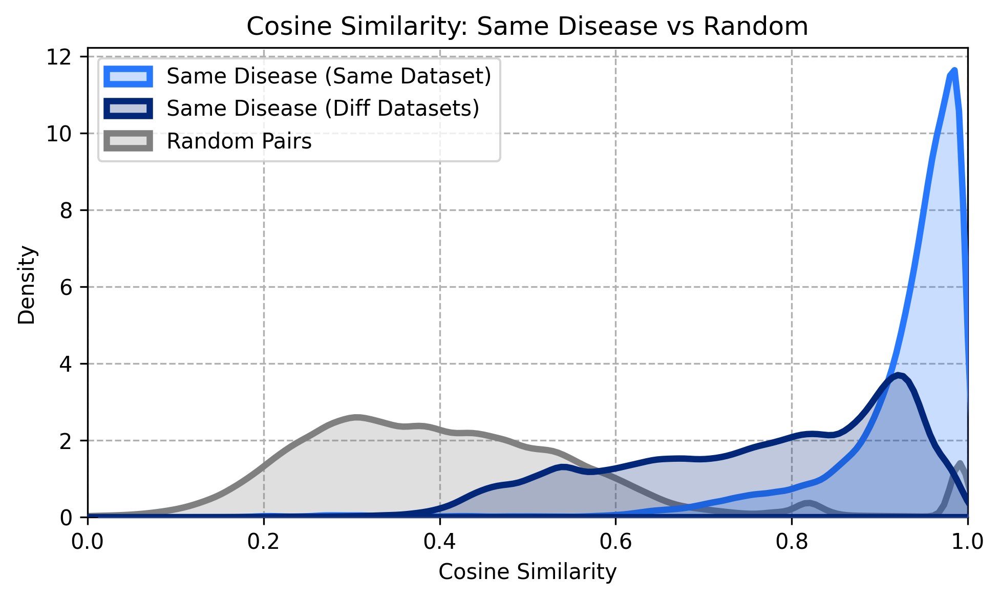

In [70]:
# define our query dataframe - ontology pairs
df_query = do_df_ic_query.copy()

plot_same_disease_strat_vs_random(
    c_matrix_train,
    adata_train.obs,
    df_query,
    color_same="#2778ff",
    color_diff="#022778",
    color_rand="gray",
    seed=42,)

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.72it/s] 


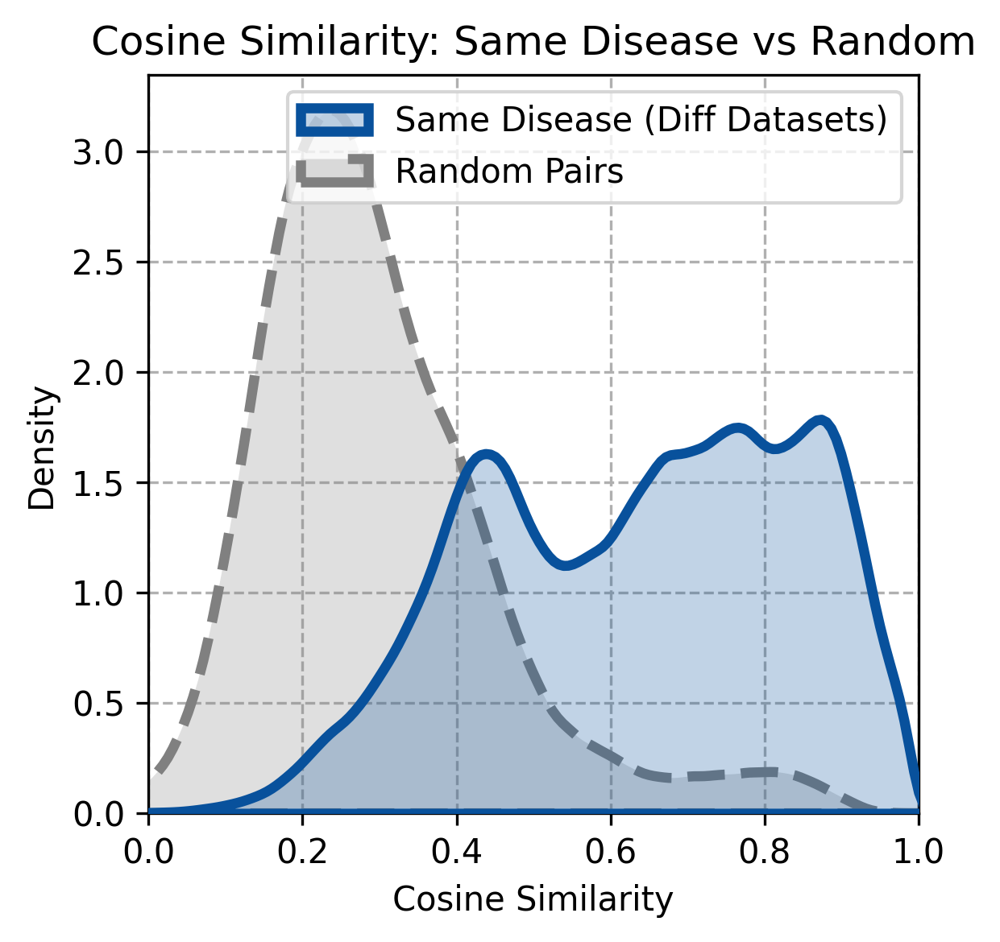

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.69it/s] 


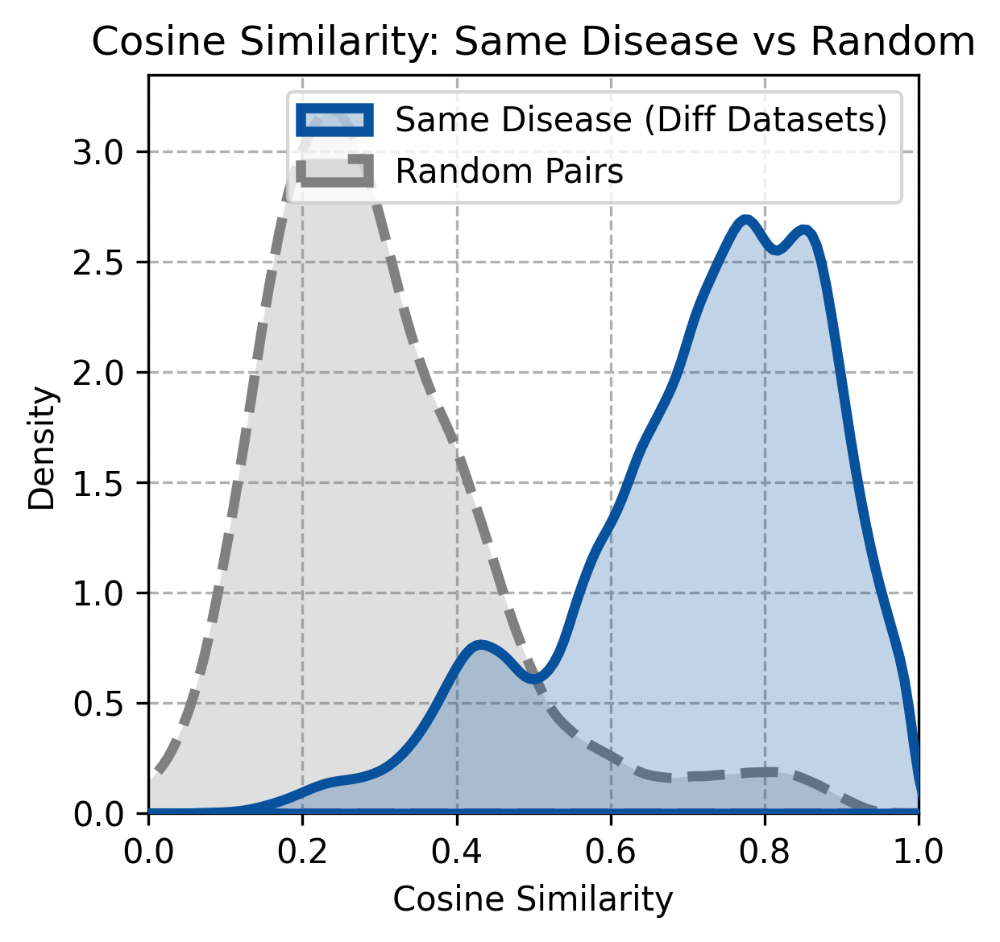

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.51it/s] 


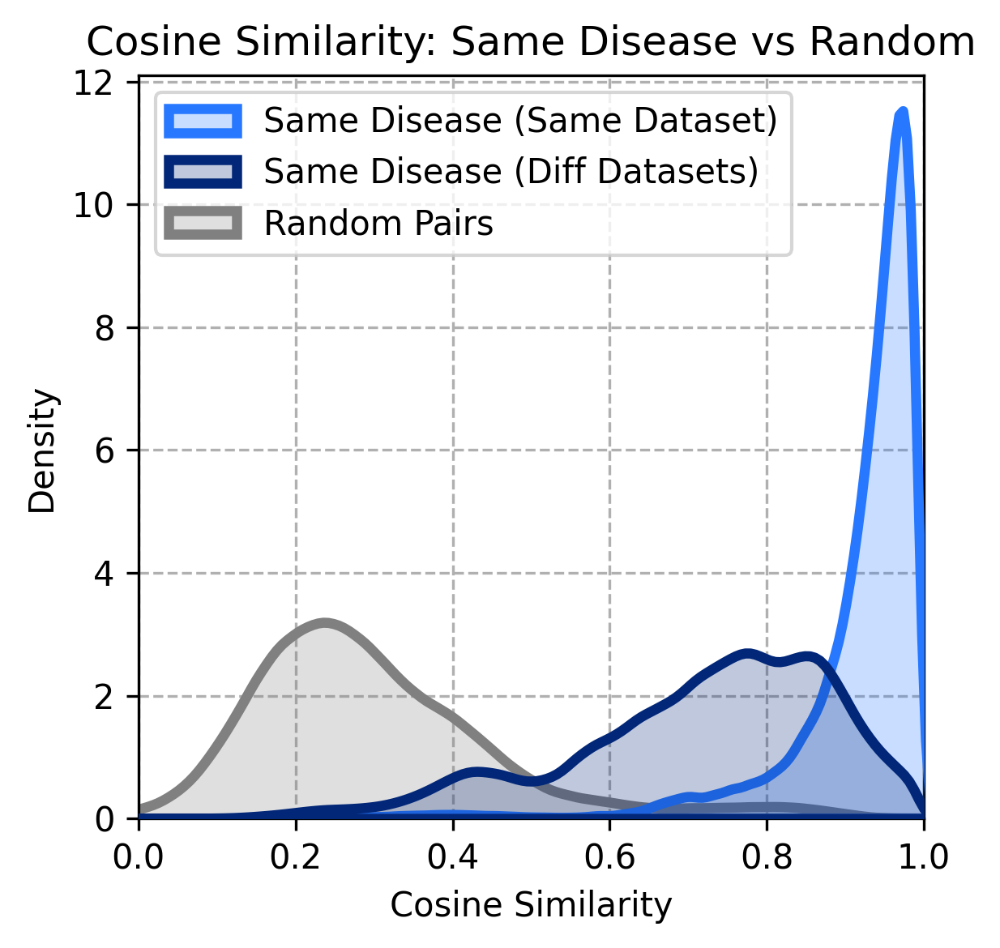

Processing same disease pairs: 100%|██████████| 177/177 [00:00<00:00, 206.01it/s]


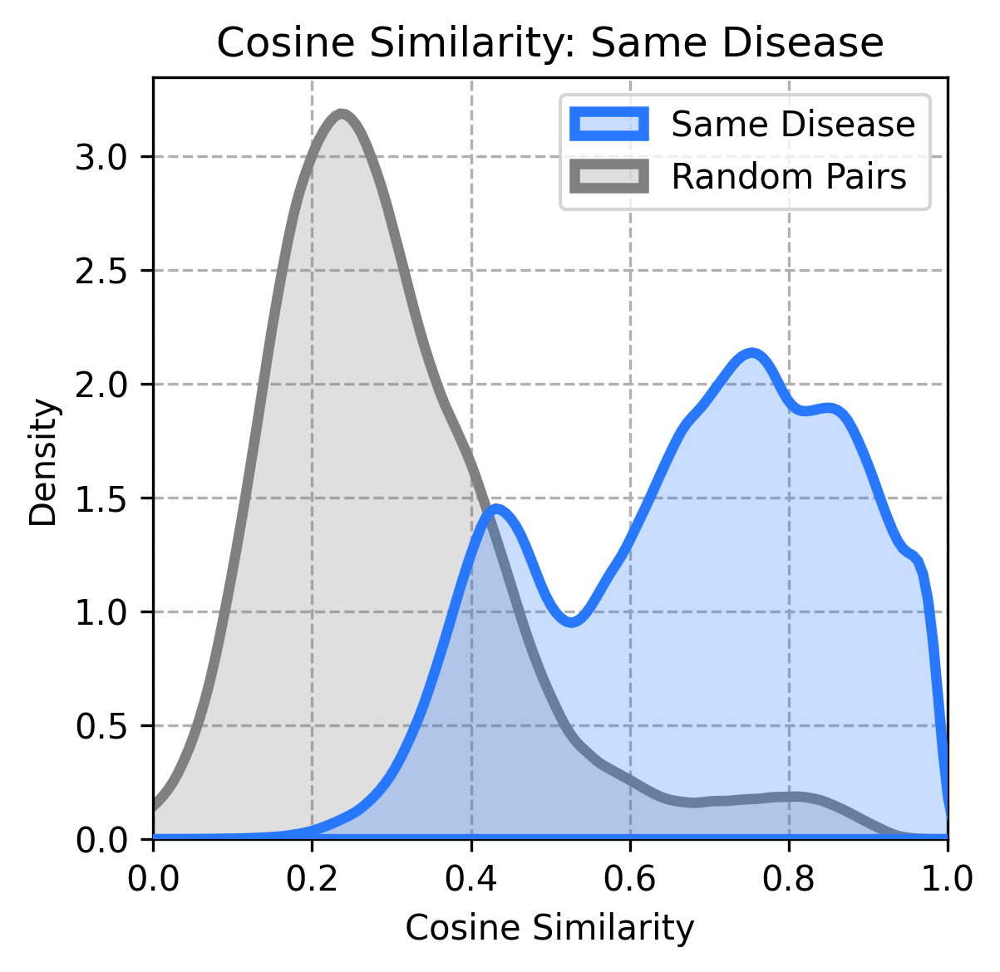

In [50]:
# 2. Plot Similarity
# define our query dataframe - ontology pairs
df_query = do_df_ic_query.copy()

plot_same_disease_vs_random_diff_dataset(
    c_matrix_train,
    adata_train.obs,
    df_query,
    color_same="#2778ff",  # medium blue
    color_rand="gray", 
    weights=False,
)

plot_same_disease_vs_random_diff_dataset(
    c_matrix_train,
    adata_train.obs,
    df_query,
    color_same="#2778ff",  # medium blue
    color_rand="gray", 
    weights=True,
    
)

# Stratified
plot_same_disease_strat_vs_random(
    c_matrix_train,
    adata_train.obs,
    df_query,
    color_same="#2778ff",
    color_diff="#022778",
    color_rand="gray",
    seed=42,)

# Grouped
plot_same_disease_vs_random_combined(
    c_matrix_train,
    adata_train.obs,
    df_query,
    color_same="#2778ff",  # medium blue
    color_rand="gray"
)

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.23it/s] 


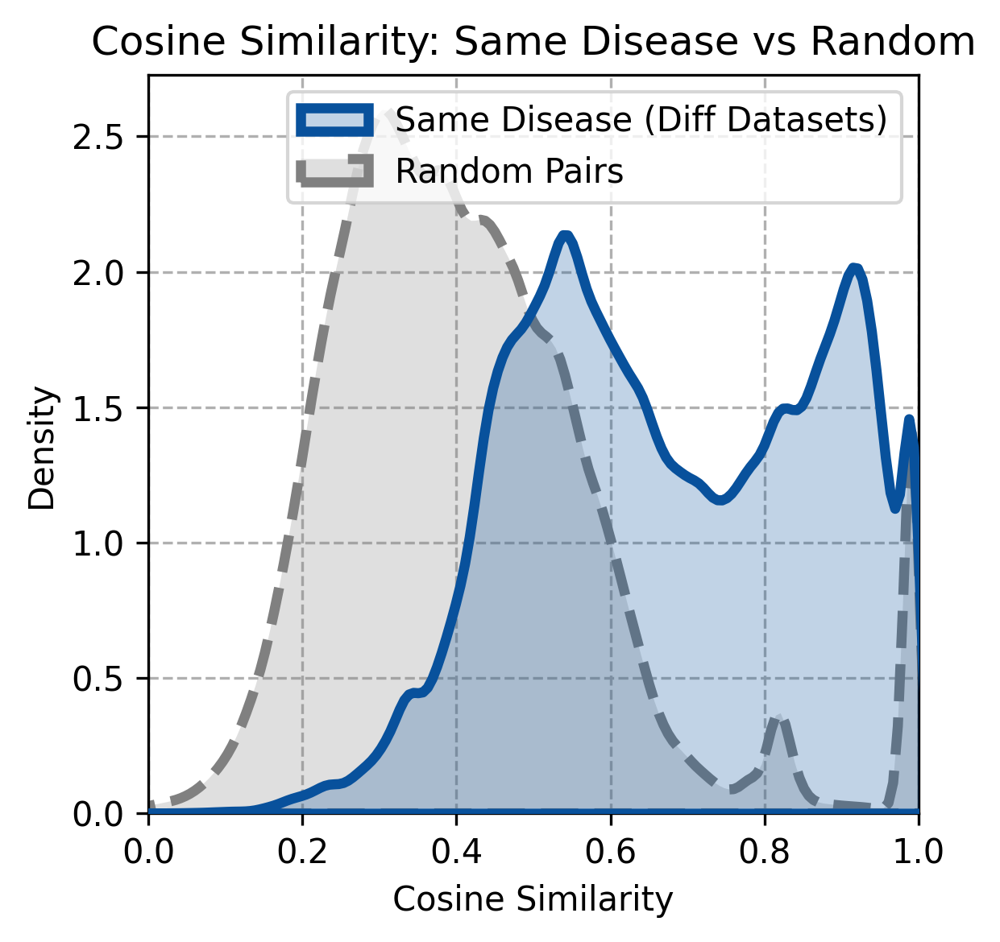

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.50it/s] 


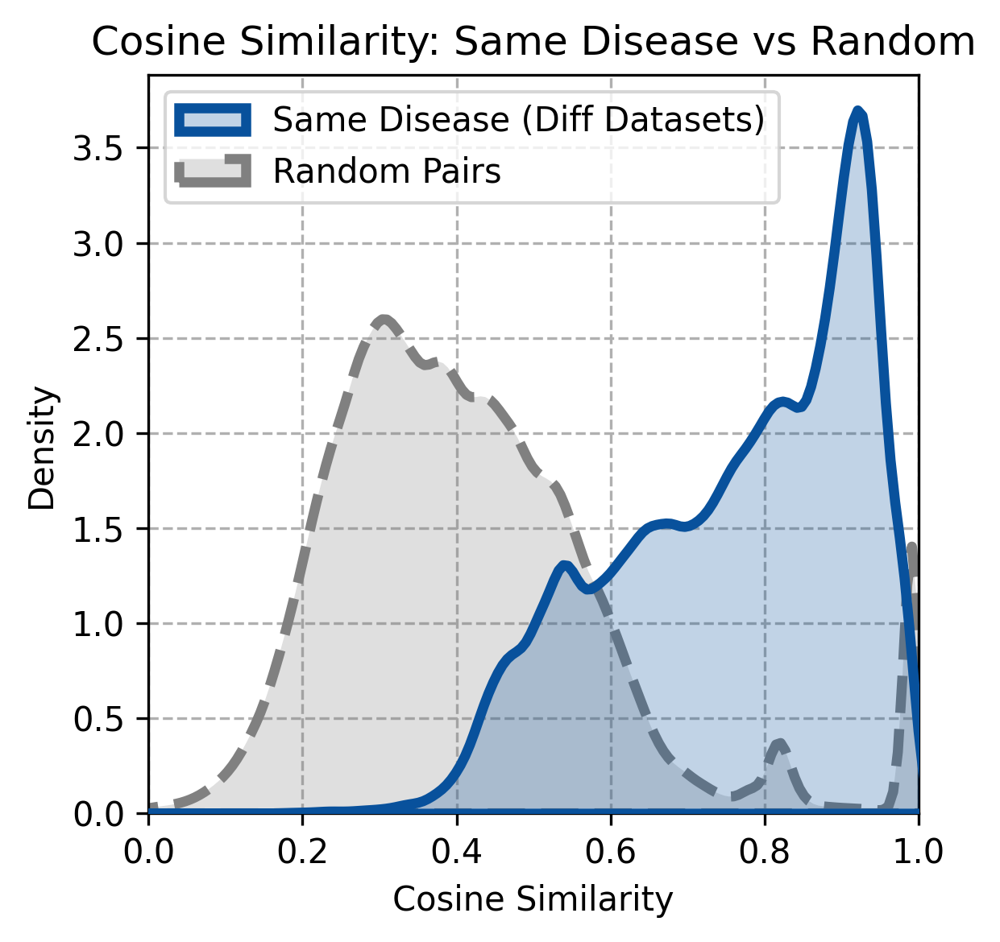

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.59it/s] 


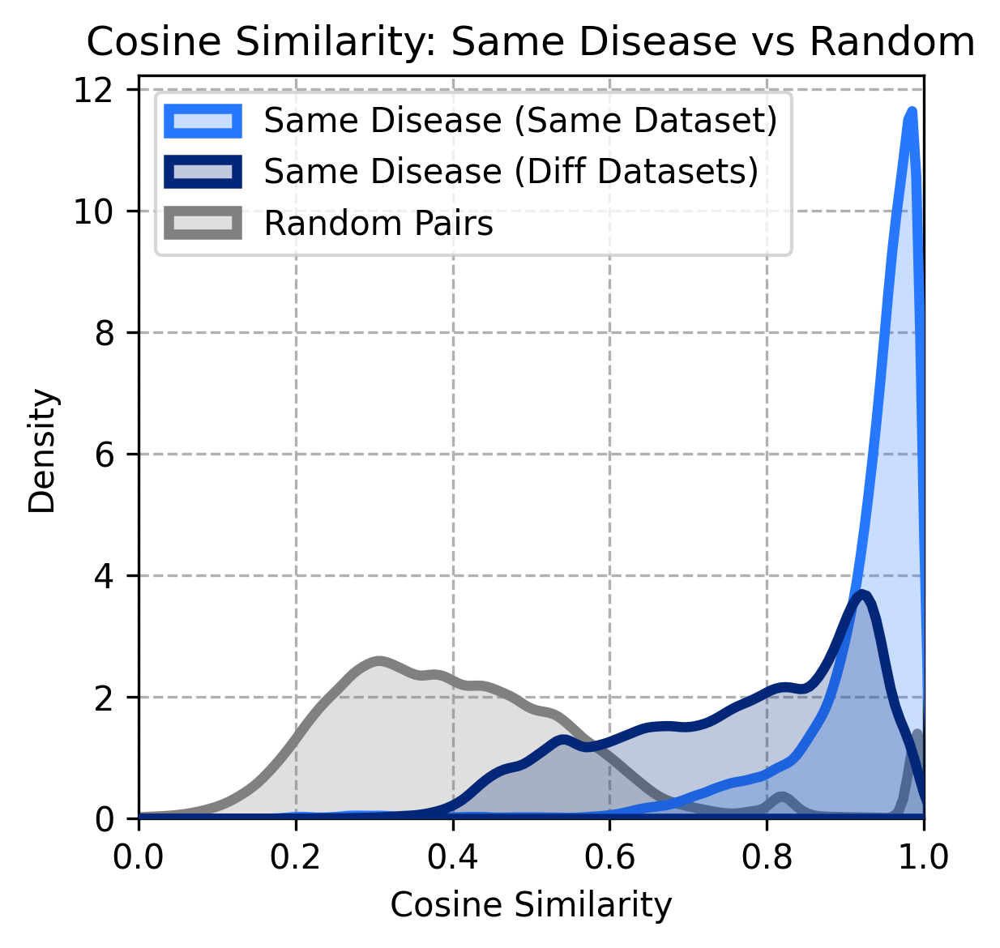

Processing same disease pairs: 100%|██████████| 177/177 [00:00<00:00, 197.88it/s]


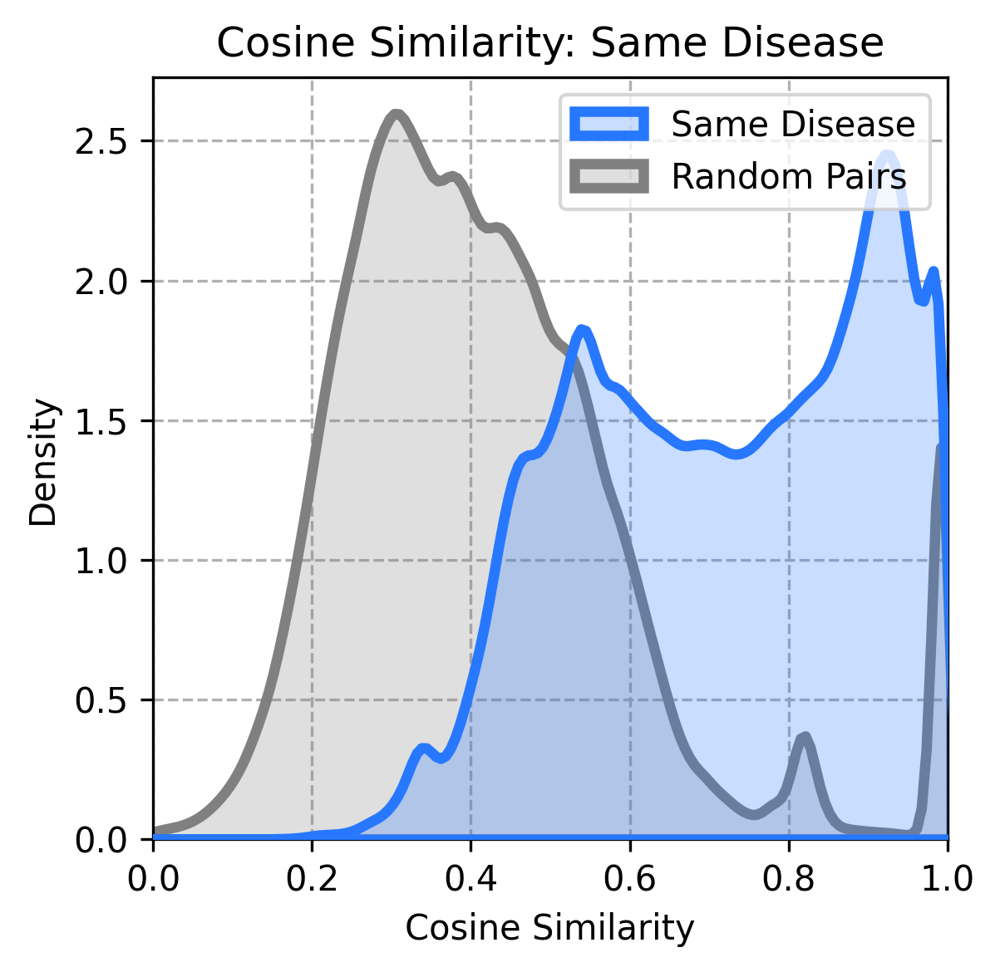

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.49it/s] 


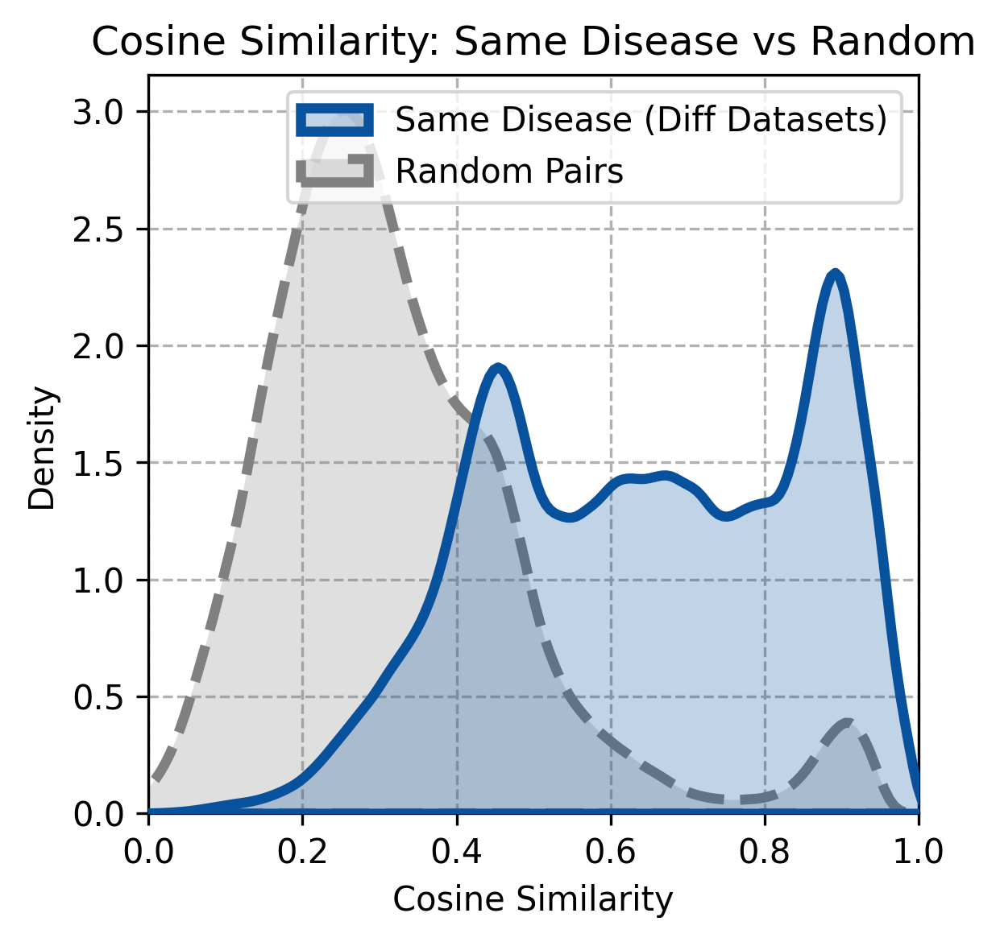

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.81it/s] 


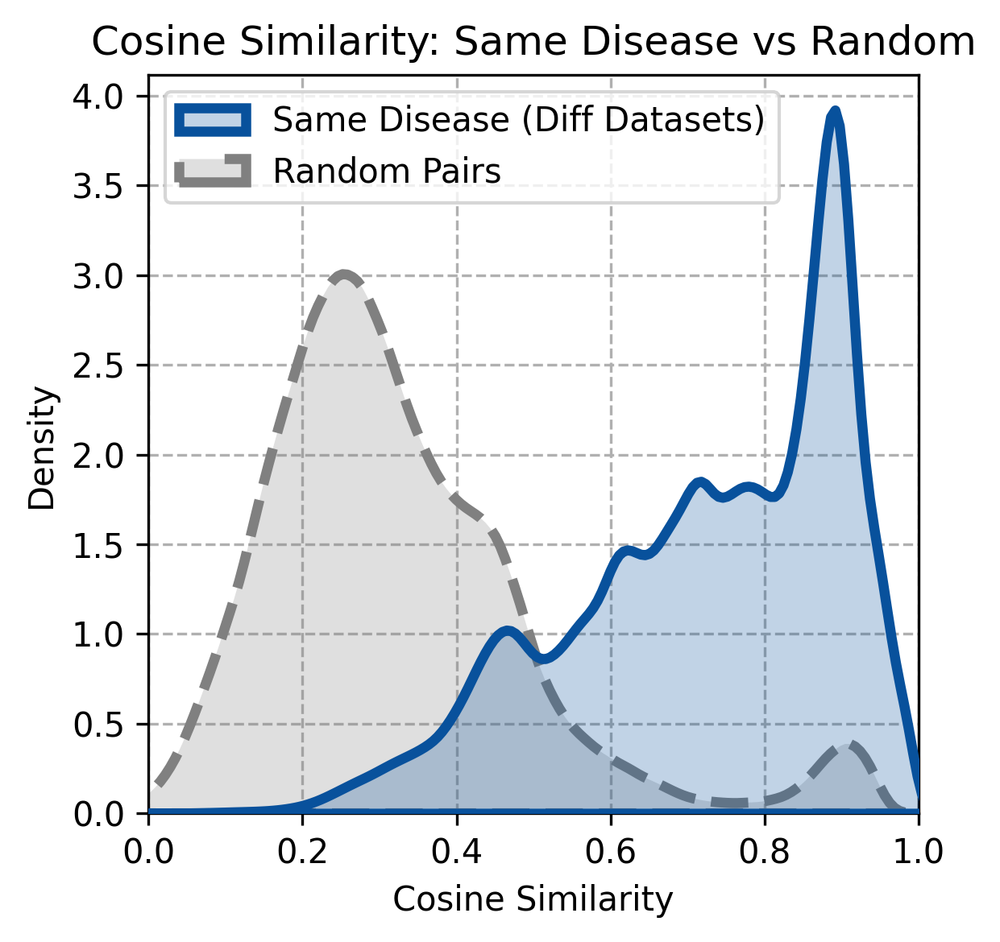

Processing same disease pairs: 100%|██████████| 177/177 [00:07<00:00, 22.86it/s] 


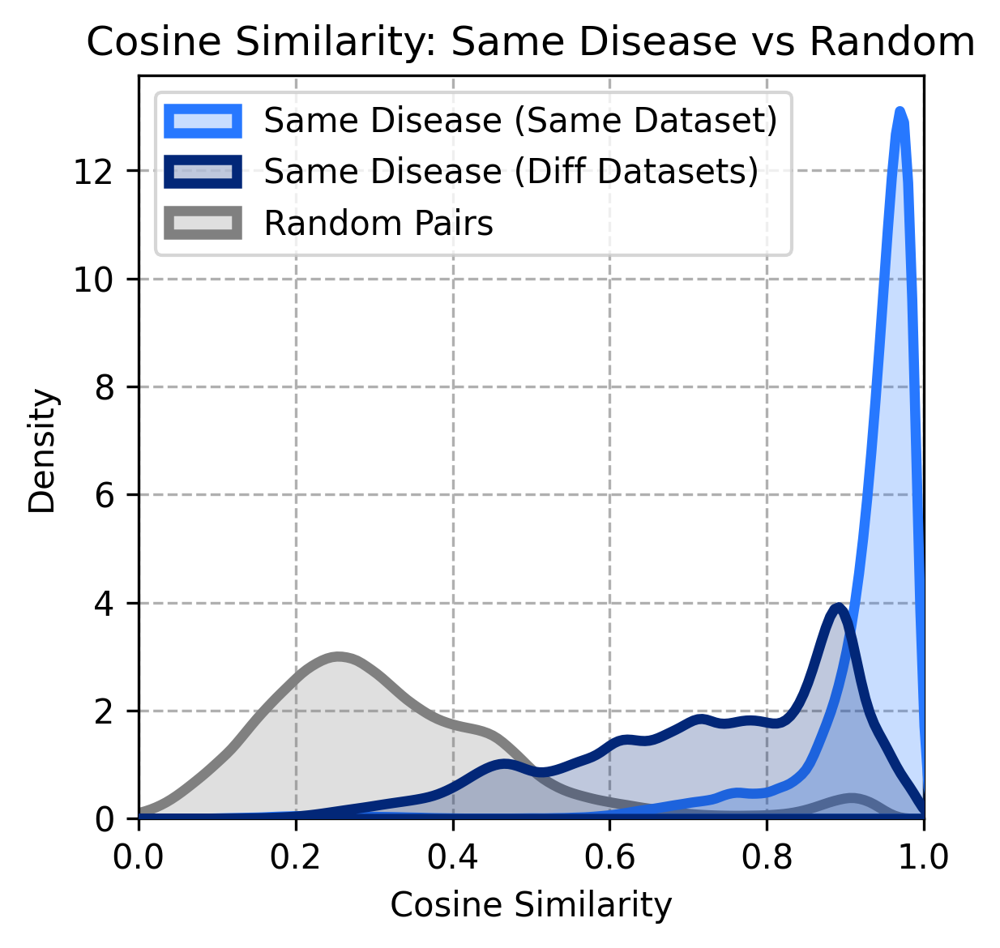

Processing same disease pairs: 100%|██████████| 177/177 [00:00<00:00, 209.94it/s]


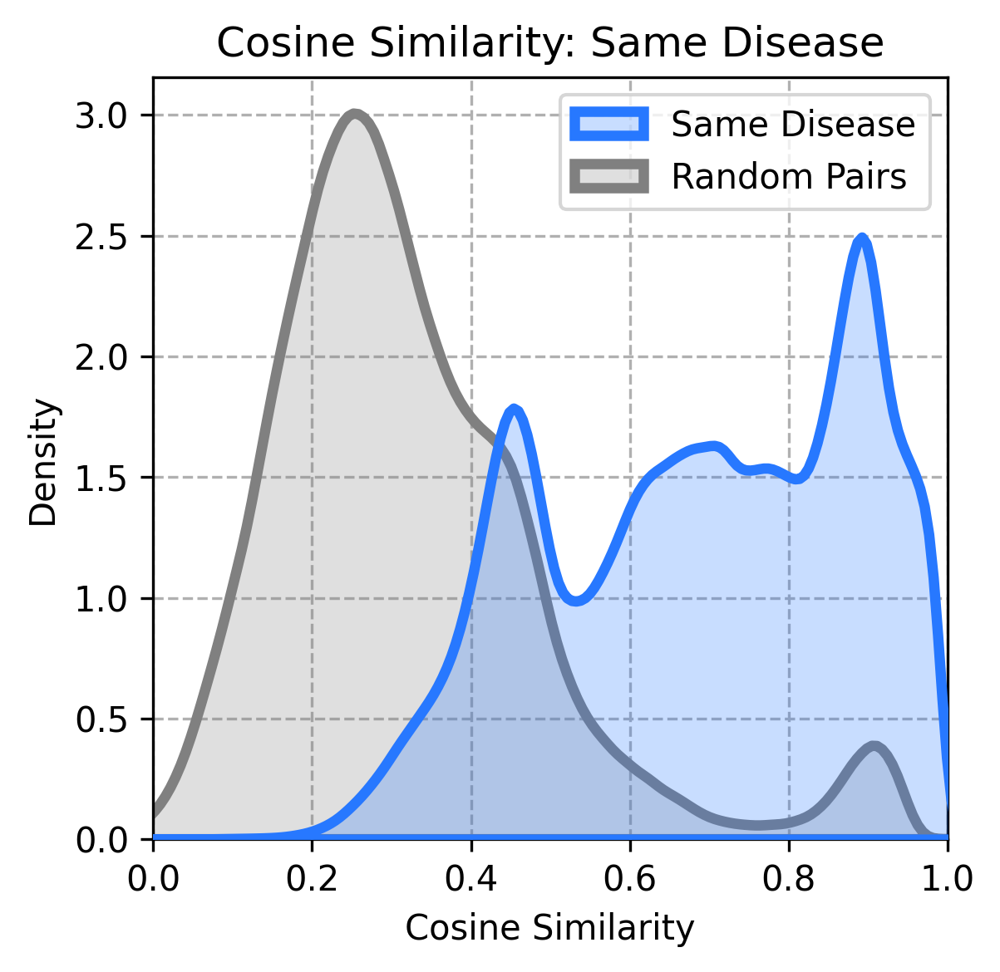

Processing same disease pairs: 100%|██████████| 177/177 [00:09<00:00, 18.07it/s] 


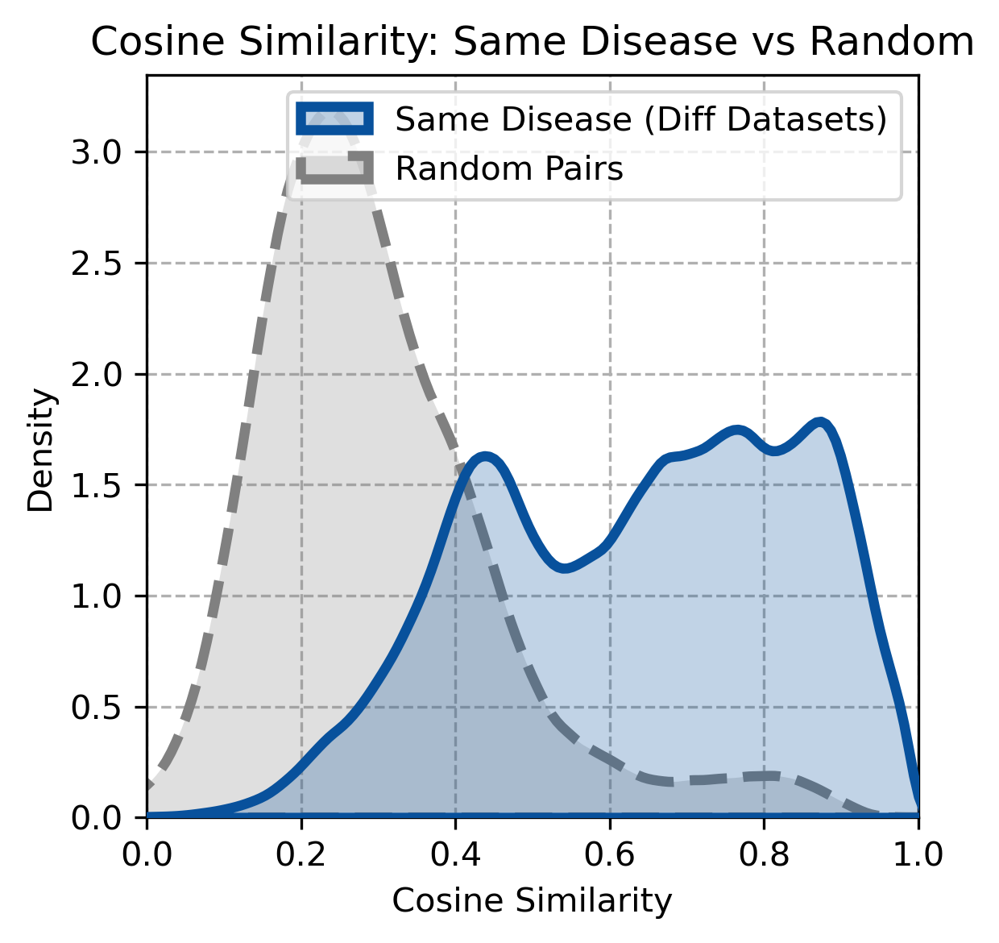

Processing same disease pairs: 100%|██████████| 177/177 [00:09<00:00, 18.15it/s] 


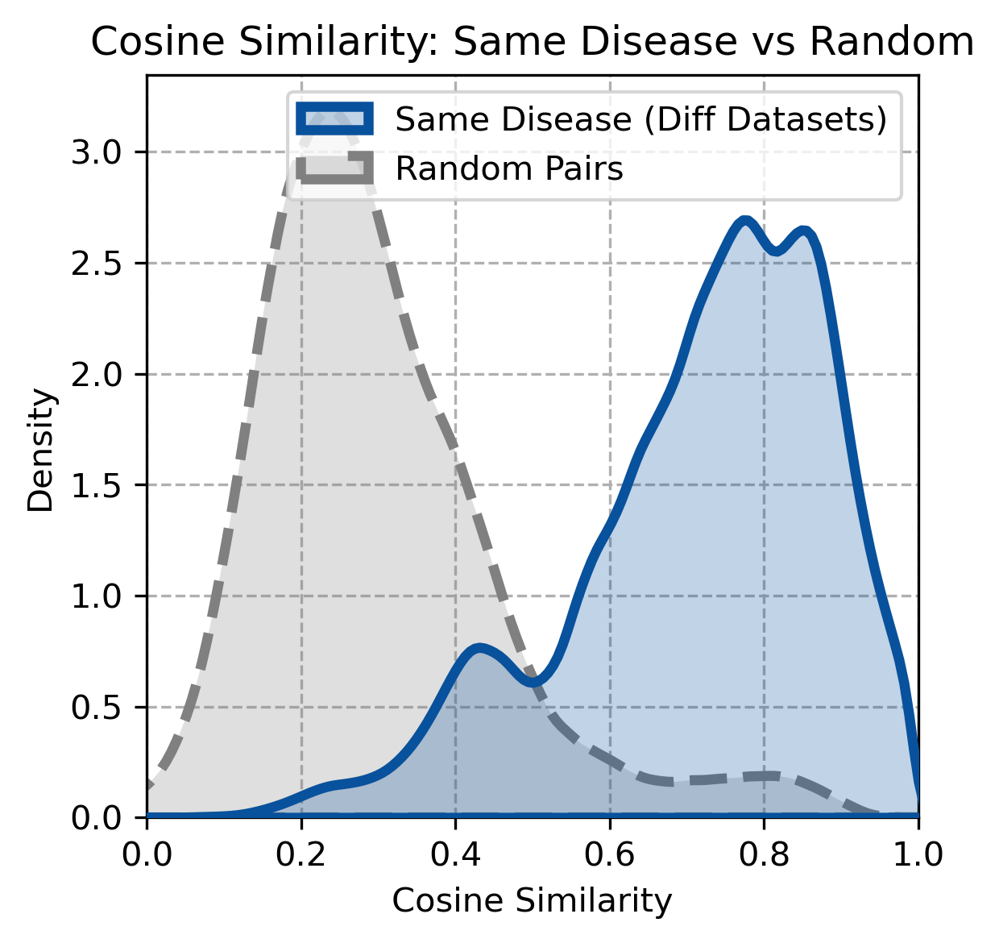

Processing same disease pairs: 100%|██████████| 177/177 [00:09<00:00, 17.86it/s] 


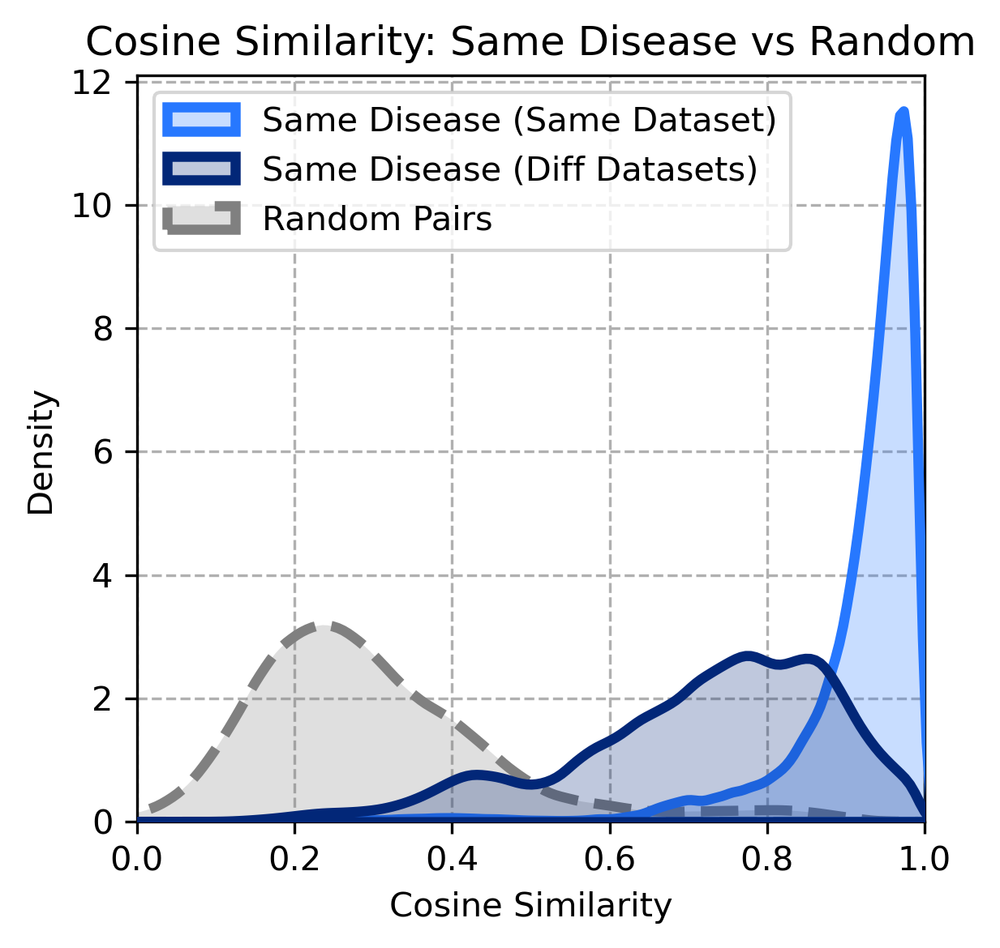

Processing same disease pairs: 100%|██████████| 177/177 [00:00<00:00, 195.72it/s]


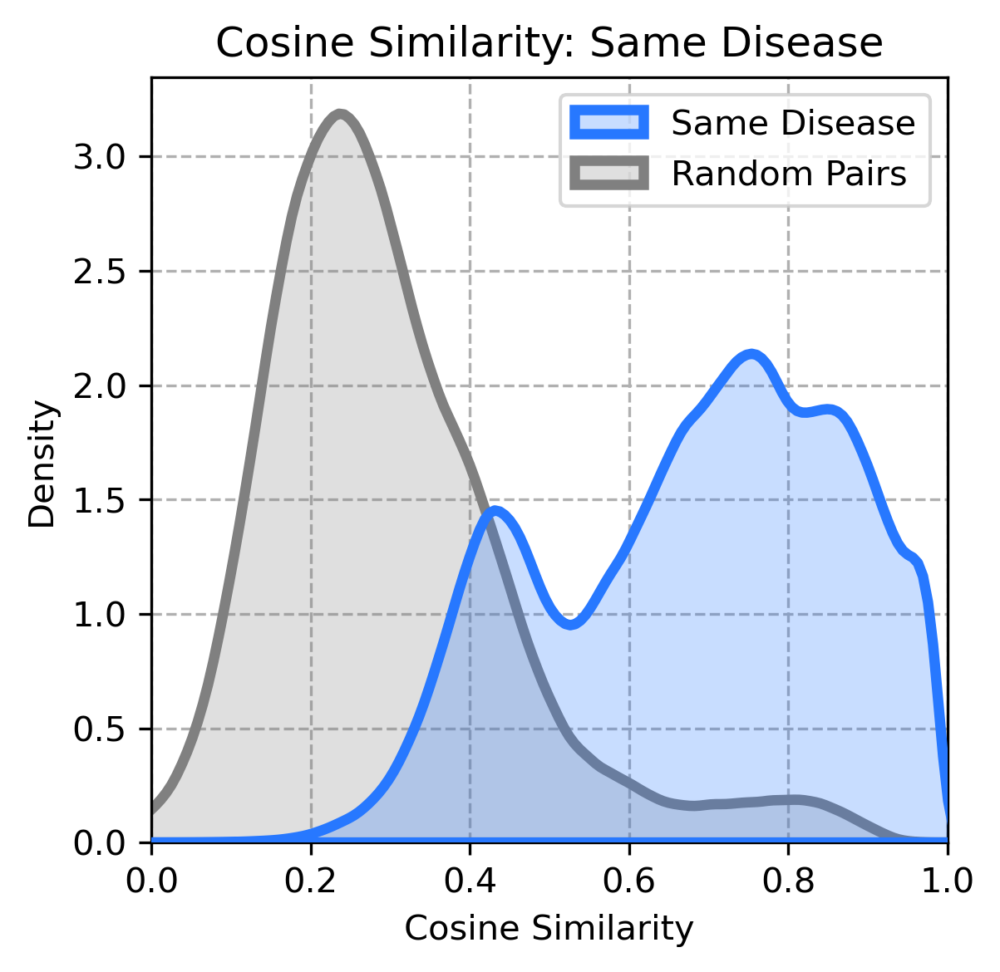

In [24]:
from tqdm import tqdm

# Flattening function for nested lists
flatten = lambda l: [item for sublist in l for item in sublist]

# Resetting index for consistency
adata_train.obs.reset_index(inplace=True, drop=True)
adata_train.obs["is_control"] = ["C" if i.startswith("Control") else "D" for i in adata_train.obs["do_id"]]  

# Step 1: Same Disease, Same Dataset Pairs
_c_same_same = list()
_w_same_same = list()

# Step 2: Same Disease, Different Dataset Pairs
_c_same_diff = list()
_w_same_diff = list()

# Step 3: Control, Same Dataset Pairs
_c_control_same = list()
_w_control_same = list()

# Step 4: Unrelated (Random) Pairs
_c_rand = list()

# Collecting disease and control indexes
doid_to_indices = dict()
for idx, doid in adata_train.obs["do_id"].items():
    if doid not in doid_to_indices:
        doid_to_indices[doid] = []
    doid_to_indices[doid].append(idx)

# Building all valid unrelated disease pairs (sample-level)
unrelated_pairs = []
# pair_key_set = set(df_query["pair_key_doid"].apply(lambda x: tuple(sorted(eval(x)))))
pair_key_set = set(tuple(sorted(p)) for p in df_query["pair_sorted"])

doids = list(doid_to_indices.keys())
n_doids = len(doids)

for i in tqdm(range(n_doids)):
    for j in range(i + 1, n_doids):
        d1, d2 = doids[i], doids[j]

        # Skip same or related disease pairs
        if d1 == d2 or tuple(sorted([d1, d2])) in pair_key_set:
            continue

        # Get all combinations of samples between unrelated diseases
        unrelated_pairs.extend(itertools.product(doid_to_indices[d1], doid_to_indices[d2]))

# Loop over diseases to calculate pairwise similarities
for do_id in tqdm(adata_train.obs["do_id"].unique()):
    # Exclude unrelated controls
    if do_id.startswith("Control"):
        continue

    # Get samples with the same disease
    _df_q = adata_train.obs.query("do_id == @do_id")

    # Group samples by dataset
    datasets = _df_q["dsaid"].unique()

    for dsaid in datasets:
        # Samples from the same dataset (same disease)
        _idxs_same = _df_q.query("dsaid == @dsaid").index

        if len(_idxs_same) < 2:
            continue

        # Pairs within the same dataset
        _idxs_p_same = np.array(list(itertools.combinations(_idxs_same, 2)))
        _w_same_same.extend([len(_idxs_p_same)] * len(_idxs_p_same))

        # Cosine similarity for same dataset pairs
        _c_same_same.extend(c_matrix_train[_idxs_p_same[:, 0], _idxs_p_same[:, 1]])

    # Different datasets (same disease)
    if len(datasets) > 1:
        for dsaid1, dsaid2 in itertools.combinations(datasets, 2):
            _idxs1 = _df_q.query("dsaid == @dsaid1").index
            _idxs2 = _df_q.query("dsaid == @dsaid2").index

            # Cross-dataset pairs
            _idxs_p_diff = np.array(list(itertools.product(_idxs1, _idxs2)))
            _w_same_diff.extend([len(_idxs_p_diff)] * len(_idxs_p_diff))

            # Cosine similarity for different dataset pairs
            _c_same_diff.extend(c_matrix_train[_idxs_p_diff[:, 0], _idxs_p_diff[:, 1]])

    # Control, Same Dataset Pairs
    for dsaid in datasets:
        _c_idx = adata_train.obs.query(f"dsaid == '{dsaid}' and is_control == 'C'").index
        _d_idx = adata_train.obs.query(f"dsaid == '{dsaid}' and is_control == 'D'").index

        # Get combinations of control vs disease indexes
        pairs_c = list(itertools.product(_c_idx, _d_idx))

        # Cosine similarity for control vs disease in same dataset
        for pair in pairs_c:
            _c_control_same.append(c_matrix_train[int(pair[0]), int(pair[1])])
            _w_control_same.append(1)

# Unrelated (Random) Pairs
np.random.seed(42)
selected_idxs = np.random.choice(len(unrelated_pairs), size=len(_c_same_same), replace=False)
_rand_sample_pairs = [unrelated_pairs[i] for i in selected_idxs]
_c_rand = [c_matrix_train[int(i), int(j)] for i, j in _rand_sample_pairs]

# Normalize weights
_w_same_same = np.array(_w_same_same) / len(_c_same_same)
_w_same_diff = np.array(_w_same_diff) / len(_c_same_diff)
_w_control_same = np.array(_w_control_same) / len(_c_control_same)

# Plot the distributions
plt.figure(figsize=(6, 4), dpi=300)

# Same Disease, Same Dataset
sns.kdeplot(x=_c_same_same, weights=_w_same_same, label="Same Disease, Same Dataset", fill=True, zorder=3, color="#022778ff", linewidth=3)

# Same Disease, Different Dataset
sns.kdeplot(x=_c_same_diff, weights=_w_same_diff, label="Same Disease, Diff. Dataset", fill=True, zorder=3, color="#2778ffff", linewidth=3)

# Control, Same Dataset
sns.kdeplot(x=_c_control_same, weights=_w_control_same, label="Control, Same Dataset", fill=True, zorder=4, color="#aa0000ff", linewidth=3)

# Unrelated (Random) Pairs
sns.kdeplot(_c_rand, label="Unrelated", fill=True, zorder=2, linewidth=3, color="gray")

# Plot aesthetics
plt.title("Cosine Similarity: Disease vs Control")
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.xlim(0, 1)
plt.grid(zorder=-3, linestyle="--")
plt.show()

##d6f3ffff


 11%|█         | 2/19 [00:05<00:50,  2.95s/it]


KeyboardInterrupt: 

100%|██████████| 19/19 [02:02<00:00,  6.43s/it]


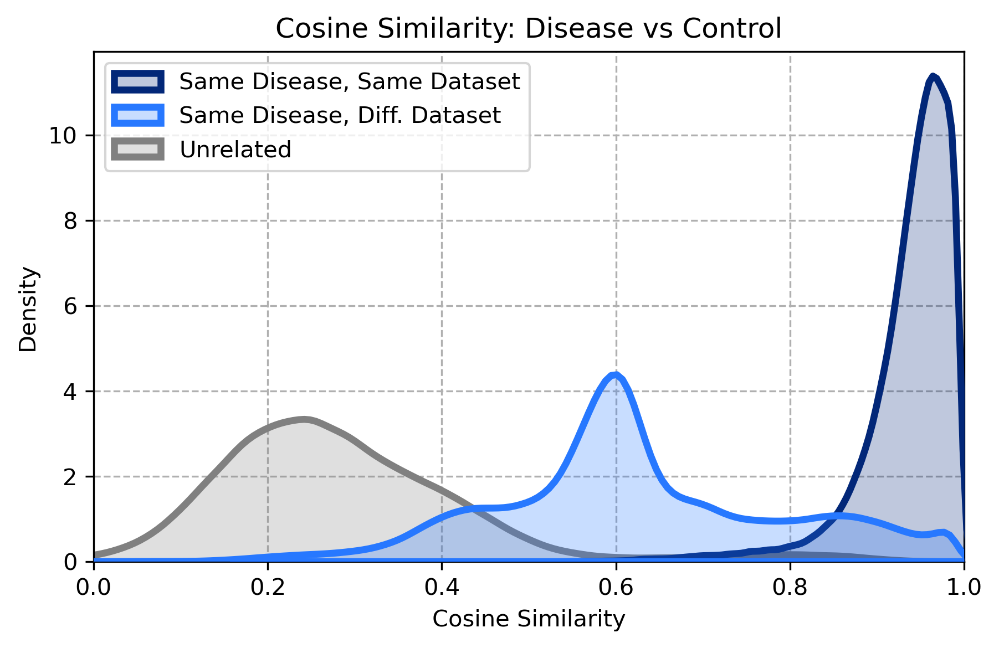

,do1,do2,pair_sorted,resnik,lin,jiang,mica_node,shortest_path_length
1017224,DOID:0040085,DOID:0050433,"[DOID:0040085, DOID:0050433]",4.190500,0.404260,12.350714,DOID:0050117,4
1018358,DOID:0040085,DOID:0060645,"[DOID:0040085, DOID:0060645]",5.473063,0.518788,10.153313,DOID:104,3
1023685,DOID:0040085,DOID:11100,"[DOID:0040085, DOID:11100]",5.473063,0.538522,9.380123,DOID:104,3
1023770,DOID:0040085,DOID:11265,"[DOID:0040085, DOID:11265]",5.473063,0.525320,9.890948,DOID:104,3
1023934,DOID:0040085,DOID:11729,"[DOID:0040085, DOID:11729]",5.473063,0.538522,9.380123,DOID:104,3
...,...,...,...,...,...,...,...,...
70397465,DOID:9261,DOID:9503,"[DOID:9261, DOID:9503]",4.882485,0.441943,12.330565,DOID:1579,7
70402531,DOID:9282,DOID:9821,"[DOID:9282, DOID:9821]",4.453679,0.422787,12.160829,DOID:5614,4
70432075,DOID:9655,DOID:9663,"[DOID:9655, DOID:9663]",6.064631,0.583243,8.666992,DOID:403,4
70432121,DOID:9655,DOID:9778,"[DOID:9655, DOID:9778]",4.126870,0.402453,12.254830,DOID:77,4


# 3. Benchmark Disease Related Disease Similarity

In [71]:
"""Benchmark Disease Related Disease Similarity

Structure:
    1. Imports, Variables, Functions
    2. Plot Similarity
"""
# 1. Imports, Variables, Functions
# imports


# variables


# functions

def plot_kde_for_shortest_path_relatedness(
    c_matrix, adata_obs, df_query, s_p, colors=None
):
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    import itertools

    if isinstance(s_p, int):
        s_p = [s_p]
    if colors is None:
        colors = ["#ff9e9d", "#fb731d", "#fcbb01", "#2778ff", "#d6f3ff"]  # default palette

    unrelated_keys = set(tuple(sorted(p)) for p in df_query["pair_sorted"])
    print(len(unrelated_keys), "unrelated disease pairs")
    do_ids = adata_obs["do_id_study"].values

    plt.figure(figsize=(4, 4), dpi=300)

    for i, sp_val in enumerate(s_p):
        _df_query = df_query.query(f"shortest_path_length == {sp_val}")
        print(f"[SP {sp_val}] Nº of related disease pairs: {len(_df_query)}")

        _c_related = []
        _w_related = []

        for _, row in _df_query.iterrows():
            do1, do2 = row["do1"], row["do2"]
            idx1 = np.where(do_ids == do1)[0]
            idx2 = np.where(do_ids == do2)[0]
            if len(idx1) == 0 or len(idx2) == 0:
                continue
            idx_pairs = np.array(list(itertools.product(idx1, idx2)))
            _c_related.extend(c_matrix[idx_pairs[:, 0], idx_pairs[:, 1]])
            _w_related.extend([len(idx_pairs)] * len(idx_pairs))

        _c_related = np.array(_c_related)
        _w_related = np.array(_w_related) / len(_c_related)

        sns.kdeplot(
            x=_c_related,
            weights=_w_related,
            label=f"{sp_val} (n={len(_c_related)})",
            fill=True,
            color=colors[i % len(colors)],
            zorder=3,
            linewidth=3,
        )

    # Add shared random baseline
    n_needed = len(_c_related) // 10
    print("n_needed", n_needed)
    print("len(c_relate)", len(_c_related))

    rand_pairs = set()
    while len(rand_pairs) < n_needed:
        a, b = np.random.choice(len(do_ids), 2, replace=False)
        do1, do2 = do_ids[a], do_ids[b]
        if do1 == do2:
            continue
        if tuple(sorted([do1, do2])) in unrelated_keys:
            continue
        rand_pairs.add((a, b))

    rand_pairs = np.array(list(rand_pairs))
    print(len(rand_pairs))
    _c_rand = c_matrix[rand_pairs[:, 0], rand_pairs[:, 1]]
    sns.kdeplot(_c_rand, label="Unrelated", fill=True, color="gray", linewidth=3,  zorder=2)

    plt.title("Cosine Similarity: Related Diseases")
    plt.xlabel("Cosine Similarity")
    plt.ylabel("Density")

    # plot legend title
    plt.legend(title="DO disease distance")

    plt.tight_layout()
    plt.xlim(0, 1)
    plt.grid(zorder=-3, linestyle="--")
    plt.show()

def plot_roc_for_shortest_path_relatedness(
    c_matrix, adata_obs, df_query, s_p, colors=None, weights_bool=True
):
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    if isinstance(s_p, int):
        s_p = [s_p]
    if colors is None:
        colors = ["#ff9e9d", "#fb731d", "#fcbb01", "grey","#2778ff", ]

    unrelated_keys = set(tuple(sorted(p)) for p in df_query["pair_sorted"])
    do_ids = adata_obs["do_id_study"].values

    plt.figure(figsize=(4, 4), dpi=300)

    for i, sp_val in enumerate(s_p):
        _df_query = df_query.query(f"shortest_path_length == {sp_val}")
        _c_related = []
        _w_related = []

        for _, row in _df_query.iterrows():
            do1, do2 = row["do1"], row["do2"]
            idx1 = np.where(do_ids == do1)[0]
            idx2 = np.where(do_ids == do2)[0]
            if len(idx1) == 0 or len(idx2) == 0:
                continue
            idx_pairs = np.array(list(itertools.product(idx1, idx2)))
            _c_related.extend(c_matrix[idx_pairs[:, 0], idx_pairs[:, 1]])
            _w_related.extend([len(idx_pairs)] * len(idx_pairs))

        _c_related = np.array(_c_related)
        _w_related = np.array(_w_related)

        # Negative sampling
        rand_pairs = set()
        while len(rand_pairs) < len(_c_related):
            a, b = np.random.choice(len(do_ids), 2, replace=False)
            do1, do2 = do_ids[a], do_ids[b]
            if do1 == do2:
                continue
            if tuple(sorted([do1, do2])) in unrelated_keys:
                continue
            rand_pairs.add((a, b))
        rand_pairs = np.array(list(rand_pairs))
        _c_rand = c_matrix[rand_pairs[:, 0], rand_pairs[:, 1]]
        _w_rand = np.ones(len(_c_rand))

        # ROC computation
        y_true = np.concatenate([np.ones(len(_c_related)), np.zeros(len(_c_rand))])
        scores = np.concatenate([_c_related, _c_rand])
        weights = np.concatenate([_w_related, _w_rand])

        if weights_bool:
            fpr, tpr, _ = roc_curve(y_true, scores, sample_weight=weights)
        else:
            fpr, tpr, _ = roc_curve(y_true, scores)
        roc_auc = auc(fpr, tpr)

        plt.plot(
            fpr,
            tpr,
            label=f"{sp_val} (AUROC = {roc_auc:.2f})",
            color=colors[i],
            linewidth=3,
        )

    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("AUROC")
    plt.legend()
    plt.tight_layout()
    plt.grid(linestyle="--", zorder=-1)
    plt.show()



In [19]:
do_df_ic_query["lin"].describe()

count    778.000000
mean       0.539391
std        0.102141
min        0.418467
25%        0.448338
50%        0.535249
75%        0.581928
max        0.956801
Name: lin, dtype: float64

In [20]:
plt.hist(df_query["lin"].values, bins=[0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1], edgecolor="black")

NameError: name 'df_query' is not defined

In [51]:
from collections import Counter
Counter(_bins)

Counter({'0.4-0.6': 615, '0.6-0.8': 147, '0.8-1': 16})

,do1,do2,pair_sorted,resnik,lin,jiang,mica_node,shortest_path_length
1023685,DOID:0040085,DOID:11100,"[DOID:0040085, DOID:11100]",5.473063,0.538522,9.380123,DOID:104,3
1023770,DOID:0040085,DOID:11265,"[DOID:0040085, DOID:11265]",5.473063,0.525320,9.890948,DOID:104,3
1023934,DOID:0040085,DOID:11729,"[DOID:0040085, DOID:11729]",5.473063,0.538522,9.380123,DOID:104,3
1024734,DOID:0040085,DOID:14115,"[DOID:0040085, DOID:14115]",5.473063,0.538522,9.380123,DOID:104,3
1025007,DOID:0040085,DOID:1586,"[DOID:0040085, DOID:1586]",5.473063,0.543396,9.197801,DOID:104,2
...,...,...,...,...,...,...,...,...
70384691,DOID:9146,DOID:9513,"[DOID:9146, DOID:9513]",5.486996,0.484532,11.674644,DOID:75,9
70386583,DOID:9164,DOID:9206,"[DOID:9164, DOID:9206]",7.238750,0.705924,6.031070,DOID:6050,2
70402531,DOID:9282,DOID:9821,"[DOID:9282, DOID:9821]",4.453679,0.422787,12.160829,DOID:5614,4
70432075,DOID:9655,DOID:9663,"[DOID:9655, DOID:9663]",6.064631,0.583243,8.666992,DOID:403,4


778 unrelated disease pairs
[SP '0.8-1'] Nº of related disease pairs: 16
[SP '0.6-0.8'] Nº of related disease pairs: 147
[SP '0.4-0.6'] Nº of related disease pairs: 615
n_needed 362386
len(c_relate) 3623864
362386


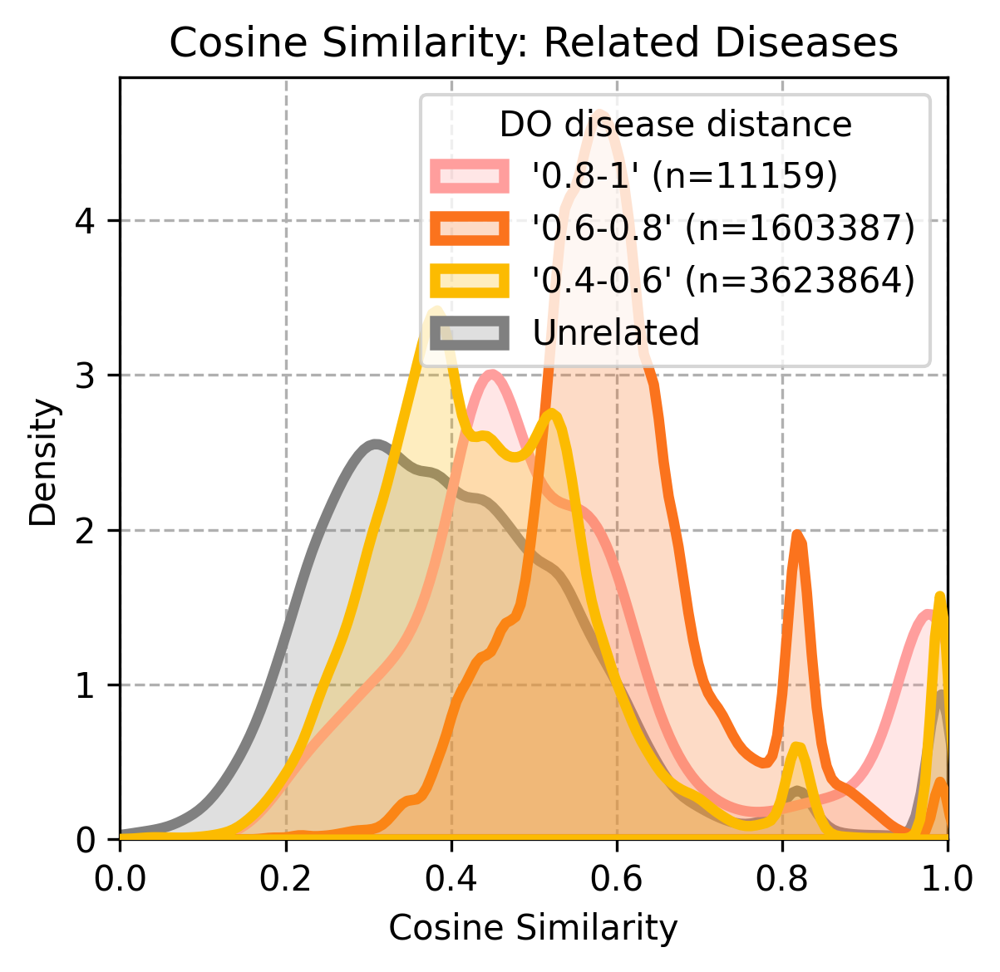

In [ ]:
df_query = do_df_ic_query.copy()

def get_bins(vals, bins):
    """
    Get the bin for each value in vals based on the provided bins.
    """
    bin_list = list()
    for val in vals:
        for i in range(len(bins) - 1):
            if bins[i] <= val < bins[i + 1]:
                bin_list.append((f"{bins[i]}-{bins[i + 1]}"))
                break
    return bin_list



_bins = get_bins(df_query["lin"].values,[0,0.2,0.4,0.6,0.8,1])
_bin_labels = ["'0.4-0.6'","'0.6-0.8'","'0.8-1'",]

# _bins = get_bins(df_query["lin"].values,[0,0.1,0.2, 0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
# _bin_labels = ["'0.4-0.5'","'0.5-0.6'","'0.6-0.7'","'0.7-0.8'","'0.8-0.9'","'0.9-1'",]


df_query = df_query.copy()
df_query["shortest_path_length"] = _bins

df_query["shortest_path_length"].value_counts()

# KDE
plot_kde_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=_bin_labels[::-1],
)


plot_roc_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=_bin_labels[::-1])

In [ ]:
s_p=["0.4-0.6","0.6-0.8","0.8-1",]

for i, sp_val in enumerate(s_p):
    _df_query = df_query.query(f"shortest_path_length == '{sp_val}'")
    print(f"[SP {sp_val}] Nº of related disease pairs: {len(_df_query)}")

# KDE
plot_kde_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=["'0.4-0.6'","'0.6-0.8'","'0.8-1'",][::-1],
)


plot_roc_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=["'0.4-0.6'","'0.6-0.8'","'0.8-1'",][::-1])

[SP 0.4-0.6] Nº of related disease pairs: 615
[SP 0.6-0.8] Nº of related disease pairs: 147
[SP 0.8-1] Nº of related disease pairs: 16
778 unrelated disease pairs
[SP '0.8-1'] Nº of related disease pairs: 16
[SP '0.6-0.8'] Nº of related disease pairs: 147
[SP '0.4-0.6'] Nº of related disease pairs: 615
n_needed 362386
len(c_relate) 3623864
362386


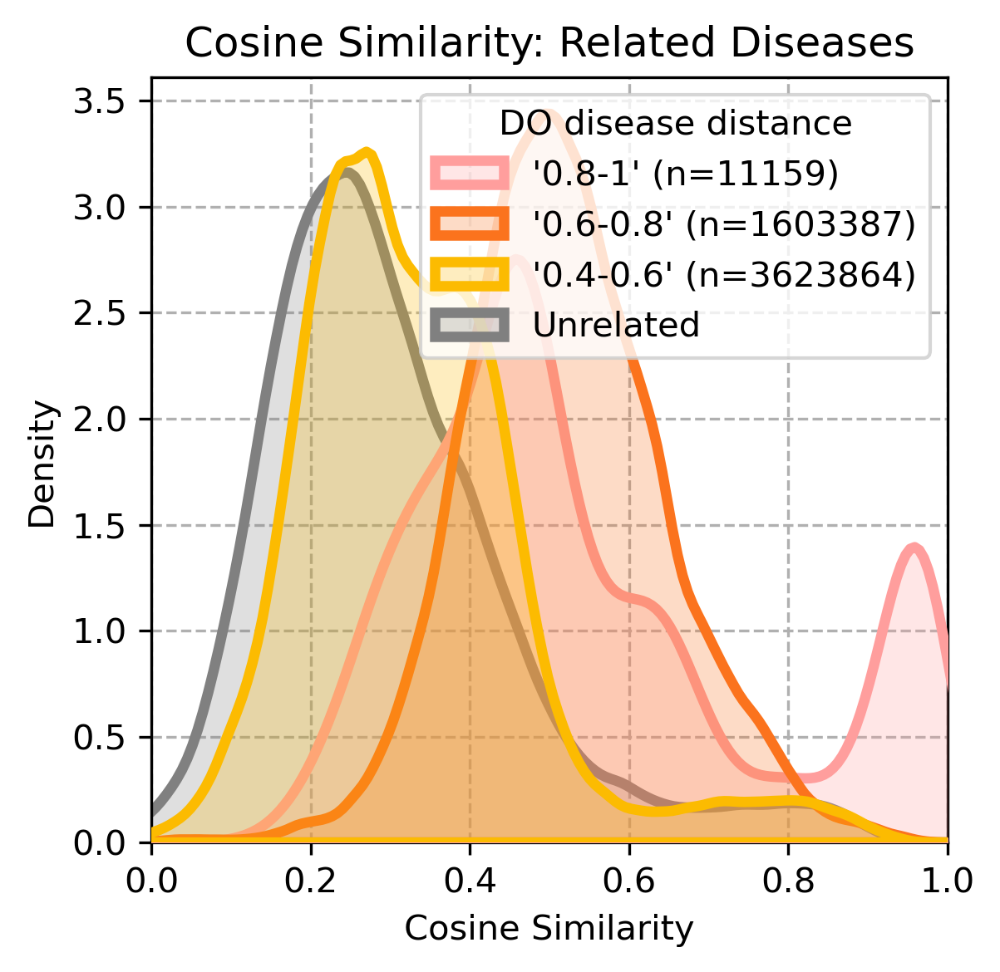

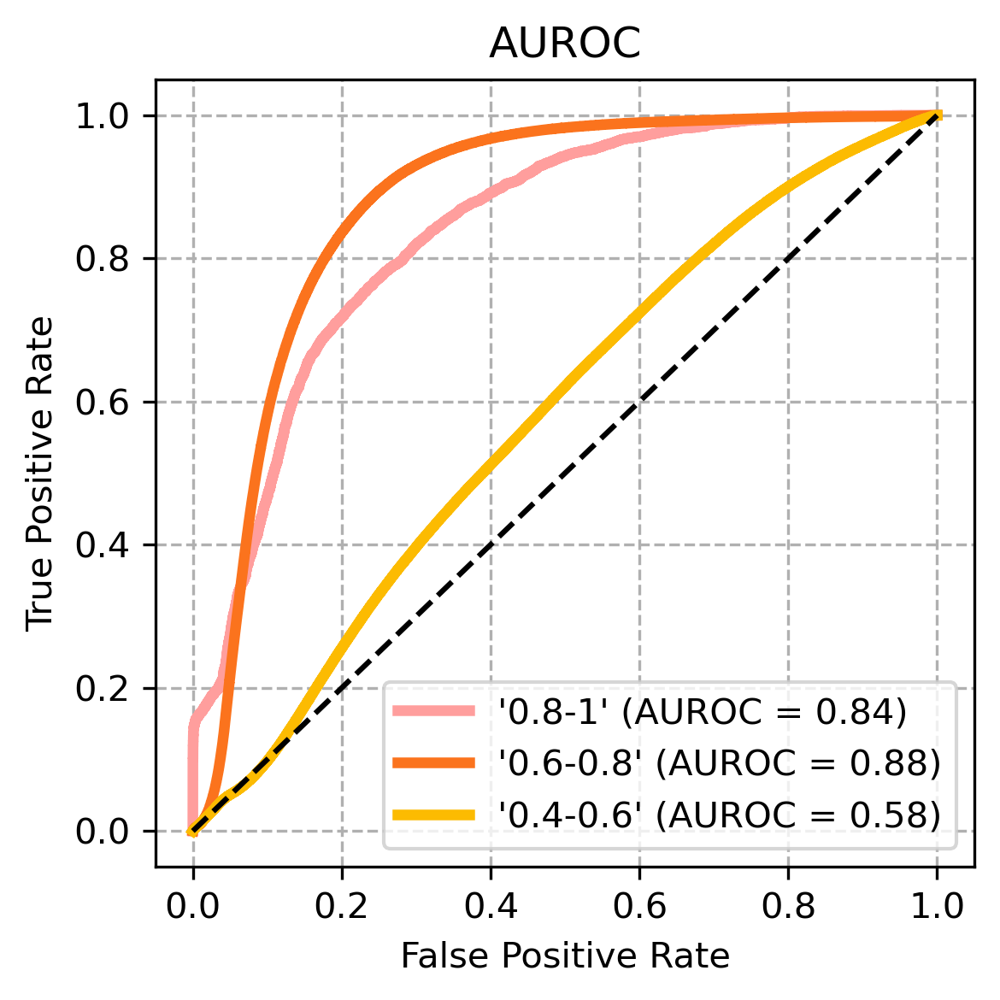

In [60]:

s_p=["0.4-0.6","0.6-0.8","0.8-1",]

for i, sp_val in enumerate(s_p):
    _df_query = df_query.query(f"shortest_path_length == '{sp_val}'")
    print(f"[SP {sp_val}] Nº of related disease pairs: {len(_df_query)}")

# KDE
plot_kde_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=["'0.4-0.6'","'0.6-0.8'","'0.8-1'",][::-1],
)


plot_roc_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=["'0.4-0.6'","'0.6-0.8'","'0.8-1'",][::-1])

778 unrelated disease pairs
[SP 2] Nº of related disease pairs: 79
[SP 3] Nº of related disease pairs: 126
[SP 5] Nº of related disease pairs: 131
n_needed 157791
len(c_relate) 1577914
157791


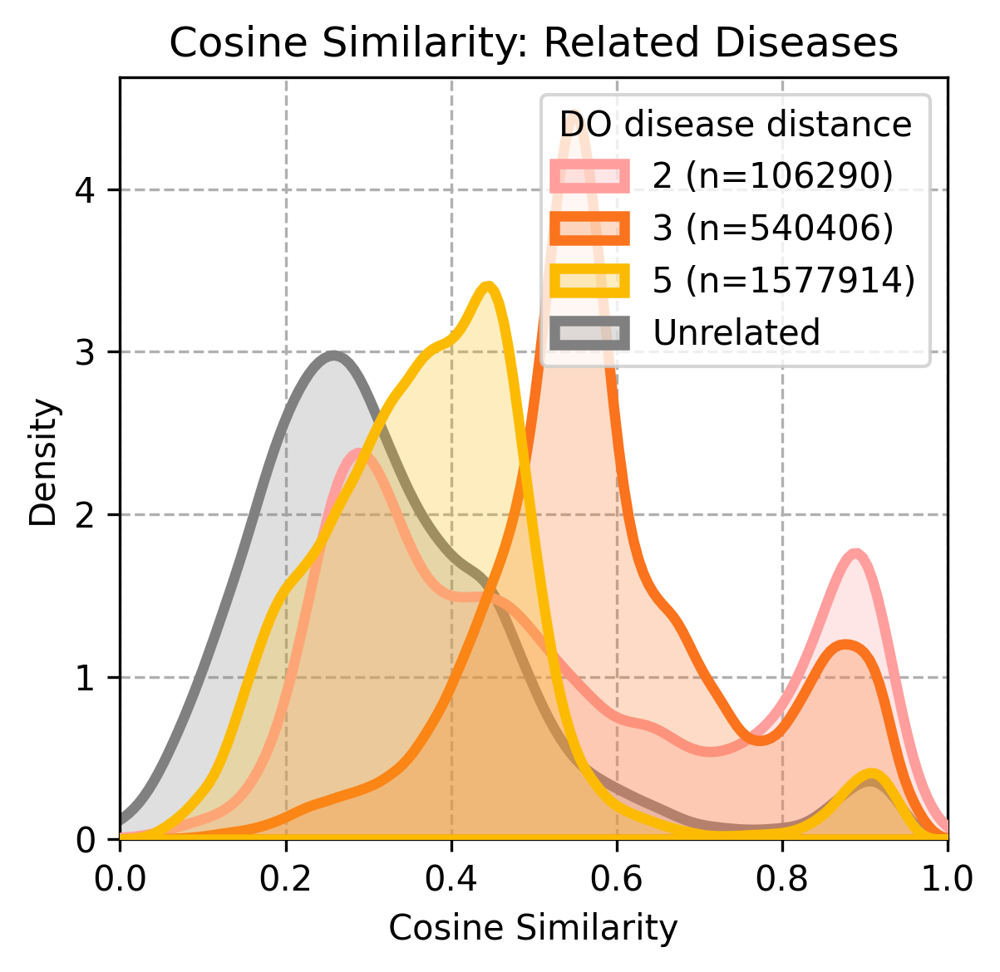

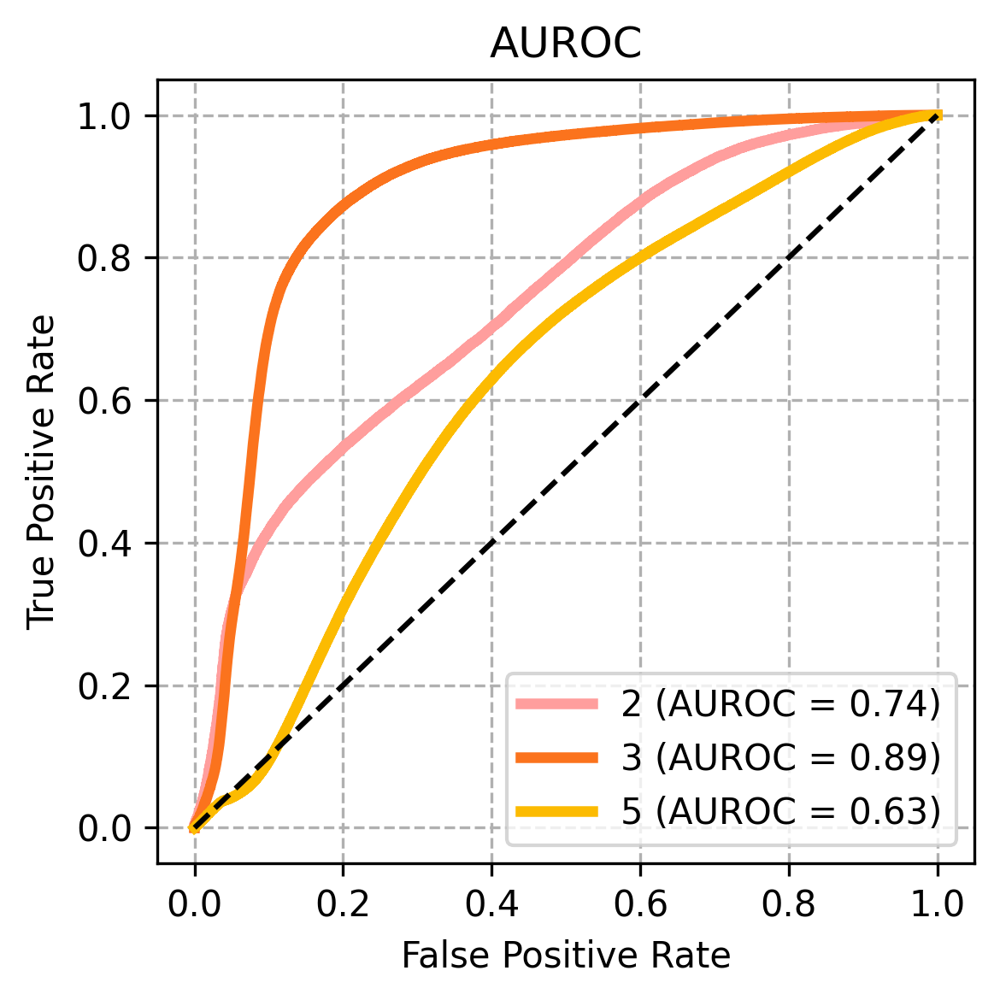

In [23]:
# 2. Plot Similarity
df_query = do_df_ic_query.copy()
# KDE
plot_kde_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=[2, 3, 5],
)


plot_roc_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=[2, 3, 5])

778 unrelated disease pairs
[SP 2] Nº of related disease pairs: 79
[SP 3] Nº of related disease pairs: 126
[SP 5] Nº of related disease pairs: 131
n_needed 157791
len(c_relate) 1577914
157791


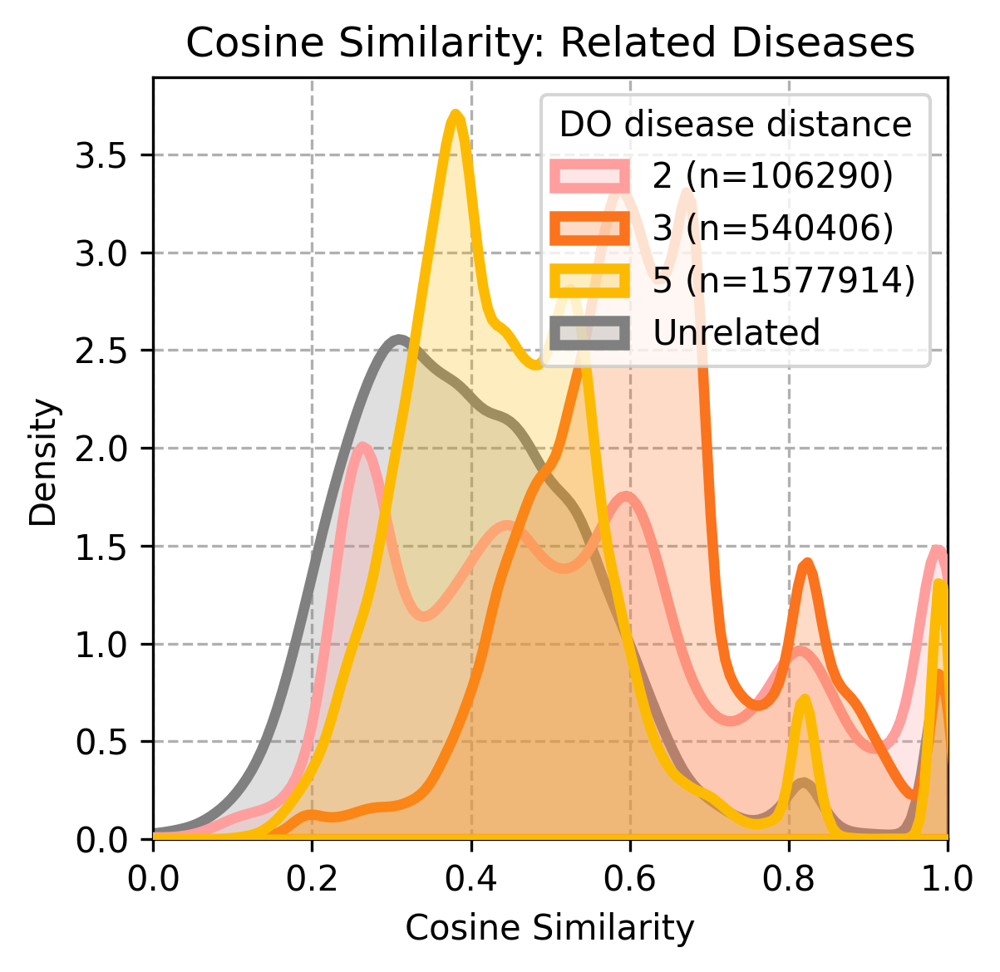

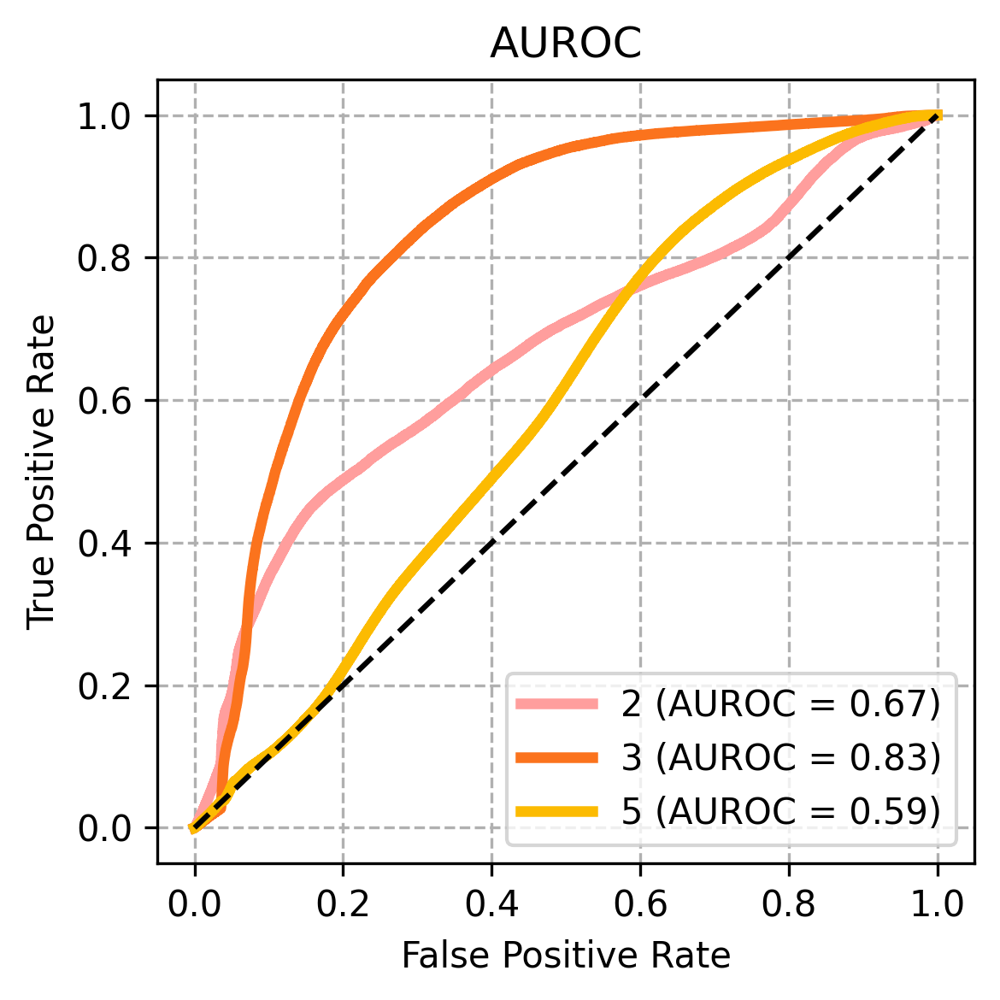

In [72]:
# 2. Plot Similarity
df_query = do_df_ic_query.copy()
# KDE
plot_kde_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=[2, 3, 5],
)


plot_roc_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=[2, 3, 5])

[SP 2] Nº of related disease pairs: 38
[SP 3] Nº of related disease pairs: 29
[SP 5] Nº of related disease pairs: 15


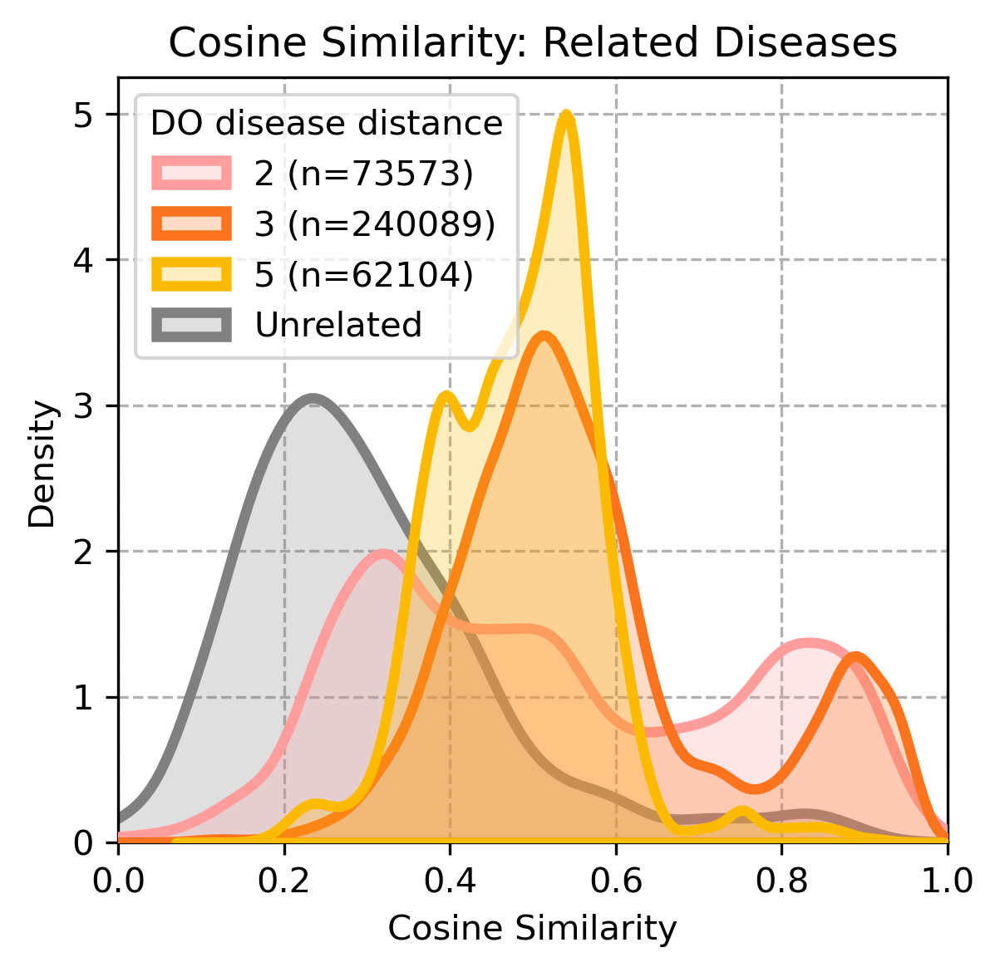

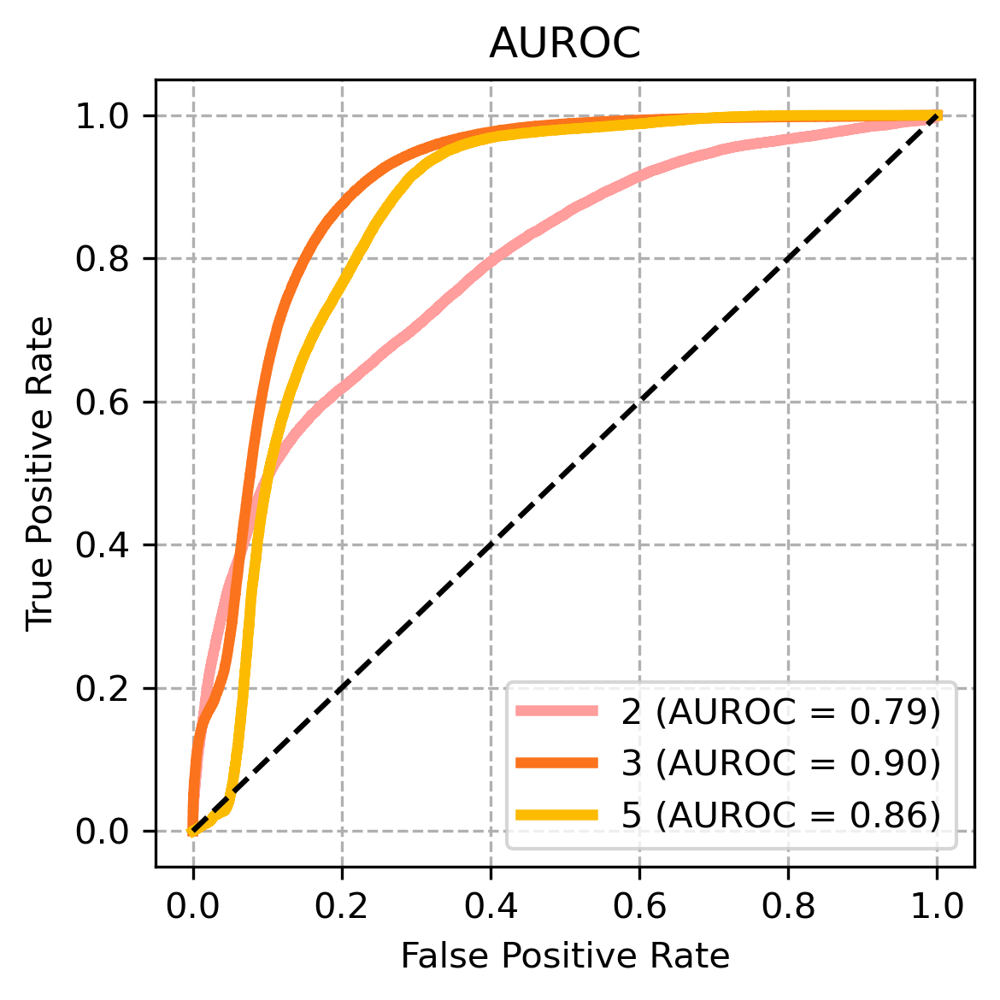

In [20]:
df_query = do_df_ic_query_99.copy()
plot_kde_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=[2, 3, 5],
)

# ROC
plot_roc_for_shortest_path_relatedness(
    c_matrix_train, adata_train.obs, df_query, s_p=[2, 3, 5])

Nº of pairs: 79
Cosine Similarity Values: 106290
Mean Cosine Similarity: 0.5109938786388653
Nº of pairs: 106290
Random Cosine Similarity Values: 10629


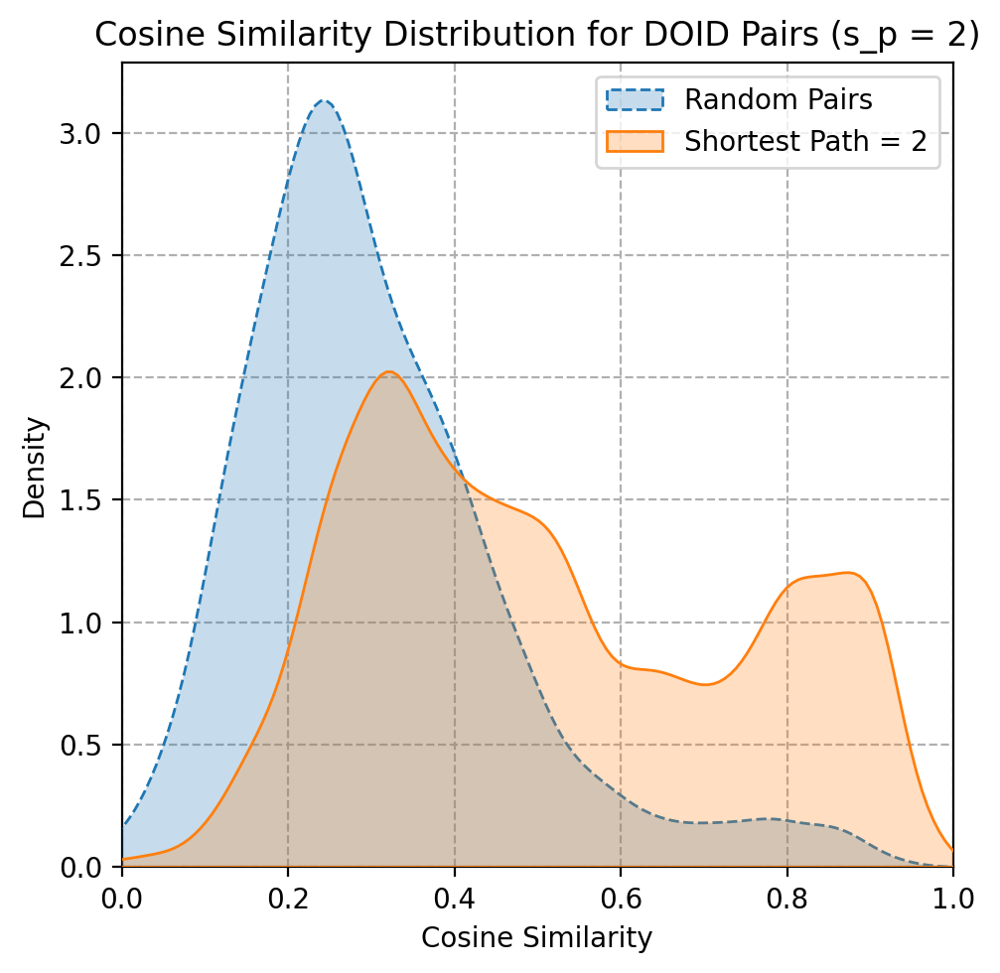

Nº of pairs: 136
Cosine Similarity Values: 548334
Mean Cosine Similarity: 0.5347784148019035
Nº of pairs: 548334


KeyboardInterrupt: 

In [ ]:
# get indexes of pairs 
for s_p in [2,3,4,5]:
    # get pairs w/ shortest path
    _df_query = df_query.query(f"shortest_path_length == {s_p}")

    print(f"Nº of pairs: {len(_df_query)}")

    _c_related = list()
    _w_related = list()

    for _, _row in _df_query.iterrows():

        _n1, _n2 = _row["do1"], _row["do2"]

        # get indexes of nodes
        _idx1 = np.where(adata_train.obs["do_id_study"] == _n1)[0]
        _idx2 = np.where(adata_train.obs["do_id_study"] == _n2)[0]

        # get all combinations between indexes
        _idxs_p = np.array(list(itertools.product(_idx1, _idx2)))
        
        if len(_idxs_p) < 1:
            print(_n1, _n2)
            continue
        
        _w = [len(_idxs_p)]*len(_idxs_p)
        
        # get cosine similarity
        _c_related.extend(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])
        _w_related.extend(_w)

    # normalize weights by total
    _w_related = np.array(_w_related) / len(_c_related)

    print(f"Cosine Similarity Values: {len(_c_related)}")
    print(f"Mean Cosine Similarity: {np.mean(_c_related)}")
    print(f"Nº of pairs: {len(_c_related)}")
    # random distribution
    i = 0
    _rand_idxs = list()
    while i < len(_c_related)/10:
        # print("Selecting random pairs...")
        # get random indexes
        _idx1, _idx2 = np.random.choice(
            np.arange(len(adata_train)), 2, replace=False
        )

        # retrieve do ids
        rand_n1 = adata_train.obs["do_id_study"].iloc[_idx1]
        rand_n2 = adata_train.obs["do_id_study"].iloc[_idx2]

        # filter out same disease pairs
        if rand_n1 == rand_n2:
            continue

        # filter out related disease pairs
        if str(tuple(sorted([rand_n1, rand_n2]))) in df_query["pair_sorted"].to_list():
            continue

        # store indexes
        _rand_idxs.append([_idx1, _idx2])

        i += 1
        print(f"{i}/{len(_c_related)}", end="\r")

    # retrieve embeddings
    _rand_idxs = np.array(_rand_idxs)
    _c_rand = c_matrix_train[_rand_idxs[:,0], _rand_idxs[:,1]]
        
    print(f"Random Cosine Similarity Values: {len(_c_rand)}")

    plt.figure(figsize=(5, 5), dpi=200)
    sns.kdeplot(_c_rand, label="Random Pairs", linestyle="--", fill=True, zorder=3)
    sns.kdeplot(x=_c_related, weights=_w_related, label=f"Shortest Path = {s_p}", fill=True, zorder=3)
    plt.title(f"Cosine Similarity Distribution for DOID Pairs (s_p = {s_p})")
    plt.xlabel("Cosine Similarity")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.xlim(0, 1)
    plt.grid(zorder=-3, linestyle="--")
    plt.show()

In [58]:
doids_study = adata_train.obs["do_id"].to_list()

df_query = df_pairs.query(
    f"node_1 in {doids_study} and node_2 in {doids_study}"
)
print(f"Pairs in Study: {len(df_query)}")

# filter most significant pairs based on IC Sanchez
pct = 1
doid_2_ic = dict(zip(df_pairs["node_lca"], df_pairs["ic_sanchez"]))
ic_values = [doid_2_ic[doid] for doid in df_pairs["node_lca"].unique()]

thr = np.percentile(ic_values, pct)

print(f"Non-Significant LCAs: {[doid_to_term[doid] for doid in df_query['node_lca'].unique() if doid_2_ic[doid] < thr]}")

df_query = df_query[df_query["ic_sanchez"] >= thr]
print(f"Significant Pairs: {len(df_query)}")

# # compute cosine similarity between all embeddings
# c_matrix_train = 1 - cdist(embeddings_train, embeddings_train, "cosine")



Pairs in Study: 0
Non-Significant LCAs: []
Significant Pairs: 0


In [60]:
df_pairs

,node_1,node_2,shortest_path,pair_key,node_lca,term_lca,pair_key_doid,term_1,term_2,ic_seco,ic_sanchez,ic_zhou,ic_baseline
0,DOID:0040002,DOID:0040003,3,"('DOID:0060500', ('DOID:0040002', 'DOID:004000...",DOID:0060500,drug allergy,"('DOID:0040002', 'DOID:0040003')",aspirin allergy,benzylpenicillin allergy,0.578842,7.055612,0.559657,49
1,DOID:0040002,DOID:0040004,3,"('DOID:0060500', ('DOID:0040002', 'DOID:004000...",DOID:0060500,drug allergy,"('DOID:0040002', 'DOID:0040004')",aspirin allergy,amoxicillin allergy,0.578842,7.055612,0.559657,49
2,DOID:0040002,DOID:0040005,3,"('DOID:0060500', ('DOID:0040002', 'DOID:004000...",DOID:0060500,drug allergy,"('DOID:0040002', 'DOID:0040005')",aspirin allergy,ceftriaxone allergy,0.578842,7.055612,0.559657,49
3,DOID:0040002,DOID:0040006,2,"('DOID:0060500', ('DOID:0040002', 'DOID:004000...",DOID:0060500,drug allergy,"('DOID:0040002', 'DOID:0040006')",aspirin allergy,carbamazepine allergy,0.578842,7.055612,0.559657,49
4,DOID:0040002,DOID:0040007,2,"('DOID:0060500', ('DOID:0040002', 'DOID:004000...",DOID:0060500,drug allergy,"('DOID:0040002', 'DOID:0040007')",aspirin allergy,abacavir allergy,0.578842,7.055612,0.559657,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...
48256865,DOID:9978,DOID:9986,7,"('DOID:7', ('DOID:9978', 'DOID:9986'))",DOID:7,disease of anatomical entity,"('DOID:9978', 'DOID:9986')",acute female pelvic peritonitis,orbit lymphoma,0.029927,1.395348,0.014959,7037
48256866,DOID:9978,DOID:9997,9,"('DOID:7', ('DOID:9978', 'DOID:9997'))",DOID:7,disease of anatomical entity,"('DOID:9978', 'DOID:9997')",acute female pelvic peritonitis,peripartum cardiomyopathy,0.029927,1.395348,0.014959,7037
48256867,DOID:998,DOID:9986,6,"('DOID:74', ('DOID:998', 'DOID:9986'))",DOID:74,hematopoietic system disease,"('DOID:998', 'DOID:9986')",eosinophilia-myalgia syndrome,orbit lymphoma,0.331583,4.523374,0.300908,411
48256868,DOID:998,DOID:9997,7,"('DOID:7', ('DOID:998', 'DOID:9997'))",DOID:7,disease of anatomical entity,"('DOID:998', 'DOID:9997')",eosinophilia-myalgia syndrome,peripartum cardiomyopathy,0.029927,1.395348,0.014959,7037


In [61]:
df_query = df_pairs.query(
    f"node_1 in {doids_study} and node_2 in {doids_study}"
)
print(f"Pairs in Study: {len(df_query)}")

Pairs in Study: 0


In [ ]:
# replace nans with 0
ic_values = np.nan_to_num(np.array(ic_values), 0)

thr = np.percentile(ic_values, pct)
print(f"IC Threshold: {thr}")

IC Threshold: 4.081018073427478


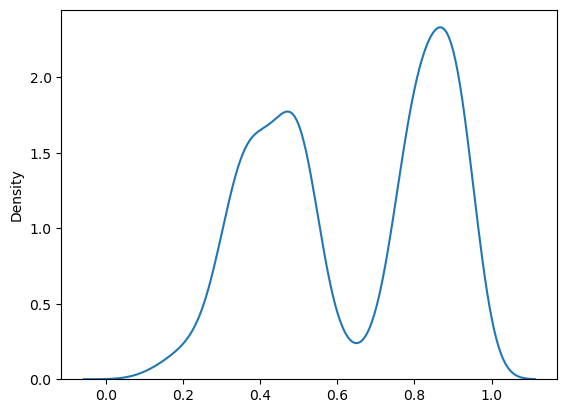

In [16]:
from sklearn.metrics import pairwise_distances
import itertools
for _do_term in adata_train.obs["do_term"].unique():
    adata_term_data = adata_train.obs[adata_train.obs["do_term"]==_do_term]
    k = embeddings_train[adata_train.obs["do_term"]==_do_term]

    _idxs = np.where(adata_train.obs["do_term"]==_do_term)[0]
    k = embeddings_train[_idxs]

    sns.kdeplot((1-pairwise_distances(k, metric="cosine"))[np.triu_indices(k.shape[0], k=1)])
    plt.show()
    break

Same disease, diff dataset:   0%|          | 0/1162 [00:00<?, ?it/s]

Same disease, diff dataset: 100%|██████████| 1162/1162 [00:00<00:00, 5818.02it/s] 


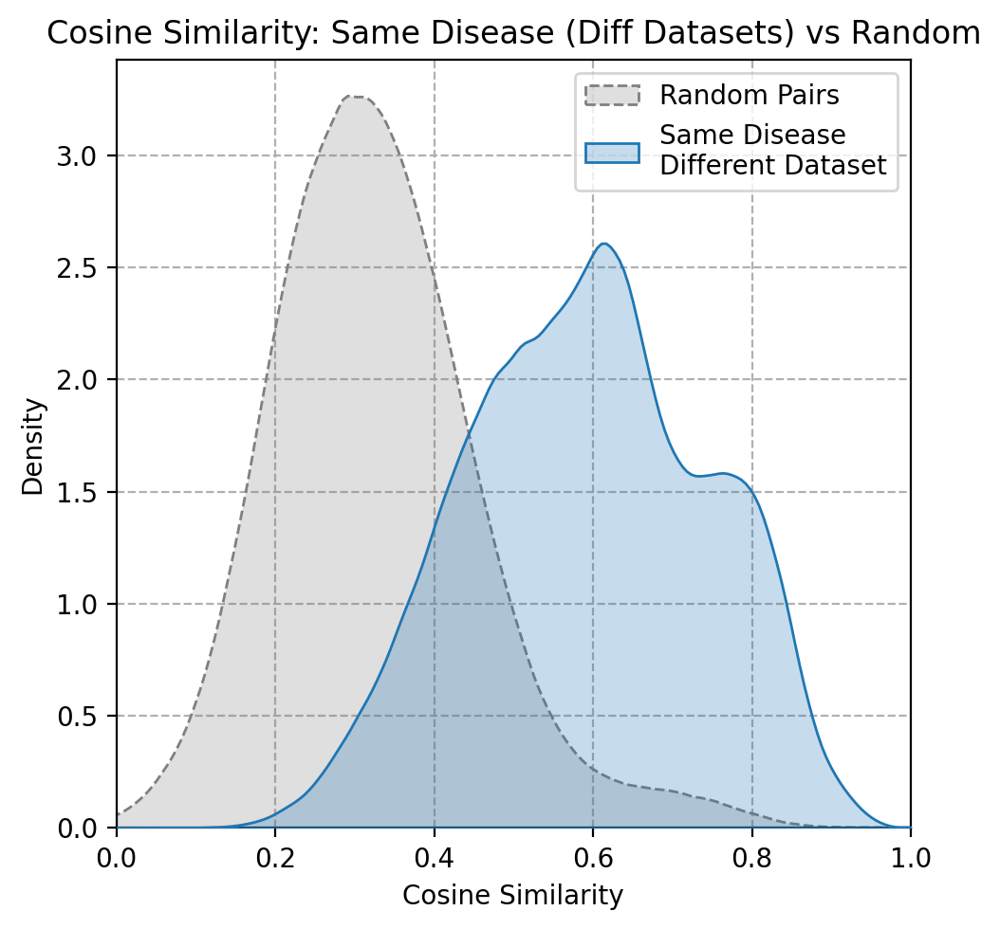

In [25]:
import numpy as np
import pandas as pd
import itertools
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt

# --------- Setup ---------
do_ids = adata_train.obs["do_id"].values
datasets = adata_train.obs["dataset"].values
c_matrix = c_matrix_train  # cosine similarity matrix
unique_do_ids = np.unique(do_ids)
pair_key_set = set(df_query["pair_key_doid"])  # Related disease pairs

# --------- SAME DISEASE (DIFFERENT DATASETS) ---------
_c_same_diff_ds = []
_w_same_diff_ds = []

for doid in tqdm(unique_do_ids, desc="Same disease, diff dataset"):
    if doid.startswith("Control"):
        continue

    idxs = np.where(do_ids == doid)[0]
    if len(idxs) < 2:
        continue

    ds_to_idxs = {}
    for i in idxs:
        ds = datasets[i]
        ds_to_idxs.setdefault(ds, []).append(i)

    ds_keys = list(ds_to_idxs.keys())
    if len(ds_keys) < 2:
        continue

    for ds1, ds2 in itertools.combinations(ds_keys, 2):
        idxs_1 = np.array(ds_to_idxs[ds1])
        idxs_2 = np.array(ds_to_idxs[ds2])

        grid_1, grid_2 = np.meshgrid(idxs_1, idxs_2)
        pair_1 = grid_1.flatten()
        pair_2 = grid_2.flatten()

        sims = c_matrix[pair_1, pair_2]
        _c_same_diff_ds.extend(sims.tolist())
        _w_same_diff_ds.extend([len(sims)] * len(sims))

_c_same_diff_ds = np.array(_c_same_diff_ds)
_w_same_diff_ds = np.array(_w_same_diff_ds) / len(_c_same_diff_ds)

# --------- RANDOM UNRELATED DISEASE PAIRS ---------
n_needed = len(_c_same_diff_ds)
rand_pairs = set()
index_to_doid = do_ids
batch_size = 50000

while len(rand_pairs) < n_needed:
    idx1 = np.random.randint(0, len(do_ids), batch_size)
    idx2 = np.random.randint(0, len(do_ids), batch_size)
    mask = idx1 != idx2
    idx1 = idx1[mask]
    idx2 = idx2[mask]

    doid1 = index_to_doid[idx1]
    doid2 = index_to_doid[idx2]

    is_same = doid1 == doid2
    key_pairs = [tuple(sorted([a, b])) for a, b in zip(doid1, doid2)]
    is_related = np.array([k in pair_key_set for k in key_pairs])
    valid = ~(is_same | is_related)

    valid_idx1 = idx1[valid]
    valid_idx2 = idx2[valid]

    for a, b in zip(valid_idx1, valid_idx2):
        if len(rand_pairs) >= n_needed:
            break
        pair = tuple(sorted([a, b]))
        rand_pairs.add(pair)

rand_pairs = np.array(list(rand_pairs))[:n_needed]
_c_rand = c_matrix[rand_pairs[:, 0], rand_pairs[:, 1]]

# --------- PLOT ---------
plt.figure(figsize=(5, 5), dpi=200)

sns.kdeplot(_c_rand, label="Random Pairs", linestyle="--", fill=True, color="gray", zorder=2)
sns.kdeplot(x=_c_same_diff_ds, weights=_w_same_diff_ds, label="Same Disease\nDifferent Dataset", fill=True, zorder=3)

plt.title("Cosine Similarity: Same Disease (Diff Datasets) vs Random")
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.xlim(0, 1)
plt.grid(zorder=-3, linestyle="--")
plt.show()


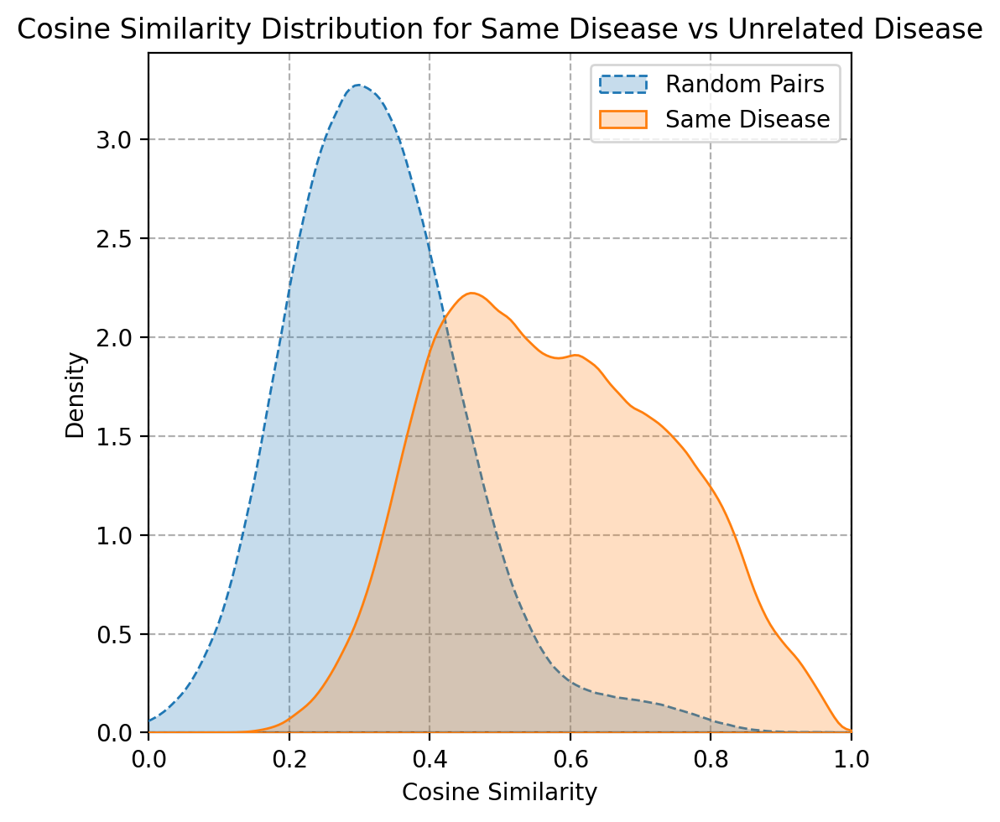

In [17]:
flatten = lambda l: [item for sublist in l for item in sublist]

# 3. Same Disease vs Unrelated Disease
_c_same = list()
_w_same = list()
for do_id in adata_train.obs["do_id"].unique():

    # Exclude controls
    if do_id.startswith("Control"):
        continue

    # get all embeddings for same disease
    _idxs = np.where(adata_train.obs["do_id"]==do_id)[0]

    if len(_idxs) < 2:
        continue

    # get pairs of all embeddings
    _idxs_p = np.array(list(itertools.combinations(_idxs, 2)))
    _w = [len(_idxs_p)]*len(_idxs_p)

    # get cosine similarity
    _c_same.extend(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])
    _w_same.extend(_w)


from tqdm import tqdm
adata_train.obs.reset_index(inplace=True, drop=True)


# normalize weights by total
_w_same = np.array(_w_same) / len(_c_same)

# Get non-related pairs 1:1 ratio!
i = 0
_rand_idxs = list()
while i < len(_c_same):
    
    # get random indexes
    _idx1, _idx2 = np.random.choice(
        np.arange(len(adata_train)), 2, replace=False
    )

    # retrieve do ids
    rand_n1 = adata_train.obs["do_id"].iloc[_idx1]
    rand_n2 = adata_train.obs["do_id"].iloc[_idx2]

    # filter out same disease pairs
    if rand_n1 == rand_n2:
        continue

    # filter out related disease pairs
    if str(tuple(sorted([rand_n1, rand_n2]))) in df_query["pair_key_doid"].to_list():
        continue

    # store indexes
    _rand_idxs.append([_idx1, _idx2])

    i += 1
    print(f"{i}/{len(_c_same)}", end="\r")

_rand_idxs = np.array(_rand_idxs)

_c_rand = c_matrix_train[_rand_idxs[:,0], _rand_idxs[:,1]]


# Plot the distributions
plt.figure(figsize=(5, 5), dpi=200)
sns.kdeplot(_c_rand, label="Random Pairs", linestyle="--", fill=True, zorder=3)
sns.kdeplot(x=_c_same, weights=_w_same, label="Same Disease", fill=True, zorder=3)
plt.title(f"Cosine Similarity Distribution for Same Disease vs Unrelated Disease")
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.xlim(0, 1)
plt.grid(zorder=-3, linestyle="--")
plt.show()


Processing same-disease pairs:   0%|          | 0/1162 [00:00<?, ?it/s]

Processing same-disease pairs: 100%|██████████| 1162/1162 [00:00<00:00, 1623.27it/s]


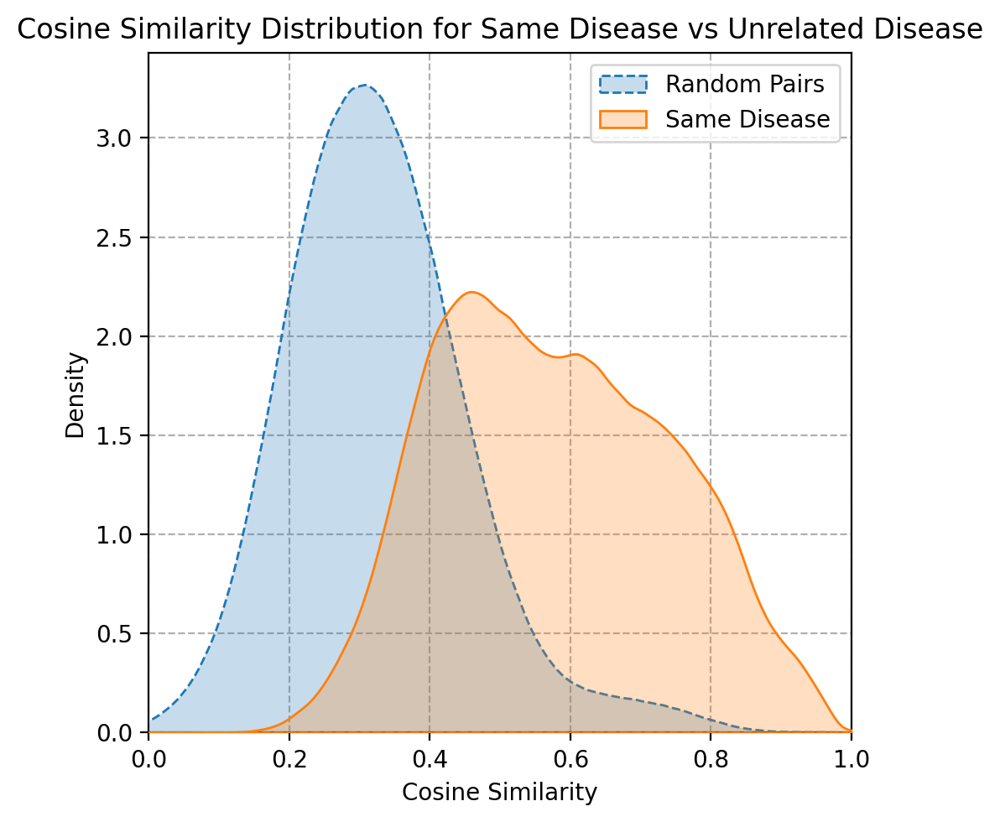

In [20]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from tqdm import tqdm

flatten = lambda l: [item for sublist in l for item in sublist]

do_ids = adata_train.obs["do_id"].values
pair_key_set = set(df_query["pair_key_doid"])
c_matrix = c_matrix_train  # cosine similarity matrix

# ---------- SAME DISEASE ----------
_c_same = []
_w_same = []

for do_id in tqdm(np.unique(do_ids), desc="Processing same-disease pairs"):
    if do_id.startswith("Control"):
        continue
    idxs = np.where(do_ids == do_id)[0]
    if len(idxs) < 2:
        continue
    idx_pairs = np.array(list(itertools.combinations(idxs, 2)))
    _c_same.extend(c_matrix[idx_pairs[:, 0], idx_pairs[:, 1]])
    _w_same.extend([len(idx_pairs)] * len(idx_pairs))

_c_same = np.array(_c_same)
_w_same = np.array(_w_same) / len(_c_same)

# ---------- UNRELATED DISEASE ----------
n_needed = len(_c_same)
rand_pairs = set()
attempts = 0
batch_size = 50000

# Map index to DOID
index_to_doid = do_ids
pair_key_array = np.array(list(pair_key_set))  # for fast lookup (if needed)

while len(rand_pairs) < n_needed:
    idx1 = np.random.randint(0, len(do_ids), batch_size)
    idx2 = np.random.randint(0, len(do_ids), batch_size)
    mask = idx1 != idx2

    idx1 = idx1[mask]
    idx2 = idx2[mask]

    doid1 = index_to_doid[idx1]
    doid2 = index_to_doid[idx2]

    # Mask unrelated pairs: not same, not in related set
    is_same = doid1 == doid2
    key_pairs = [tuple(sorted([a, b])) for a, b in zip(doid1, doid2)]
    is_related = np.array([k in pair_key_set for k in key_pairs])
    valid = ~(is_same | is_related)

    valid_idx1 = idx1[valid]
    valid_idx2 = idx2[valid]

    # Add to set to avoid duplicates
    for a, b in zip(valid_idx1, valid_idx2):
        if len(rand_pairs) >= n_needed:
            break
        pair = tuple(sorted([a, b]))
        rand_pairs.add(pair)

    attempts += 1
    if attempts % 5 == 0:
        print(f"Collected {len(rand_pairs)} / {n_needed} valid unrelated pairs...", end="\r")

# Convert to array and get cosine values
rand_pairs = np.array(list(rand_pairs))[:n_needed]
_c_rand = c_matrix[rand_pairs[:, 0], rand_pairs[:, 1]]

# ---------- PLOT ----------
plt.figure(figsize=(5, 5), dpi=200)
sns.kdeplot(_c_rand, label="Random Pairs", linestyle="--", fill=True, zorder=3)
sns.kdeplot(x=_c_same, weights=_w_same, label="Same Disease", fill=True, zorder=3)
plt.title("Cosine Similarity Distribution for Same Disease vs Unrelated Disease")
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.xlim(0, 1)
plt.grid(zorder=-3, linestyle="--")
plt.show()


In [ ]:
flatten = lambda l: [item for sublist in l for item in sublist]
adata_train.obs.reset_index(inplace=True, drop=True)
adata_train.obs["is_control"] = ["C" if i.startswith("Control") else "D" for i in adata_train.obs["do_id"]]  


100%|██████████| 19/19 [00:01<00:00, 13.11it/s]


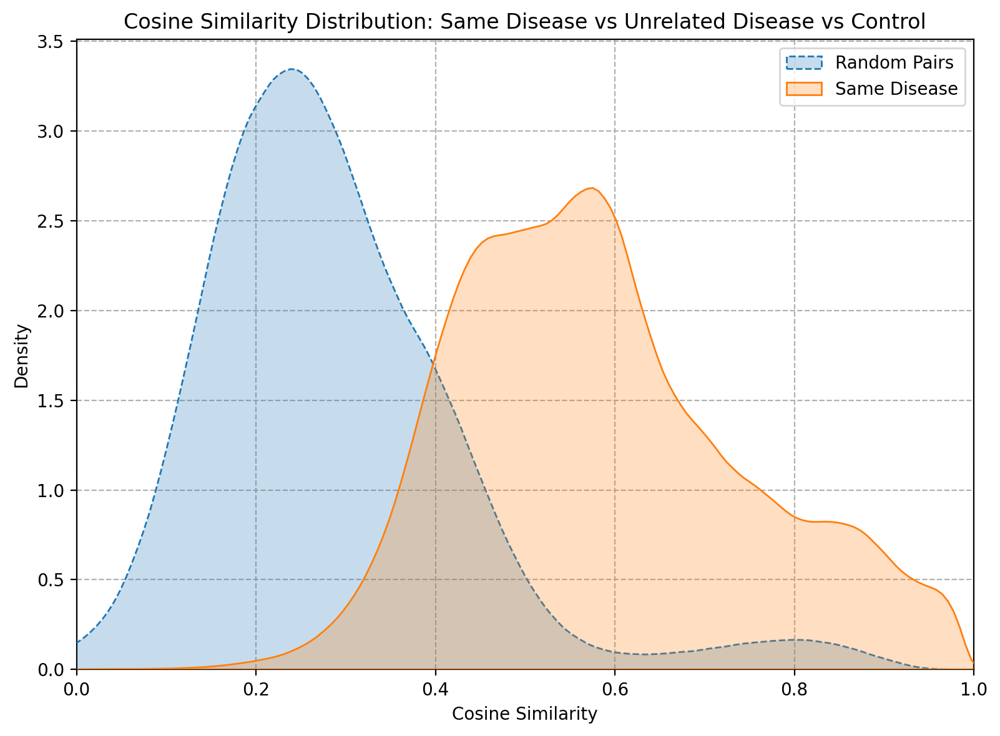

In [44]:
from tqdm import tqdm
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Flattening function for nested lists
flatten = lambda l: [item for sublist in l for item in sublist]
adata_train.obs.reset_index(inplace=True, drop=True)
adata_train.obs["is_control"] = ["C" if i.startswith("Control") else "D" for i in adata_train.obs["do_id"]]  

# Step 1: Same Disease Pairs
_c_same = list()
_w_same = list()

for do_id in adata_train.obs["do_id"].unique():
    # Exclude controls
    if do_id.startswith("Control"):
        continue

    # Get all embeddings for the same disease
    _idxs = np.where(adata_train.obs["do_id"] == do_id)[0]

    # Skip if less than two samples
    if len(_idxs) < 2:
        continue

    # Get pairs of all embeddings (combinations)
    _idxs_p = np.array(list(itertools.combinations(_idxs, 2)))
    _w = [len(_idxs_p)] * len(_idxs_p)

    # Get cosine similarity
    _c_same.extend(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])
    _w_same.extend(_w)

# Step 2: Control vs Disease Pairs
idxs_p_c = list()
_c_control = list()
_w_control = list()

# Retrieve control conditions
for do_id in tqdm(adata_train.obs["do_id"].unique()):
    # Retrieve disease study and accession
    _df_q = adata_train.obs.query("do_id == @do_id")
    for dsaid_i in _df_q["dsaid"].unique():
        
        # Retrieve control and disease indexes
        _c_idx = adata_train.obs.query("dsaid == @dsaid_i and is_control == 'C'").index
        _d_idx = adata_train.obs.query("dsaid == @dsaid_i and is_control == 'D'").index

        # Get combinations of control vs disease indexes
        pairs_c = list(itertools.product(_c_idx, _d_idx))
        idxs_p_c.extend(pairs_c)

        # Calculate cosine similarity for control vs disease
        for pair in pairs_c:
            _c_control.append(c_matrix_train[int(pair[0]), int(pair[1])])
            _w_control.append(1)  # Weight each pair equally

# Normalize weights for same disease
_w_same = np.array(_w_same) / len(_c_same)

# STEP 3
# STEP 3.1: Group sample indices by disease
from collections import defaultdict

doid_to_indices = defaultdict(list)
for idx, doid in adata_train.obs["do_id"].items():
    doid_to_indices[doid].append(idx)

# STEP 3.2: Build all valid unrelated disease pairs (sample-level)
unrelated_pairs = []
pair_key_set = set(df_query["pair_key_doid"].apply(lambda x: tuple(sorted(eval(x)))))

doids = list(doid_to_indices.keys())
n_doids = len(doids)

for i in tqdm(range(n_doids)):
    for j in range(i + 1, n_doids):
        d1, d2 = doids[i], doids[j]
        
        # Skip same or related disease pairs
        if d1 == d2 or tuple(sorted([d1, d2])) in pair_key_set:
            continue

        # Get all combinations of samples between unrelated diseases
        unrelated_pairs.extend(itertools.product(doid_to_indices[d1], doid_to_indices[d2]))

# STEP 3.3: Sample N random unrelated pairs to match same-disease count
np.random.seed(42)  # for reproducibility
selected_idxs = np.random.choice(len(unrelated_pairs), size=len(_c_same), replace=False)
_rand_sample_pairs = [unrelated_pairs[i] for i in selected_idxs]

# STEP 3.4: Compute cosine similarities
_c_rand = [c_matrix_train[int(i), int(j)] for i, j in _rand_sample_pairs]

# Convert to numpy array for efficiency
_rand_idxs = np.array(_rand_idxs)

# Plot the distributions
plt.figure(figsize=(8, 6), dpi=200)

# Plot random pairs distribution
sns.kdeplot(_c_rand, label="Random Pairs", linestyle="--", fill=True, zorder=3)

# Plot same disease pairs distribution
sns.kdeplot(x=_c_same, weights=_w_same, label="Same Disease", fill=True, zorder=3)

# Plot control vs disease distribution
sns.kdeplot(x=_c_control, weights=_w_control, label="Control vs Disease", fill=True, zorder=3)

# Plot aesthetics
plt.title("Cosine Similarity Distribution: Same Disease vs Unrelated Disease vs Control")
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.xlim(0, 1)
plt.grid(zorder=-3, linestyle="--")
plt.show()


In [50]:
adata_train.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3,is_control
0,DSA03006;ERR3607138;Case,E-MTAB-8455,E-MTAB-8455,307,307,DSA03006,Skin,19399,Williams Syndrome,chromosomal disease,Williams Syndrome,RNA-Seq,DOID:1928,DOID:0080014,chromosomal disease,4,0,0,1,D
1,DSA00666;GSM3021882;Case,GSE111085,GSE111085,759,759,DSA00666,nan,19399,Myelodysplastic Syndrome,hematopoietic system disease,Myelodysplastic Syndrome,RNA-Seq,DOID:0050908,DOID:74,hematopoietic system disease,10,0,1,0,D
2,DSA01351;GSM4610643;Case,GSE152287,GSE152287,815,815,DSA01351,nan,17654,Ataxia Telangiectasia,brain disease,Ataxia Telangiectasia,Microarray,DOID:12704,DOID:936,brain disease,1,0,0,1,D
3,DSA06325;GSM1875110;Case,GSE72946,GSE72946,436,436,DSA06325,Whole blood,16825,Leptospirosis,disease by infectious agent,Leptospirosis,Microarray,DOID:2297,DOID:0050117,disease by infectious agent,7,0,0,1,D
4,DSA06325;GSM1875108;Case,GSE72946,GSE72946,436,436,DSA06325,Whole blood,16825,Leptospirosis,disease by infectious agent,Leptospirosis,Microarray,DOID:2297,DOID:0050117,disease by infectious agent,7,0,0,1,D
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11916,DSA08323;GSM5714785;Case,GSE190125,GSE190125,636,636,DSA08323,Whole blood,19399,Down Syndrome,chromosomal disease,Down Syndrome,RNA-Seq,DOID:14250,DOID:0080014,chromosomal disease,4,0,0,1,D
11917,DSA04320;GSM346942;Case,GSE13791,GSE13791,648,648,DSA04320,nan,17043,Chagas Disease,disease by infectious agent,Chagas Disease,Microarray,DOID:12140,DOID:0050117,disease by infectious agent,7,0,1,0,D
11918,DSA05470;GSM6509772;Case,GSE212126,GSE212126,848,848,DSA05470,Skin,19399,Psoriasis,integumentary system disease,Psoriasis,RNA-Seq,DOID:4398,DOID:16,integumentary system disease,12,0,0,1,D
11919,DSA05588;GSM6732736;Case,GSE218012,GSE218012,426,426,DSA05588,Skin,19399,Hypermobile Ehlers-Danlos Syndrome,connective tissue disease,Hypermobile Ehlers-Danlos Syndrome,RNA-Seq,DOID:14757,DOID:65,connective tissue disease,6,0,1,0,D


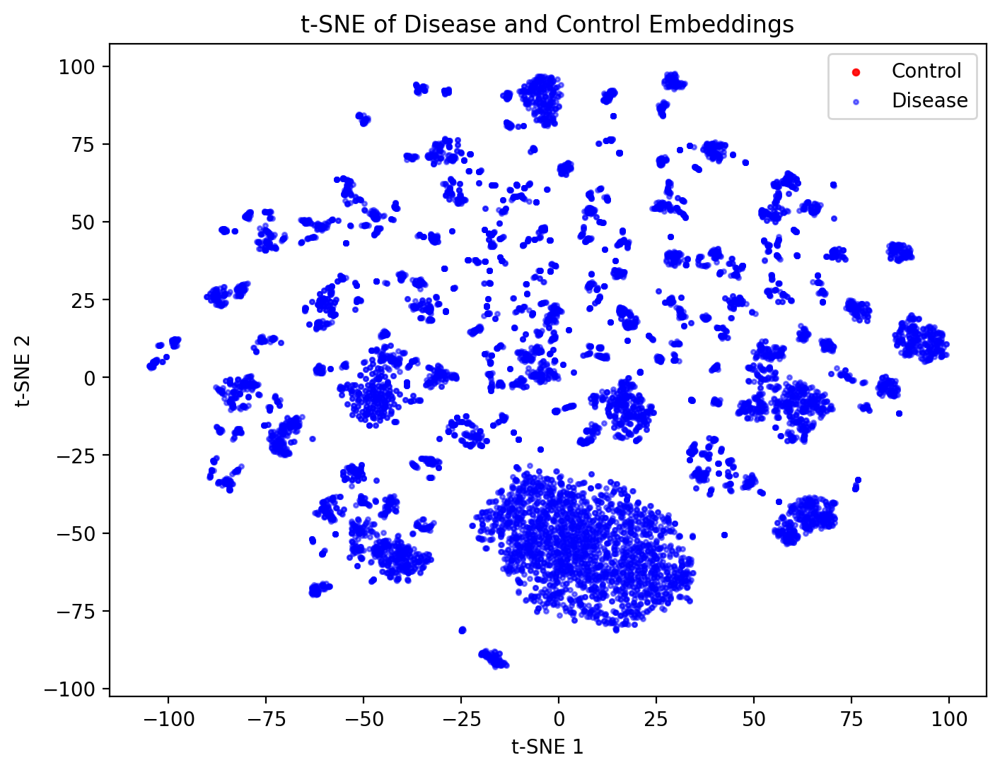

In [45]:
# t-SNE
from sklearn.manifold import TSNE

# first let's determine which are disease or control embeddings
_d_mask = np.array(adata_train.obs["is_control"] == "D")
_c_mask = np.array(adata_train.obs["is_control"] == "C")

# let's run t-SNE
tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
X_embedded = tsne.fit_transform(embeddings_train)

# scatter plot 
plt.figure(figsize=(8, 6), dpi=200)
plt.scatter(
    X_embedded[_c_mask][:, 0], X_embedded[_c_mask][:, 1], c="red", label="Control", alpha=0.9, s=10
)
plt.scatter(
    X_embedded[_d_mask][:, 0], X_embedded[_d_mask][:, 1], c="blue", label="Disease", alpha=0.5, s=5
)
plt.title("t-SNE of Disease and Control Embeddings")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend()

# 4. tSNE Embeddiding plots

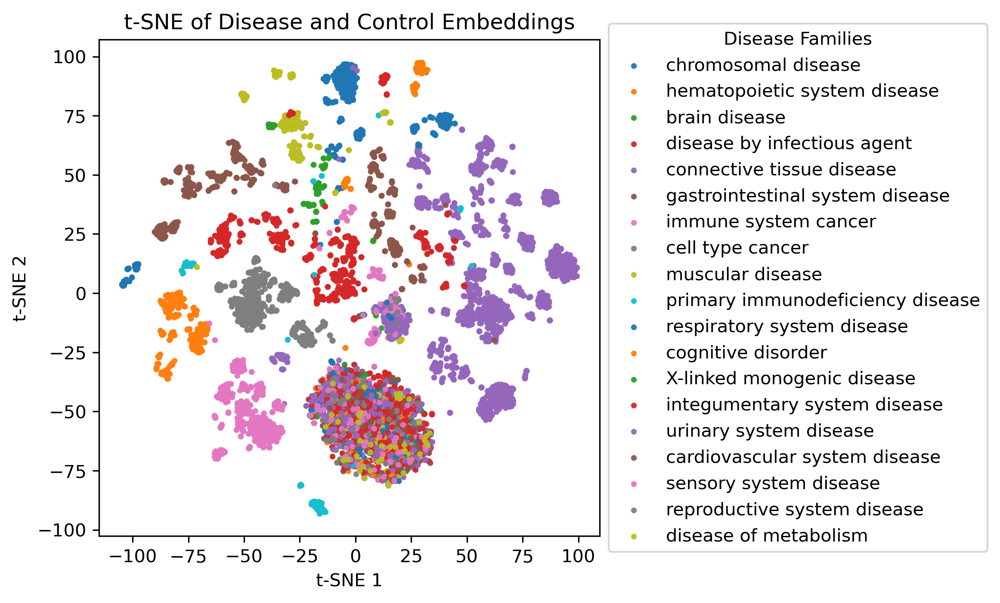

In [22]:
# t-SNE
from sklearn.manifold import TSNE

# Lets color by disease families
_d_masks = list()
for i in adata_train.obs["do_id"].unique():
    _d_masks.append((i, np.array((adata_train.obs["do_id"] == i) & (adata_train.obs["is_control"] == "D"))))

# let's run t-SN
tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
X_embedded = tsne.fit_transform(embeddings_train)

# scatter plot 
plt.figure(figsize=(5, 5), dpi=300)
for i in range(len(_d_masks)):
    _doid, _d_mask = _d_masks[i]
    plt.scatter(
        X_embedded[_d_mask][:, 0], X_embedded[_d_mask][:, 1], label=doid_to_term.get(_doid), alpha=0.9, s=5
    )
plt.title("t-SNE of Disease and Control Embeddings")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Disease Families")

In [ ]:
# t-SNE
from sklearn.manifold import TSNE

# Lets color by disease families
_d_masks = list()
for i in adata_train.obs["do_id"].unique():
    _d_masks.append((i, np.array((adata_train.obs["do_id"] == i) & (adata_train.obs["is_control"] == "D"))))

# let's run t-SN
tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
X_embedded = tsne.fit_transform(adata_train.X)

# scatter plot 
plt.figure(figsize=(8, 6), dpi=200)
for i in range(len(_d_masks)):
    _doid, _d_mask = _d_masks[i]
    plt.scatter(
        X_embedded[_d_mask][:, 0], X_embedded[_d_mask][:, 1], label=doid_to_term.get(_doid), alpha=0.5, s=5
    )
plt.title("t-SNE of Disease and Control Embeddings")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Disease Families")

In [ ]:
# t-SNE
from sklearn.manifold import TSNE

# Lets color by disease families
_d_masks = list()
for i in adata_train.obs["do_id"].unique():
    _d_masks.append((i, np.array((adata_train.obs["do_id"] == i) & (adata_train.obs["is_control"] == "D"))))

# let's run t-SN
tsne = TSNE(n_components=2, random_state=42, n_jobs=-1)
X_embedded = tsne.fit_transform(embeddings_train)

# scatter plot 
plt.figure(figsize=(8, 6), dpi=200)
for i in range(len(_d_masks)):
    _doid, _d_mask = _d_masks[i]
    plt.scatter(
        X_embedded[_d_mask][:, 0], X_embedded[_d_mask][:, 1], label=doid_to_term.get(_doid), alpha=0.5, s=5
    )
plt.title("t-SNE of Disease and Control Embeddings")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), title="Disease Families")

100%|██████████| 1162/1162 [00:51<00:00, 22.49it/s] 


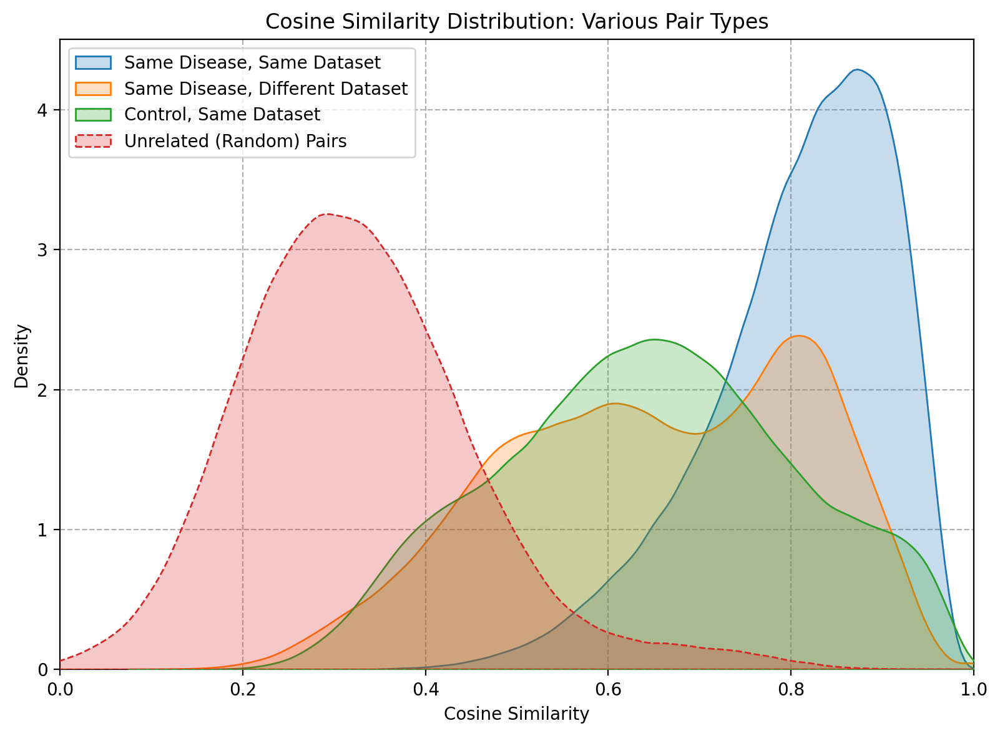

In [ ]:
from tqdm import tqdm
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

# Flattening function for nested lists
flatten = lambda l: [item for sublist in l for item in sublist]

# Resetting index for consistency
adata_train.obs.reset_index(inplace=True, drop=True)
adata_train.obs["is_control"] = ["C" if i.startswith("Control") else "D" for i in adata_train.obs["do_id"]]  

# Step 1: Same Disease, Same Dataset Pairs
_c_same_same = list()
_w_same_same = list()

# Step 2: Same Disease, Different Dataset Pairs
_c_same_diff = list()
_w_same_diff = list()

# Step 3: Control, Same Dataset Pairs
_c_control_same = list()
_w_control_same = list()

# Step 4: Unrelated (Random) Pairs
_c_rand = list()

# Collecting disease and control indexes
doid_to_indices = defaultdict(list)
for idx, doid in adata_train.obs["do_id"].items():
    doid_to_indices[doid].append(idx)

# Building all valid unrelated disease pairs (sample-level)
unrelated_pairs = []
pair_key_set = set(df_query["pair_key_doid"].apply(lambda x: tuple(sorted(eval(x)))))

doids = list(doid_to_indices.keys())
n_doids = len(doids)

for i in tqdm(range(n_doids)):
    for j in range(i + 1, n_doids):
        d1, d2 = doids[i], doids[j]

        # Skip same or related disease pairs
        if d1 == d2 or tuple(sorted([d1, d2])) in pair_key_set:
            continue

        # Get all combinations of samples between unrelated diseases
        unrelated_pairs.extend(itertools.product(doid_to_indices[d1], doid_to_indices[d2]))

# Loop over diseases to calculate pairwise similarities
for do_id in tqdm(adata_train.obs["do_id"].unique()):
    # Exclude unrelated controls
    if do_id.startswith("Control"):
        continue

    # Get samples with the same disease
    _df_q = adata_train.obs.query("do_id == @do_id")

    # Group samples by dataset
    datasets = _df_q["dsaid"].unique()

    for dsaid in datasets:
        # Samples from the same dataset (same disease)
        _idxs_same = _df_q.query("dsaid == @dsaid").index

        if len(_idxs_same) < 2:
            continue

        # Pairs within the same dataset
        _idxs_p_same = np.array(list(itertools.combinations(_idxs_same, 2)))
        _w_same_same.extend([len(_idxs_p_same)] * len(_idxs_p_same))

        # Cosine similarity for same dataset pairs
        _c_same_same.extend(c_matrix_train[_idxs_p_same[:, 0], _idxs_p_same[:, 1]])

    # Different datasets (same disease)
    if len(datasets) > 1:
        for dsaid1, dsaid2 in itertools.combinations(datasets, 2):
            _idxs1 = _df_q.query("dsaid == @dsaid1").index
            _idxs2 = _df_q.query("dsaid == @dsaid2").index

            # Cross-dataset pairs
            _idxs_p_diff = np.array(list(itertools.product(_idxs1, _idxs2)))
            _w_same_diff.extend([len(_idxs_p_diff)] * len(_idxs_p_diff))

            # Cosine similarity for different dataset pairs
            _c_same_diff.extend(c_matrix_train[_idxs_p_diff[:, 0], _idxs_p_diff[:, 1]])

    # Control, Same Dataset Pairs
    for dsaid in datasets:
        _c_idx = adata_train.obs.query(f"dsaid == '{dsaid}' and is_control == 'C'").index
        _d_idx = adata_train.obs.query(f"dsaid == '{dsaid}' and is_control == 'D'").index

        # Get combinations of control vs disease indexes
        pairs_c = list(itertools.product(_c_idx, _d_idx))

        # Cosine similarity for control vs disease in same dataset
        for pair in pairs_c:
            _c_control_same.append(c_matrix_train[int(pair[0]), int(pair[1])])
            _w_control_same.append(1)

# Unrelated (Random) Pairs
np.random.seed(42)
selected_idxs = np.random.choice(len(unrelated_pairs), size=len(_c_same_same), replace=False)
_rand_sample_pairs = [unrelated_pairs[i] for i in selected_idxs]
_c_rand = [c_matrix_train[int(i), int(j)] for i, j in _rand_sample_pairs]

# Normalize weights
_w_same_same = np.array(_w_same_same) / len(_c_same_same)
_w_same_diff = np.array(_w_same_diff) / len(_c_same_diff)
_w_control_same = np.array(_w_control_same) / len(_c_control_same)

# Plot the distributions
plt.figure(figsize=(8, 6), dpi=200)

# Same Disease, Same Dataset
sns.kdeplot(x=_c_same_same, weights=_w_same_same, label="Same Disease, Same Dataset", fill=True, zorder=3)

# Same Disease, Different Dataset
sns.kdeplot(x=_c_same_diff, weights=_w_same_diff, label="Same Disease, Different Dataset", fill=True, zorder=3)

# Control, Same Dataset
sns.kdeplot(x=_c_control_same, weights=_w_control_same, label="Control, Same Dataset", fill=True, zorder=3)

# Unrelated (Random) Pairs
sns.kdeplot(_c_rand, label="Unrelated (Random) Pairs", linestyle="--", fill=True, zorder=3)

# Plot aesthetics
plt.title("Cosine Similarity Distribution: Various Pair Types")
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.xlim(0, 1)
plt.grid(zorder=-3, linestyle="--")
plt.show()


In [ ]:
for do_id in adata_train.obs["do_id_study"].unique():


    # get all embeddings for same disease
    _idxs = np.where(adata_train.obs["do_id_study"]==do_id)[0]

    if len(_idxs) < 1:
        print(do_id, _idxs)
    

In [51]:
# 4. Related Disease vs Unrelated Disease

# get indexes of pairs 
for s_p in [2,3,4,5]:
    # get pairs w/ shortest path
    _df_query = df_query.query(f"shortest_path == {s_p}")

    print(f"Nº of pairs: {len(_df_query)}")

    _c_related = list()
    _w_related = list()

    for _, _row in _df_query.iterrows():

        _n1, _n2 = _row["node_1"], _row["node_2"]

        # get indexes of nodes
        _idx1 = np.where(adata_train.obs["do_id_study"] == _n1)[0]
        _idx2 = np.where(adata_train.obs["do_id_study"] == _n2)[0]

        # get all combinations between indexes
        _idxs_p = np.array(list(itertools.product(_idx1, _idx2)))
        
        if len(_idxs_p) < 1:
            print(_n1, _n2)
            continue
        
        _w = [len(_idxs_p)]*len(_idxs_p)
        
        # get cosine similarity
        _c_related.extend(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])
        _w_related.extend(_w)

    # normalize weights by total
    _w_related = np.array(_w_related) / len(_c_related)

    print(f"Cosine Similarity Values: {len(_c_related)}")
    print(f"Mean Cosine Similarity: {np.mean(_c_related)}")
    print(f"Nº of pairs: {len(_c_related)}")
    # random distribution
    i = 0
    _rand_idxs = list()
    while i < len(_c_related)/10:
        # print("Selecting random pairs...")
        # get random indexes
        _idx1, _idx2 = np.random.choice(
            np.arange(len(adata_train)), 2, replace=False
        )

        # retrieve do ids
        rand_n1 = adata_train.obs["do_id_study"].iloc[_idx1]
        rand_n2 = adata_train.obs["do_id_study"].iloc[_idx2]

        # filter out same disease pairs
        if rand_n1 == rand_n2:
            continue

        # filter out related disease pairs
        if str(tuple(sorted([rand_n1, rand_n2]))) in df_query["pair_key_doid"].to_list():
            continue

        # store indexes
        _rand_idxs.append([_idx1, _idx2])

        i += 1
        print(f"{i}/{len(_c_related)}", end="\r")

    # retrieve embeddings
    _rand_idxs = np.array(_rand_idxs)
    _c_rand = c_matrix_train[_rand_idxs[:,0], _rand_idxs[:,1]]
        
    print(f"Random Cosine Similarity Values: {len(_c_rand)}")

    plt.figure(figsize=(5, 5), dpi=200)
    sns.kdeplot(_c_rand, label="Random Pairs", linestyle="--", fill=True, zorder=3)
    sns.kdeplot(x=_c_related, weights=_w_related, label=f"Shortest Path = {s_p}", fill=True, zorder=3)
    plt.title(f"Cosine Similarity Distribution for DOID Pairs (s_p = {s_p})")
    plt.xlabel("Cosine Similarity")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.xlim(0, 1)
    plt.grid(zorder=-3, linestyle="--")
    plt.show()




Nº of pairs: 0
Cosine Similarity Values: 0
Mean Cosine Similarity: nan
Nº of pairs: 0


/aloy/home/ddalton/miniconda3/envs/generic/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/aloy/home/ddalton/miniconda3/envs/generic/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


IndexError: too many indices for array: array is 1-dimensional, but 2 were indexed

100%|██████████| 1162/1162 [00:37<00:00, 30.75it/s]


<Axes: ylabel='Density'>

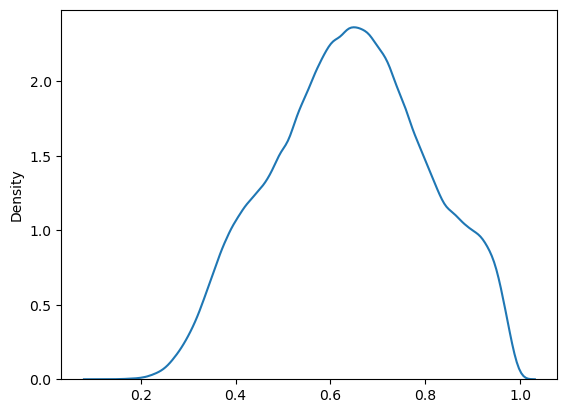

In [ ]:
idxs_p_c = np.array(idxs_p_c)

# get cosine similarity
sns.kdeplot(c_matrix_train[idxs_p_c[:, 0], idxs_p_c[:, 1]])

In [ ]:
np.array(idxs_p_c)

array([[ 7188,     0],
       [ 7188,   441],
       [ 7188,   617],
       ...,
       [36646, 32848],
       [36646, 35559],
       [36646, 37103]])

In [ ]:
adata_train.obs.query("dsaid == @dsaid_i and is_control == 'C'").index

Index(['24548', '24534', '24541', '24549', '24540', '24537', '24538', '24544',
       '24535', '24545', '24536', '24529', '24531', '24533', '24542', '24547',
       '24543', '24546', '24532'],
      dtype='object')

,index,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,...,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3,is_control
0,24576,DSA04505;GSM137193;Case,GSE5900,GSE5900,298,298,DSA04505,Bone marrow,17043,Monoclonal Gammopathy of Undetermined Signific...,...,Monoclonal Gammopathy of Undetermined Signific...,Microarray,DOID:7442,DOID:7442,monoclonal gammopathy of uncertain significance,1077,0,0,1,D
1,48050,DSA09687;GSM410669;Control,GSE16354,GSE16354,47,47,DSA09687,nan,17043,Control,...,Kaposi Sarcoma,Microarray,DOID:8632,Control-GSE16354,Control-GSE16354,126,0,0,0,C
2,11446,DSA02269;GSM337317;Control,GSE13355,GSE13355,674,674,DSA02269,Skin,17043,Control,...,Psoriasis,Microarray,DOID:4398,Control-GSE13355,Control-GSE13355,106,0,0,0,C
3,24226,DSA04493;GSM377459;Case,GSE15090,GSE15090,633,633,DSA04493,Biceps,17043,Facioscapulohumeral Muscular Dystrophy,...,Facioscapulohumeral Muscular Dystrophy,Microarray,DOID:0111192,DOID:0111192,facioscapulohumeral muscular dystrophy 1,1019,0,1,0,D
4,26822,DSA04800;GSM2466209;Control,GSE93987,GSE93987,368,368,DSA04800,Dorsolateral prefrontal cortex,15388,Control,...,Schizoaffective Disorder,Microarray,DOID:5418,Control-GSE93987,Control-GSE93987,531,0,0,0,C
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37116,39691,DSA07283;GSM5528737;Case,GSE182410,GSE182410,391,391,DSA07283,Skin,19399,Ataxia-Telangiectasia,...,Ataxia-Telangiectasia,RNA-Seq,DOID:12704,DOID:12704,ataxia telangiectasia,970,0,0,1,D
37117,48604,DSA09804;GSM1386819;Case,GSE57691,GSE57691,501,501,DSA09804,Aortic wall,17855,Abdominal Aortic Aneurysm,...,Abdominal Aortic Aneurysm,Microarray,DOID:7693,DOID:7693,abdominal aortic aneurysm,942,0,0,0,D
37118,18337,DSA03539;GSM899116;Case,GSE36701,GSE36701,896,896,DSA03539,Rectal colon,17042,Irritable Bowel Syndrome,...,Irritable Bowel Syndrome,Microarray,DOID:9778,DOID:9778,irritable bowel syndrome,1057,0,1,0,D
37119,8011,DSA01796;GSM3584760;Control,GSE123972,GSE123972,982,982,DSA01796,Plasma,19399,Control,...,Hepatitis B,RNA-Seq,DOID:2043,Control-GSE123972,Control-GSE123972,620,0,0,0,C


In [ ]:
flatten = lambda l: [item for sublist in l for item in sublist]

# 3. Same Disease vs Unrelated Disease
_c_same = list()
_w_same = list()
for do_id in adata_train.obs["do_id"].unique():

    # Exclude controls
    if do_id.startswith("Control"):
        continue

    # get all embeddings for same disease
    _idxs = np.where(adata_train.obs["do_id"]==do_id)[0]

    if len(_idxs) < 2:
        continue

    # get pairs of all embeddings
    _idxs_p = np.array(list(itertools.combinations(_idxs, 2)))
    _w = [len(_idxs_p)]*len(_idxs_p)

    # get cosine similarity
    _c_same.extend(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])
    _w_same.extend(_w)

# normalize weights by total
_w_same = np.array(_w_same) / len(_c_same)

# Get non-related pairs 1:1 ratio!
i = 0
_rand_idxs = list()
while i < len(_c_same):
    
    # get random indexes
    _idx1, _idx2 = np.random.choice(
        np.arange(len(adata_train)), 2, replace=False
    )

    # retrieve do ids
    rand_n1 = adata_train.obs["do_id"].iloc[_idx1]
    rand_n2 = adata_train.obs["do_id"].iloc[_idx2]

    # filter out same disease pairs
    if rand_n1 == rand_n2:
        continue

    # filter out related disease pairs
    if str(tuple(sorted([rand_n1, rand_n2]))) in df_query["pair_key_doid"].to_list():
        continue

    # store indexes
    _rand_idxs.append([_idx1, _idx2])

    i += 1
    print(f"{i}/{len(_c_same)}", end="\r")

_rand_idxs = np.array(_rand_idxs)

_c_rand = c_matrix_train[_rand_idxs[:,0], _rand_idxs[:,1]]


# Plot the distributions
plt.figure(figsize=(5, 5), dpi=200)
sns.kdeplot(_c_rand, label="Random Pairs", linestyle="--", fill=True, zorder=3)
sns.kdeplot(x=_c_same, weights=_w_same, label="Same Disease", fill=True, zorder=3)
plt.title(f"Cosine Similarity Distribution for Same Disease vs Unrelated Disease")
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.xlim(0, 1)
plt.grid(zorder=-3, linestyle="--")
plt.show()


In [ ]:
_idx1

array([], dtype=int64)

Nº of pairs: 152
bacterial sepsis vs rheumatic fever


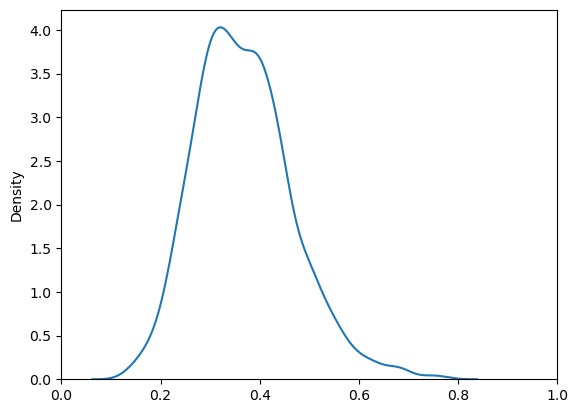

In [ ]:
s_p = 2

# get pairs w/ shortest path
_df_query = df_query.query(f"shortest_path == {s_p}")

print(f"Nº of pairs: {len(_df_query)}")

_c_related = list()
_w_related = list()

i = 0
for _, _row in _df_query.iterrows():

    _n1, _n2 = _row["node_1"], _row["node_2"]

    # get indexes of nodes
    _idx1 = np.where(adata_train.obs["do_id"] == _n1)[0]
    _idx2 = np.where(adata_train.obs["do_id"] == _n2)[0]

    # get all combinations between indexes
    _idxs_p = np.array(list(itertools.product(_idx1, _idx2)))
    _w = [len(_idxs_p)]*len(_idxs_p)
    
    # get cosine similarity
    _c_related.extend(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])
    _w_related.extend(_w)

    print(_row["term_1"], "vs", _row["term_2"])

    sns.kdeplot(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])
    plt.xlim(0, 1)
    plt.show()
    i+=1
    if i == 1:
        break


# # normalize weights by total
# _w_related = np.array(_w_related) / len(_c_related)



In [ ]:
_all_idxs

[(94, 29),
 (94, 898),
 (94, 1584),
 (94, 2653),
 (94, 2899),
 (94, 2921),
 (94, 7260),
 (94, 8124),
 (94, 10070),
 (94, 10323),
 (138, 29),
 (138, 898),
 (138, 1584),
 (138, 2653),
 (138, 2899),
 (138, 2921),
 (138, 7260),
 (138, 8124),
 (138, 10070),
 (138, 10323),
 (213, 29),
 (213, 898),
 (213, 1584),
 (213, 2653),
 (213, 2899),
 (213, 2921),
 (213, 7260),
 (213, 8124),
 (213, 10070),
 (213, 10323),
 (675, 29),
 (675, 898),
 (675, 1584),
 (675, 2653),
 (675, 2899),
 (675, 2921),
 (675, 7260),
 (675, 8124),
 (675, 10070),
 (675, 10323),
 (950, 29),
 (950, 898),
 (950, 1584),
 (950, 2653),
 (950, 2899),
 (950, 2921),
 (950, 7260),
 (950, 8124),
 (950, 10070),
 (950, 10323),
 (1051, 29),
 (1051, 898),
 (1051, 1584),
 (1051, 2653),
 (1051, 2899),
 (1051, 2921),
 (1051, 7260),
 (1051, 8124),
 (1051, 10070),
 (1051, 10323),
 (1121, 29),
 (1121, 898),
 (1121, 1584),
 (1121, 2653),
 (1121, 2899),
 (1121, 2921),
 (1121, 7260),
 (1121, 8124),
 (1121, 10070),
 (1121, 10323),
 (1298, 29),
 (12

In [ ]:
c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]]

array([0.9671012])

<Axes: ylabel='Density'>

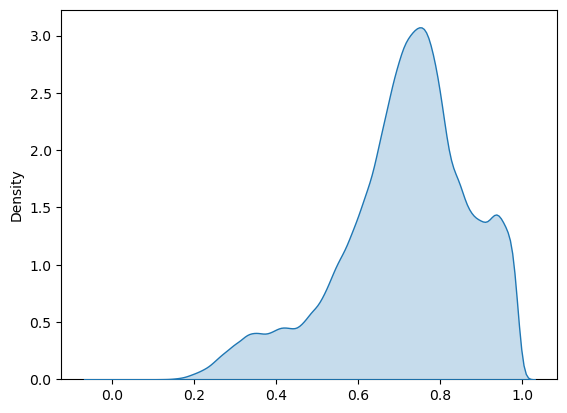

In [ ]:
sns.kdeplot(x=_c_same, weights=_w_same, label="Same Disease", fill=True, zorder=3)


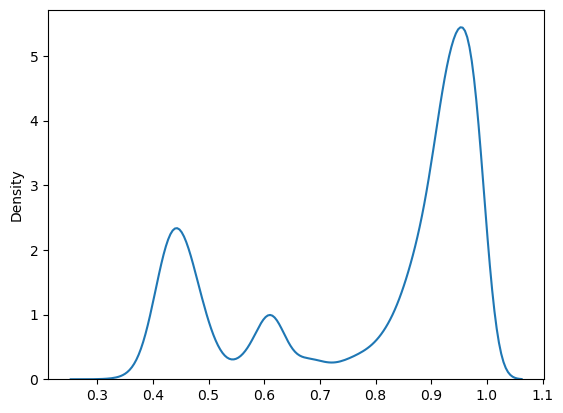

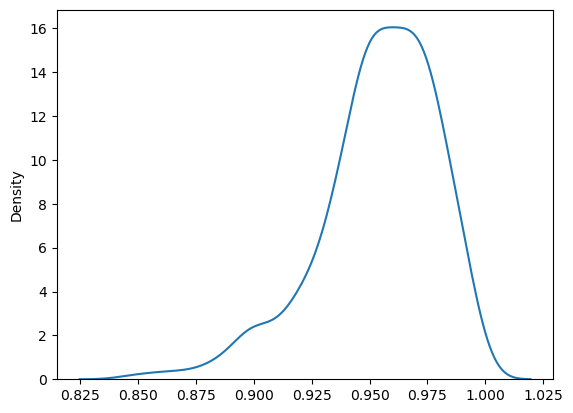

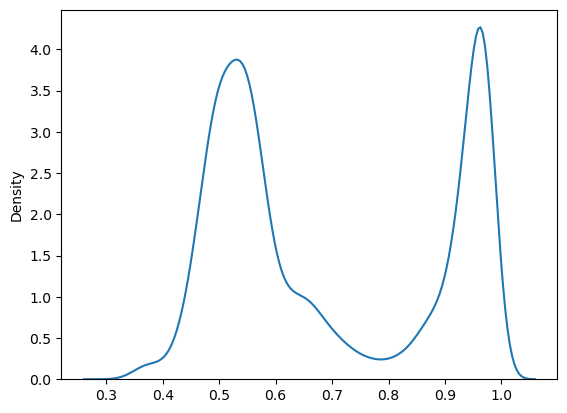

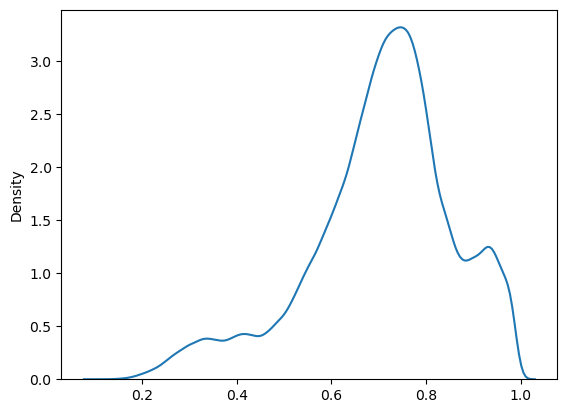

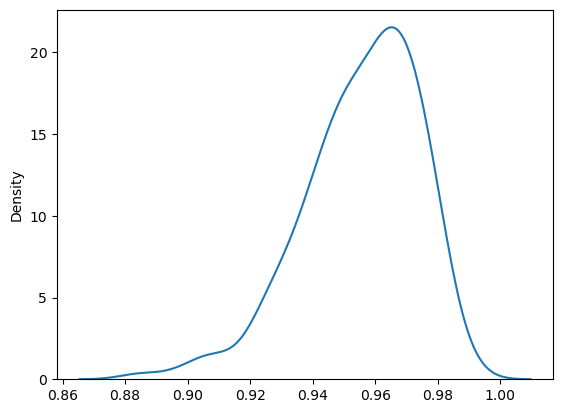

...

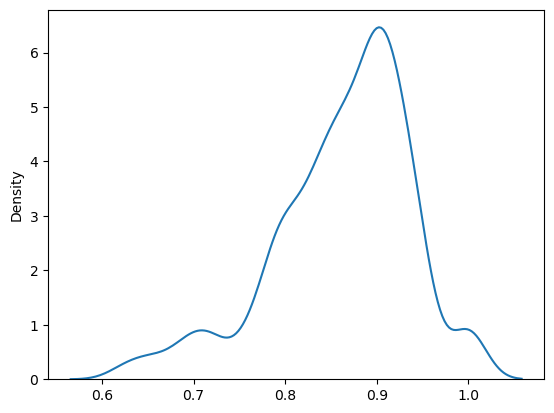

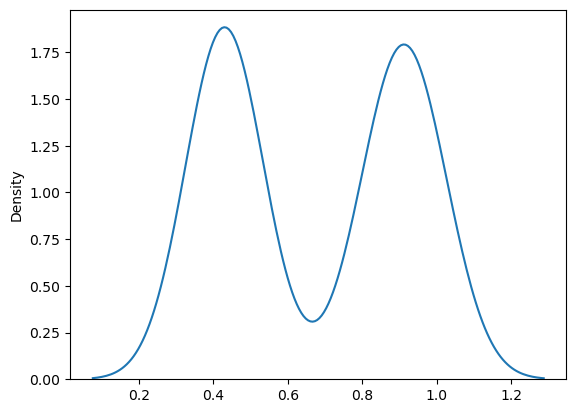

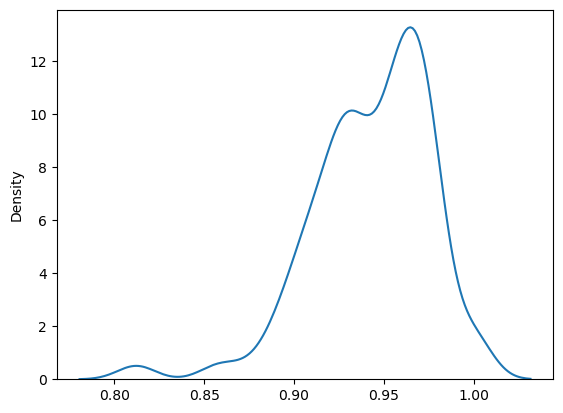

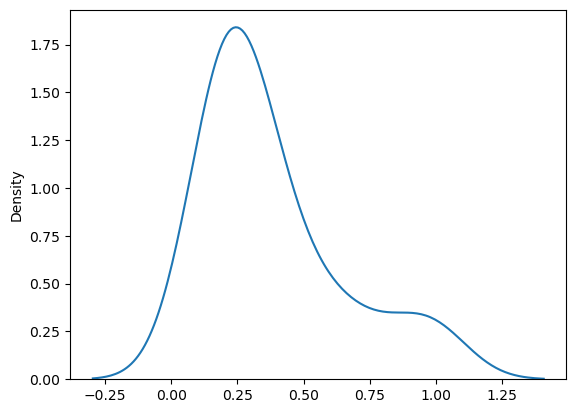

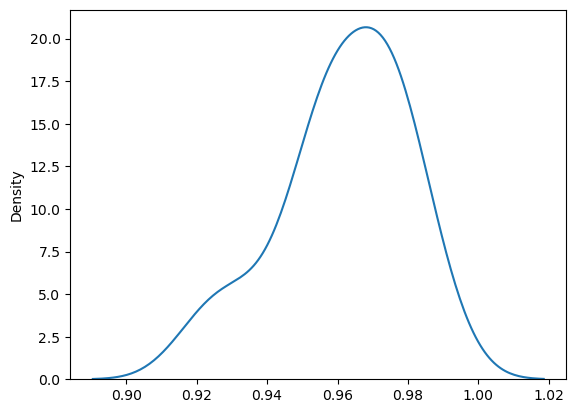

/tmp/ipykernel_6503/3732996860.py:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])


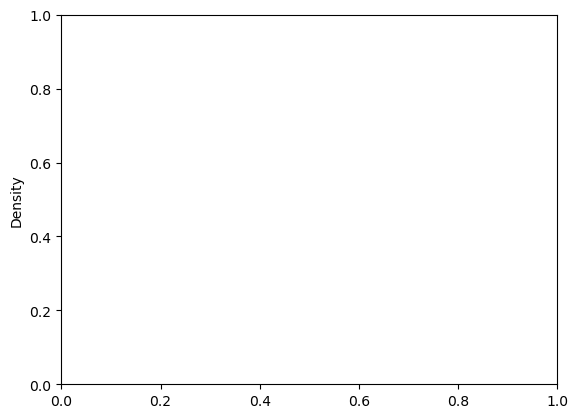

In [ ]:
from sklearn.metrics import pairwise_distances
import itertools
for _do_term in adata_train.obs["do_term"].unique():
    adata_term_data = adata_train.obs[adata_train.obs["do_term"]==_do_term]
    k = embeddings_train[adata_train.obs["do_term"]==_do_term]

    _idxs = np.where(adata_train.obs["do_term"]==_do_term)[0]
    k = embeddings_train[_idxs]

    _idxs_p = np.array(list(itertools.combinations(_idxs, 2)))

    # sns.kdeplot((1-pairwise_distances(k, metric="cosine"))[np.triu_indices(k.shape[0], k=1)])
    sns.kdeplot(c_matrix_train[_idxs_p[:, 0], _idxs_p[:, 1]])
    plt.show()

ValueError: XB must be a 2-dimensional array.

<Axes: ylabel='Density'>

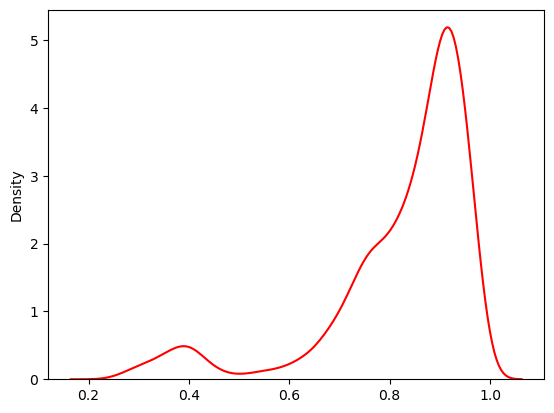

In [ ]:
import itertools

_combined_idxs = np.array(list(itertools.combinations(_idxs, 2)))

sns.kdeplot(c_matrix_train[_combined_idxs[:,0], _combined_idxs[:,1]], label="Kawasaki disease", color="red")

In [ ]:
split_idx = 0


# Recreate full AnnData (backed mode to full memory)
adata_orig_full = adata_orig.to_memory()

# Extract correct subsets using saved indices
adata_train = adata_orig_full[train_indices[split_idx], :].copy()
adata_valid = adata_orig_full[valid_indices[split_idx], :].copy()
adata_test = adata_orig_full[adata_orig_full.obs[f"test_split_{split_idx+1}"] == 1, :].copy()
print(f"Nº of cells Test: {adata_test.shape[0]}")
print(f"Nº of cells Train: {adata_train.shape[0]}")


Nº of cells Test: 3921
Nº of cells Train: 11002


NameError: name 'merge_embeddings' is not defined

In [ ]:
adata_train_1 = ad.read_h5ad("/aloy/home/ddalton/projects/scGPT_playground/outputs/run-25-04-30-02/adata_train_1.h5ad")
adata_test_1 = ad.read_h5ad("/aloy/home/ddalton/projects/scGPT_playground/outputs/run-25-04-30-02/adata_test_1.h5ad")


In [ ]:
adata_test_1.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3
111,DSA00093;GSM4057387;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
112,DSA00093;GSM4057391;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
113,DSA00093;GSM4057394;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
114,DSA00093;GSM4057396;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
115,DSA00093;GSM4057400;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30670,DSA10004;GSM4962541;Case,GSE162828,GSE162828,395,395,DSA10004,Peripheral blood,19399,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,RNA-Seq,DOID:9074,DOID:9074,systemic lupus erythematosus,114,1,0,0
30850,DSA10131;GSM5005391;Case,GSE164264,GSE164264,454,454,DSA10131,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0
30851,DSA10131;GSM5005392;Case,GSE164264,GSE164264,454,454,DSA10131,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0
30853,DSA10132;GSM5005393;Case,GSE164264,GSE164264,454,454,DSA10132,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0


In [ ]:
adata_test.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3
111,DSA00093;GSM4057387;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
112,DSA00093;GSM4057391;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
113,DSA00093;GSM4057394;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
114,DSA00093;GSM4057396;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
115,DSA00093;GSM4057400;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30670,DSA10004;GSM4962541;Case,GSE162828,GSE162828,395,395,DSA10004,Peripheral blood,19399,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,RNA-Seq,DOID:9074,DOID:9074,systemic lupus erythematosus,114,1,0,0
30850,DSA10131;GSM5005391;Case,GSE164264,GSE164264,454,454,DSA10131,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0
30851,DSA10131;GSM5005392;Case,GSE164264,GSE164264,454,454,DSA10131,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0
30853,DSA10132;GSM5005393;Case,GSE164264,GSE164264,454,454,DSA10132,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0


In [ ]:
adata_train_1.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3
29291,DSA09473;GSM787138;Case,GSE31048,GSE31048,678,678,DSA09473,nan,17043,Chronic Lymphocytic Leukemia,Richter's syndrome,Chronic Lymphocytic Leukemia,Microarray,DOID:1703,DOID:1703,Richter's syndrome,16,0,0,1
9430,DSA03036;GSM5641877;Case,GSE175898,GSE175898,213,213,DSA03036,Cortical spheroid,19269,Timothy Syndrome,Timothy syndrome,Timothy Syndrome,RNA-Seq,DOID:0060173,DOID:0060173,Timothy syndrome,20,0,0,0
29027,DSA09407;GSM373884;Case,GSE10667,GSE10667,651,651,DSA09407,Lung,17464,Idiopathic Pulmonary Fibrosis,idiopathic pulmonary fibrosis,Idiopathic Pulmonary Fibrosis,Microarray,DOID:0050156,DOID:0050156,idiopathic pulmonary fibrosis,71,0,1,0
20232,DSA06291;GSM1860140;Case,GSE72326,GSE72326,3,3,DSA06291,Whole Blood,18278,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,Microarray,DOID:9074,DOID:9074,systemic lupus erythematosus,114,0,1,0
16029,DSA04905;PP3;Case,E-MTAB-11415,E-MTAB-11415,666,666,DSA04905,Peripheral blood,17301,Primary Progressive Multiple Sclerosis,primary progressive multiple sclerosis,Primary Progressive Multiple Sclerosis,Microarray,DOID:0050784,DOID:0050784,primary progressive multiple sclerosis,101,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12690,DSA03959;GSM4756909;Case,GSE157159,GSE157159,353,353,DSA03959,Salivary gland,19399,Sjogren's Syndrome,Sjogren's syndrome,Sjogren's Syndrome,RNA-Seq,DOID:12894,DOID:12894,Sjogren's syndrome,18,0,1,0
362,DSA00195;GSM3676264;Case,GSE128470,GSE128470,408,408,DSA00195,Muscle,12002,Inclusion Body Myositis,inclusion body myositis,Inclusion Body Myositis,Microarray,DOID:3429,DOID:3429,inclusion body myositis,72,0,0,1
27085,DSA08927;GSM289563;Case,GSE11501,GSE11501,182,182,DSA08927,Peripheral blood,15428,Coeliac Disease,celiac disease,Coeliac Disease,Microarray,DOID:10608,DOID:10608,celiac disease,42,0,1,0
21145,DSA06561;GSM1977037;Case,GSE76220,GSE76220,631,631,DSA06561,nan,19399,Sporadic Amyotrophic Lateral Sclerosis,amyotrophic lateral sclerosis type 1,Sporadic Amyotrophic Lateral Sclerosis,RNA-Seq,DOID:0060193,DOID:0060193,amyotrophic lateral sclerosis type 1,31,0,0,0


In [ ]:
adata_train.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3
22342,DSA06906;GSM103007;Case,GSE4607,GSE4607,153,153,DSA06906,Blood,17043,Septic Shock,toxic shock syndrome,Septic Shock,Microarray,DOID:14115,DOID:14115,toxic shock syndrome,118,1,0,0
6981,DSA02194;GSM1650348;Case,GSE67596,GSE67596,133,133,DSA02194,nan,17043,Juvenile Idiopathic Arthritis,juvenile rheumatoid arthritis,Juvenile Idiopathic Arthritis,Microarray,DOID:676,DOID:676,juvenile rheumatoid arthritis,75,0,1,0
22181,DSA06862;GSM1101116;Case,GSE45291,GSE45291,619,619,DSA06862,Blood,15388,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,Microarray,DOID:9074,DOID:9074,systemic lupus erythematosus,114,0,1,0
16337,DSA05054;GSM5795816;Case,GSE193351,GSE193351,370,370,DSA05054,Skin,19399,Lichen Planus,lichen planus,Lichen Planus,RNA-Seq,DOID:9201,DOID:9201,lichen planus,78,0,0,0
11676,DSA03666;GSM952787;Case,GSE38958,GSE38958,403,403,DSA03666,nan,16337,Idiopathic Pulmonary Fibrosis,idiopathic pulmonary fibrosis,Idiopathic Pulmonary Fibrosis,Microarray,DOID:0050156,DOID:0050156,idiopathic pulmonary fibrosis,71,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9757,DSA03245;GSM728451;Case,GSE29429,GSE29429,183,183,DSA03245,Blood,17865,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,Microarray,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,0,0,1
182,DSA00094;GSM4057447;Case,GSE136757,GSE136757,293,293,DSA00094,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
20397,DSA06304;GSM1863683;Case,GSE72509,GSE72509,767,767,DSA06304,Whole blood,19399,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,RNA-Seq,DOID:9074,DOID:9074,systemic lupus erythematosus,114,0,0,1
17292,DSA05533;GSM2672810;Case,GSE100163,GSE100163,328,328,DSA05533,Whole blood,17786,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,Microarray,DOID:9074,DOID:9074,systemic lupus erythematosus,114,1,0,0


In [ ]:

# load scGPT embeddings
scgpt_emb_test = merge_embeddings(all_outputs_test[split_idx])
scgpt_emb_valid = merge_embeddings(all_outputs_valid[split_idx])
scgpt_emb_train = merge_embeddings(all_outputs_train[split_idx])



In [ ]:
from typing import *




for i in range(0, len(all_outputs_test)):
    print(f"Fold {i}")
    scgpt_emb_test = merge_embeddings(all_outputs_test[i])
    logging.info(f"SCGPT Embeddings Test Shape: {scgpt_emb_test.shape}")

    scgpt_emb_train = merge_embeddings(all_outputs_train[i])
    logging.info(f"SCGPT Embeddings Train Shape: {scgpt_emb_train.shape}")
    break

INFO:root:SCGPT Embeddings Test Shape: (3921, 512)


Fold 0


INFO:root:SCGPT Embeddings Train Shape: (11002, 512)


In [ ]:
len(all_outputs_train[0])

688

In [ ]:
from tqdm import tqdm

data_type = "test"

d_data = dict()
d_data["n_diseases"] = dict()
d_data["n_controls"] = dict()
d_data["n_datasets"] = dict()
d_data["n_genes"] = dict()
d_data["n_de_signatures"] = dict()

# get diseases which are present in all test splits
diseases_of_interest_set = set()
for disease in tqdm(adata_orig.obs["disease"].unique()):
    disease_count = 0
    for i in range(0, 3):
        df_test = adata_orig.obs[adata_orig.obs[f"test_split_{i+1}"] == 1]
        QUERY = f'disease == "{disease}"'
        df_query = df_test.query(QUERY)
        if len(df_query) > 0:
            disease_count += 1
    # if present in every test split
    if disease_count == 3:
        diseases_of_interest_set.add(disease)

print(
    f"Nº of Diseases of Interest present in every Test Split: {len(diseases_of_interest_set)}"
)


for disease in diseases_of_interest_set:
    if data_type == "test":
        adata_test = adata_orig.obs[adata_orig.obs[f"test_split_{i+1}"] == 1]
        predictions = predictions_test[i]
        celltypes = adata_test["celltype"].values
        labels = labels_test

    elif data_type == "train":
        adata_train = adata_orig[adata_orig.obs[f"test_split_{i+1}"] == 0]
        predictions = predictions_train[i]
        celltypes = adata_train.obs["celltype"].values
        labels = labels_train

    # Nº Disease Samples
    states = adata_test.query(f'disease_study == "{disease}"')["celltype"].to_list()
    n_diseases = len(states) - states.count("Control")
    logging.info(f"{disease} Nº of Diseases: {n_diseases}")

    # Nº of Control Samples
    n_controls = states.count("Control")
    logging.info(f"{disease} Nº Controls: {n_controls}")

    # Nº of Datasets
    datasets = adata_test.query(f'disease_study == "{disease}"')["dataset"].to_list()
    n_datasets = len(set(datasets))
    logging.info(f"{disease} Nº of Datasets: {len(datasets)}")

    # Nº of Genes
    n_genes = adata_test.query(f'disease_study == "{disease}"')["n_genes"].to_list()
    logging.info(
        f"{disease} Nº of Genes: {np.mean(n_genes):.0f} ± {np.std(n_genes):.0f}"
    )

    # Nº of DE signatures
    all_ids = adata_test.query(f'disease_study == "{disease}"')["ids"].to_list()

    de_signatures = list(set([id.split(";")[0] for id in all_ids]))
    n_de_signatures = len(de_signatures)
    logging.info(f"{disease} Nº of DE Signatures: {n_de_signatures}")

    # append to dictionary
    d_data["n_diseases"][disease] = n_diseases
    d_data["n_controls"][disease] = n_controls
    d_data["n_datasets"][disease] = len(datasets)
    d_data["n_genes"][disease] = n_genes
    d_data["n_de_signatures"][disease] = n_de_signatures

100%|██████████| 158/158 [00:00<00:00, 166.18it/s]

Nº of Diseases of Interest present in every Test Split: 37


IndexError: list index out of range

In [ ]:
import seaborn as sns
from matplotlib import pyplot as plt

irb_colors = [
    "#ffd81cff",
    "#f6972dff",
    "#f2612dff",
    "#574270ff",
    "#00589bff",
    "#002f58ff",
]

labels = list(d_data["n_diseases"].keys())
n_controls = [d_data["n_controls"][x] for x in labels]
n_diseases = [d_data["n_diseases"][x] for x in labels]

df_plot = pd.DataFrame(
    {
        "Disease": labels,
        "Nº of Diseases": n_diseases,
        "Nº of Controls": n_controls,
    }
)

# Transform the DataFrame to long format
df_long = df_plot.melt(id_vars="Disease", var_name="Category", value_name="Count")

# Plotting with seaborn
plt.figure(figsize=(5, 4))
sns.barplot(
    data=df_long,
    x="Disease",
    y="Count",
    hue="Category",
    palette=[irb_colors[2], irb_colors[0]],
)

# Adding labels and title
plt.xlabel("", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.title("Number of GEx Samples by Disease", fontsize=14)
plt.xticks([], rotation=90)

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "n_samples.png"), dpi=300, bbox_inches="tight")

NameError: name 'd_data' is not defined

In [ ]:
len(scgpt_emb_train)

57407

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming d_data is defined and contains the necessary data
# labels = list(d_data["n_diseases"].keys())
# n_genes = [d_data["n_genes"][x] for x in labels]

labels = adata_train.obs["disease_study"].to_list()
n_genes = (~np.isnan(adata_train.X)).sum(axis=1)

flat_genes = []
flat_labels = []
# for label, genes_list in zip(labels, n_genes):
#     flat_genes.extend(genes_list)
#     flat_labels.extend([label] * len(genes_list))

plt.figure(figsize=(5, 3))

# Violin plot
sns.violinplot(
    x=labels, y=n_genes, palette=[irb_colors[2], irb_colors[4], irb_colors[0]]
)

# Adding titles and labels
plt.xlabel("Number of Genes")
plt.ylabel("")
plt.xticks(rotation=90)
plt.title("Nº of Genes across Diseases")
plt.savefig(os.path.join(output_dir, "n_genes.png"), dpi=300, bbox_inches="tight")

KeyboardInterrupt: 

## Explore Embeddings

In [ ]:
"""Explore Embeddings

Structure:
    1. Imports, Variables, Functions
    2. PCA Plots
    3. UMAP Plots
    4. Cosine Distance
    5. Pearson Correlation
    6. Euclidean Distance
"""

# 1. Imports, Variables, Functions
# imports
from scipy.stats import ks_2samp
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from matplotlib.colors import LinearSegmentedColormap, to_rgba_array
from scipy.interpolate import make_interp_spline
from scipy.stats import ks_2samp
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde
from matplotlib.colors import LinearSegmentedColormap, to_rgba_array
from scipy.interpolate import make_interp_spline
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

# variables

irb_colors = [
    "#ffd81cff",
    "#f6972dff",
    "#f2612dff",
    "#574270ff",
    "#00589bff",
    "#002f58ff",
]

irb_colors = ["#ffb234", "#ff958e", "#ff6028", "#2779ff", "#022778"]


# functions
def plot_metrics(values, labels, metric, title=None, output_txt="", save=False):

    assert metric in [
        "Cosine Similarity",
        "Euclidean Distance",
        "Pearson Correlation",
    ], "Invalid metric"

    min_val = min([x for sublist in values for x in sublist])
    max_val = max([x for sublist in values for x in sublist])

    # change min max values
    if metric == "Cosine Similarity":
        min_val = 0
        max_val = 2
    elif metric == "Pearson Correlation":
        min_val = -1
        max_val = 1

    # Get a color map
    cmap = plt.get_cmap("hsv")

    # Define unique colors
    colors = [cmap(i / len(labels)) for i in range(len(labels))]

    # Define bin range
    bin_range = np.arange(min_val, max_val + 0.01, (max_val - min_val) / 20)

    # Create figure and axis
    fig, ax = plt.subplots(figsize=(4, 4))

    for i, (v, l) in enumerate(zip(values, labels)):

        # Plot control vs control
        density, bins = np.histogram(
            v, bins=bin_range, density=True
        )  # Calculate the density
        bin_centers = 0.5 * (bins[1:] + bins[:-1])  # Calculate the center of each bin
        ax.plot(
            bin_centers, density, "-", color=colors[i], label=l
        )  # Create the density plot

        # Fill area under the curve
        ax.fill_between(bin_centers, density, color=colors[i], alpha=0.1)

    # Set y-axis limit
    ax.set_ylim(0, np.max(density) * 1.1)

    # Set x-axis limit
    ax.set_xlim(min_val, max_val)

    # Add labels and title
    ax.set_xlabel(f"{metric}")
    ax.set_ylabel("Density")

    if title:
        ax.set_title(f"{title}\nPairwise {metric} Distributions")
    else:
        ax.set_title(f"Pairwise {metric} Distributions")

    # Add legend
    ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")

    # Show grid
    ax.grid(True)

    # Show plot
    if save:
        plt.savefig(
            os.path.join(
                output_dir,
                f"pairwise_{metric.lower().replace(' ', '_')}.scgpt.{output_txt}.png",
            ),
            dpi=300,
            bbox_inches="tight",
        )


def get_pairwise_similarities(matrix, indexes_1, indexes_2=None):

    pairs = list()
    if indexes_2 is not None:

        for i in indexes_1:
            for j in indexes_2:
                pairs.append([i, j])

        pairs = np.array(pairs)
        return matrix[pairs[:, 0], pairs[:, 1]]

    else:
        for n, i in enumerate(indexes_1):
            for j in indexes_1[n + 1 :]:
                pairs.append([i, j])

        pairs = np.array(pairs)
        return matrix[pairs[:, 0], pairs[:, 1]]

### 2. UMAP Plots

In [ ]:
import matplotlib.pyplot as plt
import umap
from mpl_toolkits.mplot3d import Axes3D

embedding_type = "scGPT"

for i in range(0, len(results_test)):
    print(f"Fold{i}")
    adata_test = adata_orig[adata_orig.obs[f"test_split_{i+1}"] == 1]
    adata_train = adata_orig[adata_orig.obs[f"test_split_{i+1}"] == 0]

    umap_model = umap.UMAP(n_components=3)

    if embedding_type == "Raw Expression":
        umap_embeddings_test = umap_model.fit_transform(np.nan_to_num(adata_test.X, 0))
        umap_embeddings_train = umap_model.fit_transform(
            np.nan_to_num(adata_train.X, 0)
        )

    elif embedding_type == "scGPT":
        # Perform UMAP with 3 components
        umap_embeddings_test = umap_model.fit_transform(scgpt_emb_test)
        umap_embeddings_train = umap_model.fit_transform(scgpt_emb_train)

    break

AttributeError: `np.infty` was removed in the NumPy 2.0 release. Use `np.inf` instead.

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D  # Only needed for 3D plotting

embedding_type = "scGPT"

for i in range(0, len(results_test)):
    print(f"Fold{i}")
    
    split_idx = i
    
    
    # Recreate full AnnData (backed mode to full memory)
    adata_orig_full = adata_orig.to_memory()

    # Extract correct subsets using saved indices
    adata_train = adata_orig_full[train_indices[split_idx], :].copy()
    adata_valid = adata_orig_full[valid_indices[split_idx], :].copy()
    adata_test = adata_orig_full[adata_orig_full.obs[f"test_split_{split_idx+1}"] == 1, :].copy()


    print(f"Nº of cells Test: {adata_test.shape[0]}")
    print(f"Nº of cells Train: {adata_train.shape[0]}")

    # load scGPT embeddings
    scgpt_emb_test = merge_embeddings(all_outputs_test[i])
    scgpt_emb_valid = merge_embeddings(all_outputs_valid[i])
    scgpt_emb_train = merge_embeddings(all_outputs_train[i])
    


    tsne_model = TSNE(n_components=3, init='random', random_state=42)

    if embedding_type == "Raw Expression":
        tsne_embeddings_test = tsne_model.fit_transform(np.nan_to_num(adata_test.X, 0))
        tsne_embeddings_train = tsne_model.fit_transform(np.nan_to_num(adata_train.X, 0))

        print(
            f"Raw Expression Test Shape: {tsne_embeddings_test.shape}"
        )
        print(
            f"Raw Expression Train Shape: {tsne_embeddings_train.shape}"
        )

    elif embedding_type == "scGPT":
        tsne_embeddings_test = tsne_model.fit_transform(scgpt_emb_test)
        tsne_embeddings_train = tsne_model.fit_transform(scgpt_emb_train)

        print(
            f"scGPT Test Shape: {tsne_embeddings_test.shape}"
        )
        print(
            f"scGPT Train Shape: {tsne_embeddings_train.shape}"
        )

    break  # Only run first fold


Fold0
Nº of cells Test: 3921
Nº of cells Train: 11002
Output Length: 246
0 Embeddings Shape: (16, 512)
1 Embeddings Shape: (32, 512)
2 Embeddings Shape: (48, 512)
3 Embeddings Shape: (64, 512)
4 Embeddings Shape: (80, 512)
5 Embeddings Shape: (96, 512)
6 Embeddings Shape: (112, 512)
7 Embeddings Shape: (128, 512)
8 Embeddings Shape: (144, 512)
9 Embeddings Shape: (160, 512)
10 Embeddings Shape: (176, 512)
11 Embeddings Shape: (192, 512)
12 Embeddings Shape: (208, 512)
13 Embeddings Shape: (224, 512)
14 Embeddings Shape: (240, 512)
15 Embeddings Shape: (256, 512)
16 Embeddings Shape: (272, 512)
17 Embeddings Shape: (288, 512)
18 Embeddings Shape: (304, 512)
19 Embeddings Shape: (320, 512)
20 Embeddings Shape: (336, 512)
21 Embeddings Shape: (352, 512)
22 Embeddings Shape: (368, 512)
23 Embeddings Shape: (384, 512)
24 Embeddings Shape: (400, 512)
25 Embeddings Shape: (416, 512)
26 Embeddings Shape: (432, 512)
27 Embeddings Shape: (448, 512)
28 Embeddings Shape: (464, 512)
29 Embeddings S

In [ ]:
tsne_embeddings_train = tsne_model.fit_transform(scgpt_emb_train)

In [ ]:
scgpt_emb_train.shape

(11002, 512)

In [ ]:
tsne_embeddings_train.shape

(11002, 3)

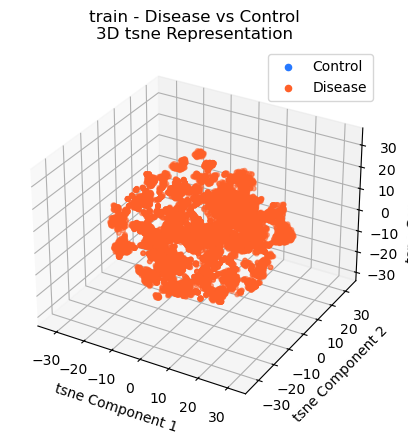

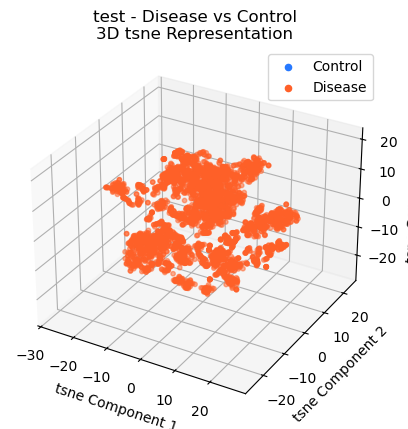

In [ ]:
for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = tsne_embeddings_train
    else:
        adata = adata_test
        embeddings = tsne_embeddings_test

    labels = [
        "Disease" if c != "Control" else "Control"
        for c in adata.obs["celltype"].to_list()
    ]

    # Map labels to colors
    label_color_map = {"Control": irb_colors[3], "Disease": irb_colors[2]}
    colors = [label_color_map.get(label, "grey") for label in labels]

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    # Scatter plot with colors
    ax.scatter(
        embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], c=colors, s=10, alpha=0.5
    )

    # Adding legend
    for label in label_color_map:
        ax.scatter([], [], [], c=label_color_map[label], label=label)
    ax.legend()

    # Set labels
    ax.set_xlabel("tsne Component 1")
    ax.set_ylabel("tsne Component 2")
    ax.set_zlabel("tsne Component 3")
    ax.set_title(f"{data_type} - Disease vs Control\n3D tsne Representation")

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{data_type}.tsne_3d.disease_control.png"),
        dpi=300,
        bbox_inches="tight",
    )

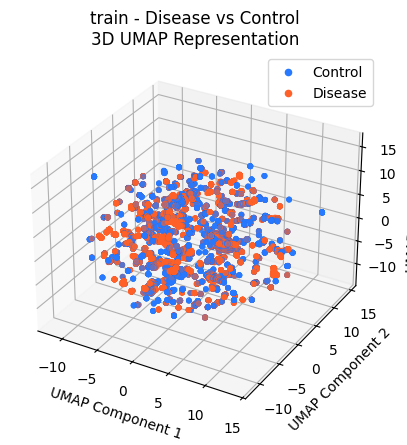

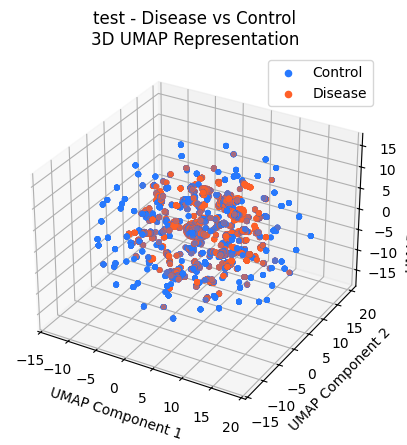

In [ ]:
for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = umap_embeddings_train
    else:
        adata = adata_test
        embeddings = umap_embeddings_test

    labels = [
        "Disease" if c != "Control" else "Control"
        for c in adata.obs["celltype"].to_list()
    ]

    # Map labels to colors
    label_color_map = {"Control": irb_colors[3], "Disease": irb_colors[2]}
    colors = [label_color_map.get(label, "grey") for label in labels]

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    # Scatter plot with colors
    ax.scatter(
        embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], c=colors, s=10, alpha=0.5
    )

    # Adding legend
    for label in label_color_map:
        ax.scatter([], [], [], c=label_color_map[label], label=label)
    ax.legend()

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_zlabel("UMAP Component 3")
    ax.set_title(f"{data_type} - Disease vs Control\n3D UMAP Representation")

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{data_type}.umap_3d.disease_control.png"),
        dpi=300,
        bbox_inches="tight",
    )

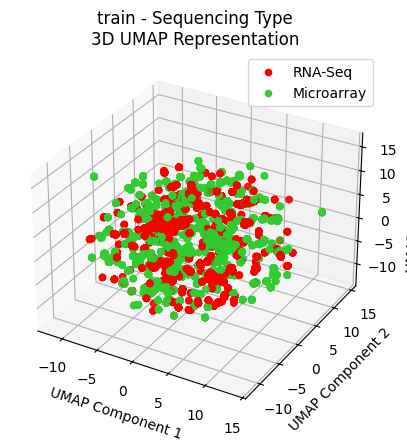

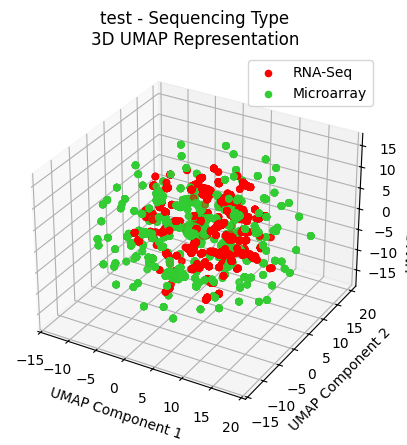

In [ ]:
for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = umap_embeddings_train
    else:
        adata = adata_test
        embeddings = umap_embeddings_test

    labels = adata.obs["library"].to_list()

    # Map labels to colors
    label_color_map = {"RNA-Seq": "red", "Microarray": "limegreen"}
    colors = [label_color_map.get(label, "grey") for label in labels]

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    # Scatter plot with colors
    ax.scatter(
        embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], c=colors, alpha=0.3
    )

    # Adding legend
    for label in label_color_map:
        ax.scatter([], [], [], c=label_color_map[label], label=label)
    ax.legend()

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_zlabel("UMAP Component 3")
    ax.set_title(f"{data_type} - Sequencing Type\n3D UMAP Representation")

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{embedding_type}.{data_type}.umap_3d.library.png"),
        dpi=300,
        bbox_inches="tight",
    )

In [ ]:
adata_train.shape

(7596, 3496)

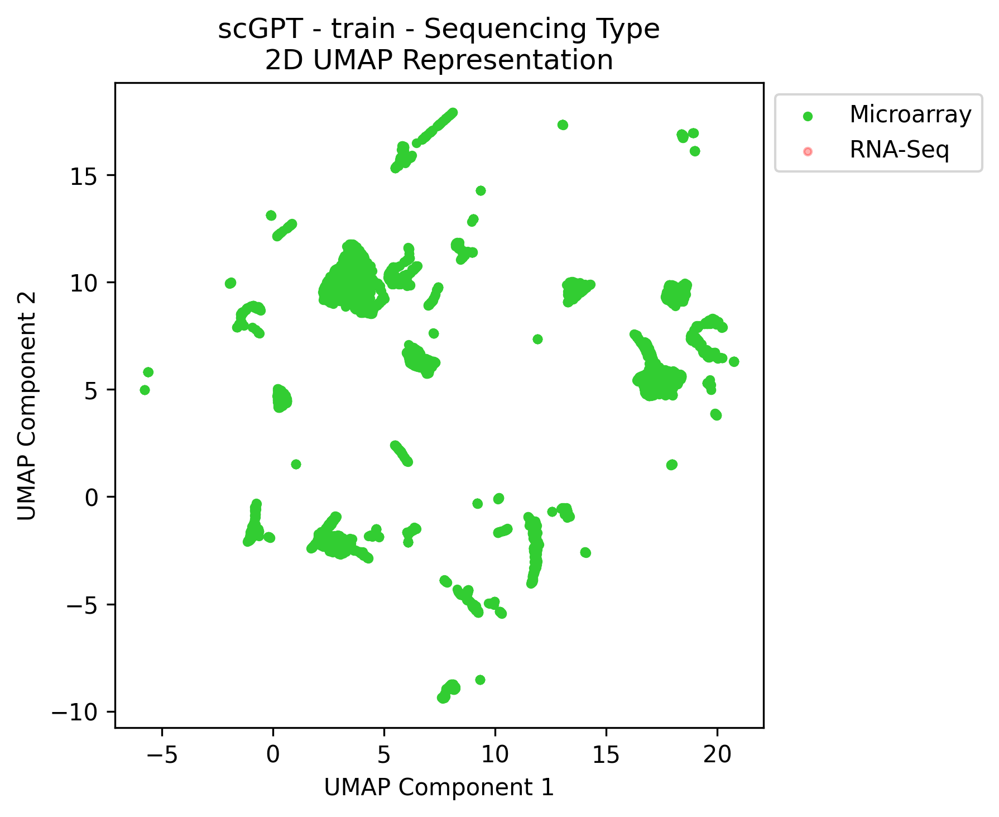

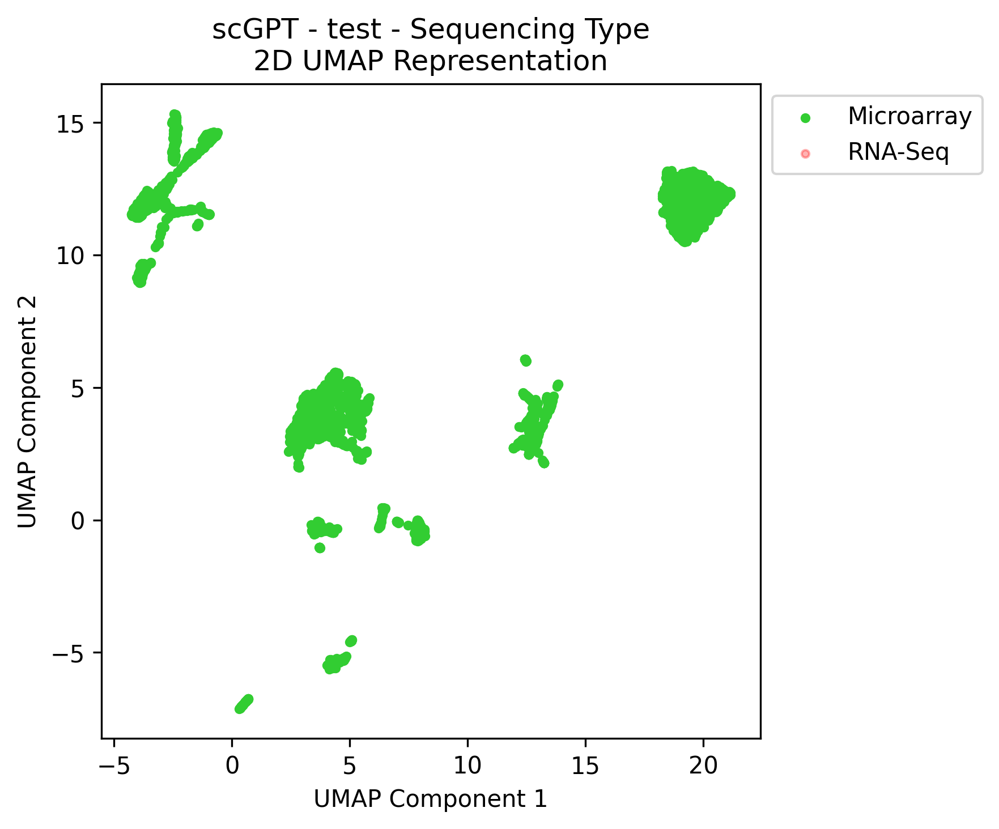

In [ ]:
for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = umap_embeddings_train
    else:
        adata = adata_test
        embeddings = umap_embeddings_test

    labels = adata.obs["library"].to_list()

    # Map labels to colors
    label_color_map = {"RNA-Seq": "red", "Microarray": "limegreen"}

    # Create a 2D scatter plot
    fig, ax = plt.subplots()

    # set figure size
    fig.set_size_inches(5, 5)
    fig.set_dpi(300)

    # Then plot Microarray points
    microarray_mask = [label == "Microarray" for label in labels]
    ax.scatter(
        embeddings[microarray_mask, 0],
        embeddings[microarray_mask, 1],
        c="limegreen",
        alpha=1,
        label="Microarray",
        s=10,
    )

    # First plot RNA-Seq points
    rna_seq_mask = [label == "RNA-Seq" for label in labels]
    ax.scatter(
        embeddings[rna_seq_mask, 0],
        embeddings[rna_seq_mask, 1],
        c="red",
        alpha=0.3,
        label="RNA-Seq",
        s=10,
    )

    # Adding legend
    ax.legend()

    ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_title(
        f"{embedding_type} - {data_type} - Sequencing Type\n2D UMAP Representation"
    )

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{embedding_type}.{data_type}.umap_2d.library.png"),
        dpi=300,
        bbox_inches="tight",
    )

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,celltype_id,test_split_1,test_split_2,test_split_3
109,DSA00181;GSM6322884;Control,GSE207912,GSE207912,22,22,DSA00181,nan,19399,Control,Control,Hepatocellular Carcinoma,RNA-Seq,2,1,0,0
110,DSA00181;GSM6322885;Control,GSE207912,GSE207912,22,22,DSA00181,nan,19399,Control,Control,Hepatocellular Carcinoma,RNA-Seq,2,1,0,0
111,DSA00181;GSM6322890;Case,GSE207912,GSE207912,22,22,DSA00181,nan,19399,Hepatocellular Carcinoma,Hepatocellular Carcinoma,Hepatocellular Carcinoma,RNA-Seq,4,1,0,0
112,DSA00181;GSM6322891;Case,GSE207912,GSE207912,22,22,DSA00181,nan,19399,Hepatocellular Carcinoma,Hepatocellular Carcinoma,Hepatocellular Carcinoma,RNA-Seq,4,1,0,0
113,DSA00209;GSM2711996;Control,GSE101685,GSE101685,58,58,DSA00209,Liver,17043,Control,Control,Hepatocellular Carcinoma,Microarray,2,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16115,DSA10295;GSM1012438;Case,GSE41258,GSE41258,225,225,DSA10295,Lung,12002,Colorectal Carcinoma,Colorectal Carcinoma,Colorectal Carcinoma,Microarray,1,1,0,0
16116,DSA10295;GSM1012444;Case,GSE41258,GSE41258,225,225,DSA10295,Lung,12002,Colorectal Carcinoma,Colorectal Carcinoma,Colorectal Carcinoma,Microarray,1,1,0,0
16117,DSA10295;GSM1012448;Case,GSE41258,GSE41258,225,225,DSA10295,Lung,12002,Colorectal Carcinoma,Colorectal Carcinoma,Colorectal Carcinoma,Microarray,1,1,0,0
16118,DSA10295;GSM1012449;Case,GSE41258,GSE41258,225,225,DSA10295,Lung,12002,Colorectal Carcinoma,Colorectal Carcinoma,Colorectal Carcinoma,Microarray,1,1,0,0


/tmp/ipykernel_7612/2834610596.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = plt.cm.get_cmap(
/tmp/ipykernel_7612/2834610596.py:54: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], [], c=label_color_map[label], label=label)


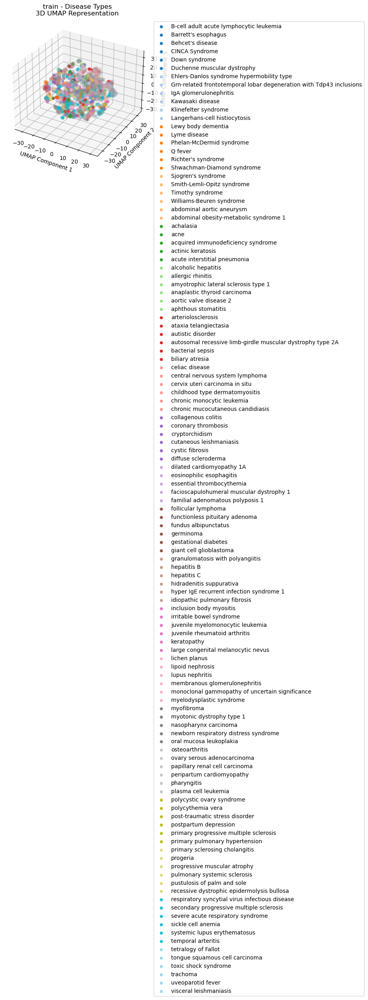

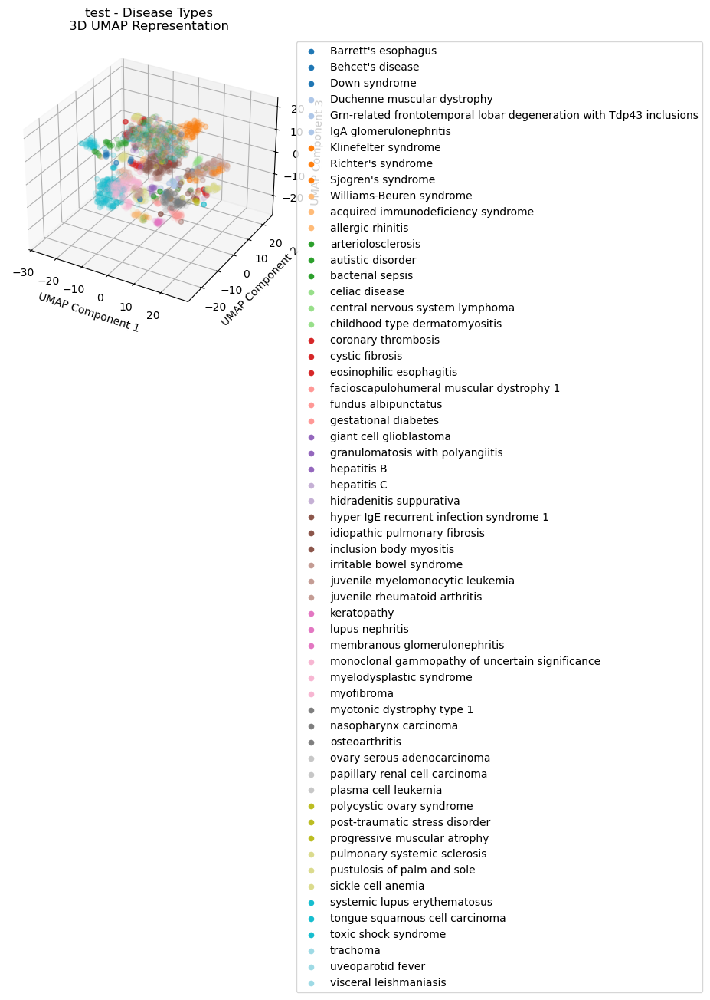

In [ ]:
for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = tsne_embeddings_train
    else:
        adata = adata_test
        embeddings = tsne_embeddings_test

    labels = adata.obs["celltype"].to_list()
    unique_labels = list(set(labels))
    unique_labels.sort()

    # Generate a color map using matplotlib
    colormap = plt.cm.get_cmap(
        "tab20", len(unique_labels)
    )  # You can change "viridis" to any other colormap

    # Map each label to a color
    label_color_map = {label: colormap(i) for i, label in enumerate(unique_labels)}

    # label_color_map.update({"Control": "grey"})

    colors = np.array([label_color_map[label] for label in labels])

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    # Scatter plot with colors
    c_idxs = [i for i, label in enumerate(labels) if label == "Control"]
    d_idxs = [i for i, label in enumerate(labels) if label != "Control"]

    # Plot the disease points first
    ax.scatter(
        embeddings[d_idxs, 0],
        embeddings[d_idxs, 1],
        embeddings[d_idxs, 2],
        c=colors[d_idxs],
        alpha=0.1,
    )

    # Then plot the control points (which will appear on top)
    ax.scatter(
        embeddings[c_idxs, 0],
        embeddings[c_idxs, 1],
        embeddings[c_idxs, 2],
        c=colors[c_idxs],
        alpha=0.1,
    )

    # Adding legend
    for label in label_color_map:

        ax.scatter([], [], [], c=label_color_map[label], label=label)
    ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_zlabel("UMAP Component 3")
    ax.set_title(f"{data_type} - Disease Types\n3D UMAP Representation")

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{data_type}.umap_3d.diseases.png"),
        dpi=300,
        bbox_inches="tight",
    )

/tmp/ipykernel_7612/850209454.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = plt.cm.get_cmap(


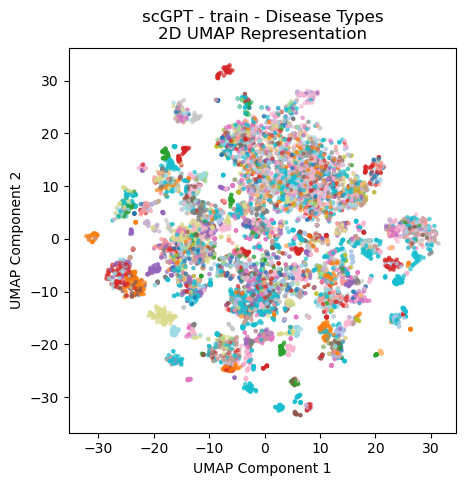

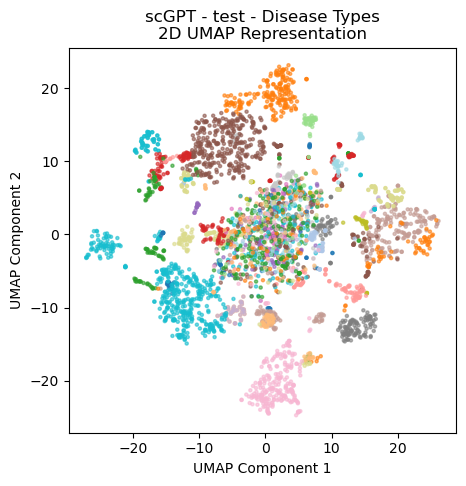

In [ ]:
for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = tsne_embeddings_train
    else:
        adata = adata_test
        embeddings = tsne_embeddings_test

    labels = adata.obs["celltype"].to_list()
    unique_labels = list(set(labels))
    unique_labels.sort()

    # Generate a color map using matplotlib
    colormap = plt.cm.get_cmap(
        "tab20", len(unique_labels)
    )  # You can change "tab20" to any other colormap

    # Map each label to a color
    label_color_map = {
        label: colormap(i) if label != "Control" else (0.5, 0.5, 0.5, 1.0)
        for i, label in enumerate(unique_labels)
    }

    # label_color_map.update({"Control": "grey"})

    colors = np.array([label_color_map[label] for label in labels])

    # Create a 2D scatter plot
    fig, ax = plt.subplots()

    fig.set_size_inches(5, 5)

    c_idxs = [i for i, label in enumerate(labels) if label == "Control"]
    d_idxs = [i for i, label in enumerate(labels) if label != "Control"]

    ax.scatter(
        embeddings[c_idxs, 0],
        embeddings[c_idxs, 1],
        c=colors[c_idxs],
        alpha=1,
        s=20,
    )

    # Plot the disease points first
    ax.scatter(
        embeddings[d_idxs, 0], embeddings[d_idxs, 1], c=colors[d_idxs], alpha=0.6, s=5
    )

    # Then plot the control points (which will appear on top)

    # Adding legend
    # for label in label_color_map:
    #     ax.scatter([], [], c=label_color_map[label], label=label)
    # ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_title(
        f"{embedding_type} - {data_type} - Disease Types\n2D UMAP Representation"
    )

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{embedding_type}.{data_type}.umap_2d.diseases.png"),
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

In [ ]:
label_color_map = {label: colormap(i) if label != "Control" else "grey" for i, label in enumerate(unique_labels)}

    # label_color_map.update({"Control": "grey"})

    colors = np.array([label_color_map[label] for label in labels])

    # Create a 2D scatter plot
    fig, ax = plt.subplots()

    fig.set_size_inches(5, 5)

    c_idxs = [i for i, label in enumerate(labels) if label == "Control"]
    d_idxs = [i for i, label in enumerate(labels) if label != "Control"]

    ax.scatter(
        embeddings[c_idxs, 0],
        embeddings[c_idxs, 1],
        c="grey",
        alpha=1,
        s=20,
    )

    # Plot the disease points first
    ax.scatter(
        embeddings[d_idxs, 0], embeddings[d_idxs, 1], c=colors[d_idxs], alpha=0.7, s=6
    )

    # Then plot the control points (which will appear on top)

    # Adding legend
    for label in label_color_map:
        ax.scatter([], [], c=label_color_map[label], label=label)
    ax.legend(loc="upper left", bbox_to_anchor=(1, 1))

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_title(
        f"{embedding_type} - {data_type} - Disease Types\n2D UMAP Representation"
    )

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{embedding_type}.{data_type}.umap_2d.diseases.png"),
        dpi=300,
        bbox_inches="tight",
    )

    plt.show()

In [ ]:
label_color_map

{'Breast Cancer': (0.12156862745098039,
  0.4666666666666667,
  0.7058823529411765,
  1.0),
 'Colorectal Carcinoma': (1.0, 0.7333333333333333, 0.47058823529411764, 1.0),
 'Control': 'grey',
 "Crohn's Disease": (0.5490196078431373,
  0.33725490196078434,
  0.29411764705882354,
  1.0),
 'Hepatocellular Carcinoma': (0.9686274509803922,
  0.7137254901960784,
  0.8235294117647058,
  1.0),
 'Multiple Sclerosis': (0.7372549019607844,
  0.7411764705882353,
  0.13333333333333333,
  1.0),
 'Prostate Cancer': (0.6196078431372549,
  0.8549019607843137,
  0.8980392156862745,
  1.0)}

/tmp/ipykernel_339081/3865364385.py:62: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter([], [], [], c=label_color_map[label], label=label)


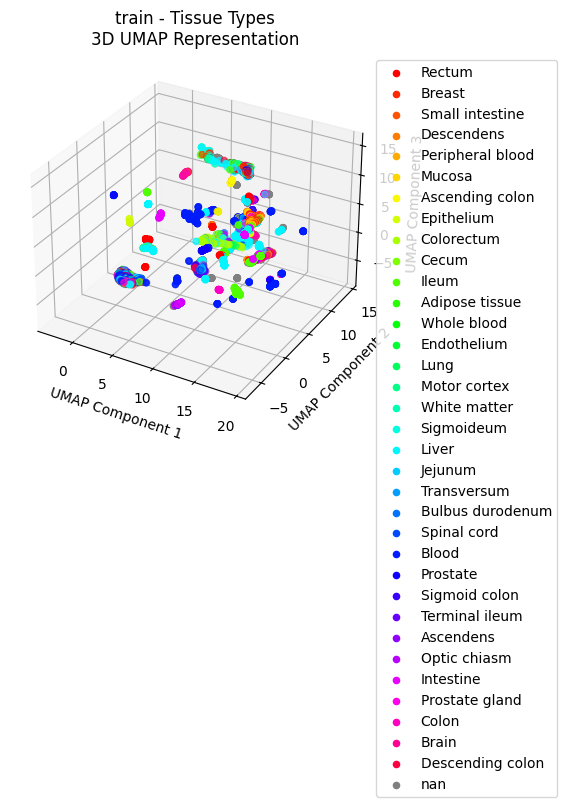

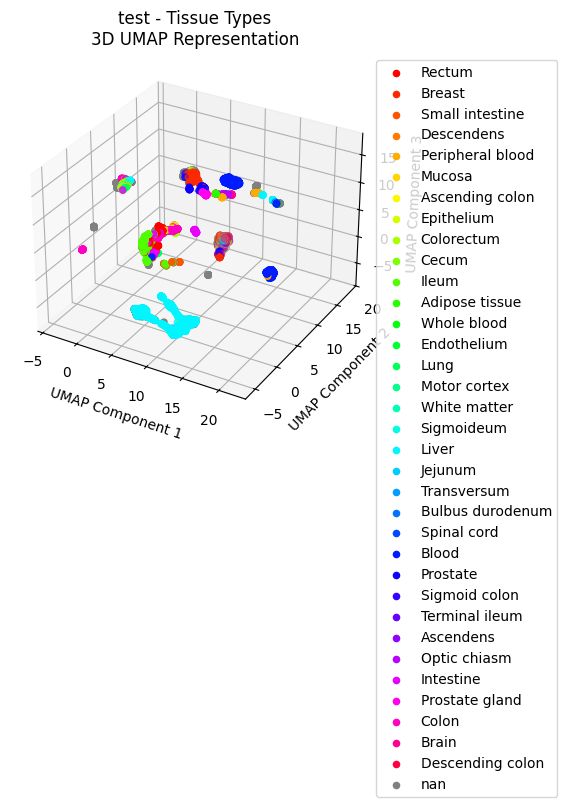

In [ ]:
for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = umap_embeddings_train
    else:
        adata = adata_test
        embeddings = umap_embeddings_test

    labels = adata.obs["celltype"].to_list()
    unique_labels = list(set(labels))
    unique_labels.sort()

    labels = adata_test.obs["tissue"].to_list()

    unique_labels = list(set(labels))

    # Get a color map
    cmap = plt.get_cmap("hsv")

    # Generate a unique color for each unique label
    colors = [cmap(i / len(unique_labels)) for i in range(len(unique_labels))]

    # Create a mapping from unique labels to colors
    label_color_map = {
        label: color
        for label, color in zip(unique_labels, colors)
        if str(label) != "nan"
    }
    label_color_map.update({"nan": (0.5, 0.5, 0.5, 1.0)})

    # Map the labels to their corresponding colors
    assigned_colors = list()
    for label in labels:
        assigned_colors.append(label_color_map[label])
    assigned_colors = np.array(assigned_colors)

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    # Scatter plot with colors
    nan_idxs = [i for i, label in enumerate(labels) if str(label) == "nan"]
    t_idxs = [i for i, label in enumerate(labels) if str(label) != "nan"]

    ax.scatter(
        embeddings[t_idxs, 0],
        embeddings[t_idxs, 1],
        embeddings[t_idxs, 2],
        c=assigned_colors[t_idxs],
    )

    ax.scatter(
        embeddings[nan_idxs, 0],
        embeddings[nan_idxs, 1],
        embeddings[nan_idxs, 2],
        c=assigned_colors[nan_idxs],
        alpha=1,
    )

    # Adding legend
    for label in label_color_map:
        ax.scatter([], [], [], c=label_color_map[label], label=label)
    ax.legend(loc="upper right", bbox_to_anchor=(1.5, 1))

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_zlabel("UMAP Component 3")
    ax.set_title(f"{data_type} - Tissue Types\n3D UMAP Representation")

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{data_type}.umap_3d.tissue_types.png"),
        dpi=300,
        bbox_inches="tight",
    )

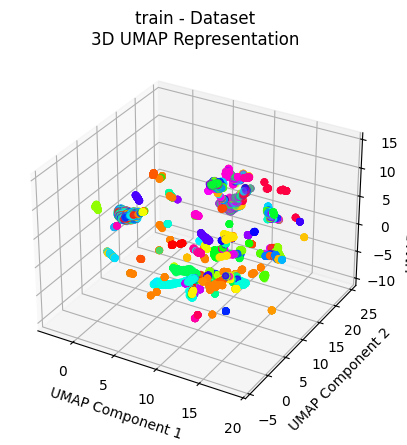

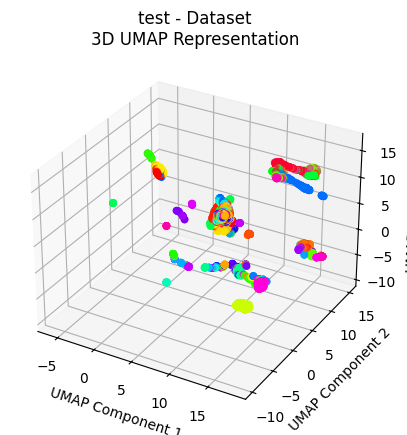

In [ ]:
for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = umap_embeddings_train
    else:
        adata = adata_test
        embeddings = umap_embeddings_test

    labels = adata.obs["dataset"].to_list()

    unique_labels = list(set(labels))

    # Get a color map
    cmap = plt.get_cmap("hsv")

    # Generate a unique color for each unique label
    colors = [cmap(i / len(unique_labels)) for i in range(len(unique_labels))]

    # Create a mapping from unique labels to colors
    label_color_map = {
        label: color
        for label, color in zip(unique_labels, colors)
        if str(label) != "nan"
    }
    label_color_map.update({"nan": (0.5, 0.5, 0.5, 1.0)})

    # Map the labels to their corresponding colors
    assigned_colors = list()
    for label in labels:
        assigned_colors.append(label_color_map[label])

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    # Scatter plot with colors
    ax.scatter(embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], c=assigned_colors)

    # Adding legend
    # for label in label_color_map:
    #     ax.scatter([], [], [], c=label_color_map[label], label=label)
    # ax.legend(loc="upper right", bbox_to_anchor=(1.5, 1))

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_zlabel("UMAP Component 3")
    ax.set_title(f"{data_type} - Dataset\n3D UMAP Representation")

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{data_type}.umap_3d.dataset.png"),
        dpi=300,
        bbox_inches="tight",
    )

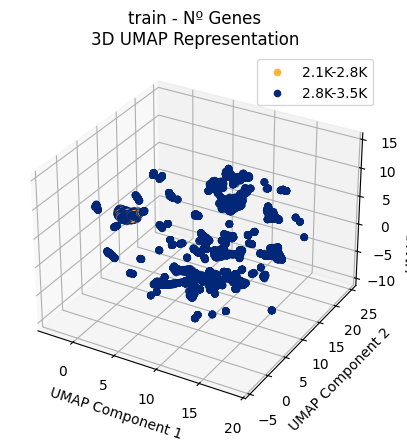

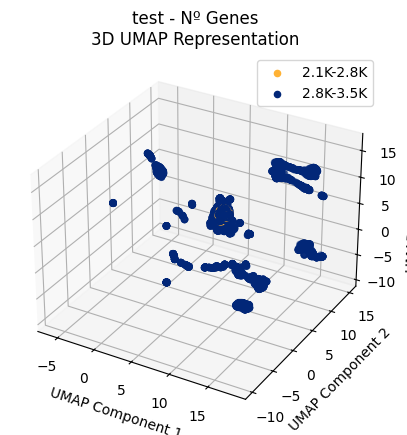

In [ ]:
def format_number(n):
    """Format the number to include 'K' for thousands."""
    if n >= 1000:
        return f"{n/1000:.1f}K"
    return str(n)


def get_groups_by_counts(
    data,
    max_genes,
    n_groups=4,
):
    labels = list()
    bins = np.arange(0, max_genes + 1, max_genes / n_groups)
    formatted_bins = [format_number(bin) for bin in bins]

    for n_genes in data:
        for i, bin in enumerate(bins):
            if i == 0:
                label = f"<={formatted_bins[i]}"
            else:
                label = f"{formatted_bins[i-1]}-{formatted_bins[i]}"
            if n_genes <= bin:
                labels.append(label)
                break

    return labels


for data_type in ["train", "test"]:
    if data_type == "train":
        adata = adata_train
        embeddings = umap_embeddings_train
    else:
        adata = adata_test
        embeddings = umap_embeddings_test

    n_genes = (~np.isnan(adata.X)).sum(axis=1)
    labels = get_groups_by_counts(n_groups=5, max_genes=max(n_genes), data=n_genes)
    unique_labels = set(labels)

    label_color_map = {
        k: v
        for k, v in zip(
            unique_labels, [irb_colors[0], irb_colors[4], irb_colors[2], irb_colors[1]]
        )
    }
    colors = [label_color_map.get(label, "grey") for label in labels]

    # Create a 3D scatter plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection="3d")

    # Scatter plot with colors
    ax.scatter(embeddings[:, 0], embeddings[:, 1], embeddings[:, 2], c=colors)

    # Adding legend
    for label in label_color_map:
        ax.scatter([], [], [], c=label_color_map[label], label=label)
    ax.legend()

    # Set labels
    ax.set_xlabel("UMAP Component 1")
    ax.set_ylabel("UMAP Component 2")
    ax.set_zlabel("UMAP Component 3")
    ax.set_title(f"{data_type} - Nº Genes\n3D UMAP Representation")

    # Display the plot
    plt.savefig(
        os.path.join(output_dir, f"{data_type}.umap_3d.n_genes.png"),
        dpi=300,
        bbox_inches="tight",
    )

## Plot Distances/Similarities

In [ ]:
split_idx = 0


# Recreate full AnnData (backed mode to full memory)
adata_orig_full = adata_orig.to_memory()

# Extract correct subsets using saved indices
adata_train = adata_orig_full[train_indices[split_idx], :].copy()
adata_valid = adata_orig_full[valid_indices[split_idx], :].copy()
adata_test = adata_orig_full[adata_orig_full.obs[f"test_split_{split_idx+1}"] == 1, :].copy()
print(f"Nº of cells Test: {adata_test.shape[0]}")
print(f"Nº of cells Train: {adata_train.shape[0]}")

# load scGPT embeddings
scgpt_emb_test = merge_embeddings(all_outputs_test[split_idx])
scgpt_emb_valid = merge_embeddings(all_outputs_valid[split_idx])
scgpt_emb_train = merge_embeddings(all_outputs_train[split_idx])



Nº of cells Test: 3921
Nº of cells Train: 11002


<Axes: ylabel='Density'>

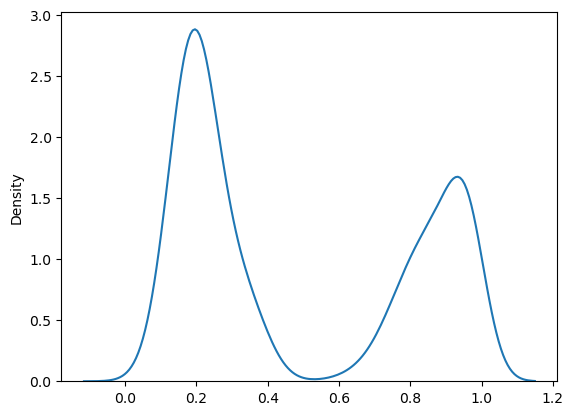

In [ ]:
adata_train.obs[adata_train.obs["do_term"]=="Kawasaki disease"]
k = scgpt_emb_train[adata_train.obs["do_term"]=="Kawasaki disease"]

_idxs = np.where(adata_train.obs["do_term"]=="Kawasaki disease")[0]
k = scgpt_emb_train[_idxs]

sns.kdeplot((1-pairwise_distances(k, metric="cosine"))[np.triu_indices(k.shape[0], k=1)])

In [ ]:
# compute cosine similarity matrix, pdist and cdist
from scipy.spatial.distance import cosine
from scipy.spatial.distance import pdist, cdist

# cosine similarity matrix
c_matrix_test = 1 - cdist(
    scgpt_emb_test, scgpt_emb_test, "cosine"
)  # 1 - cosine distance

In [ ]:
c_matrix_train = 1 - cdist(scgpt_emb_train, scgpt_emb_train, "cosine")

# euclidean distance matrix
e_matrix_test = cdist(scgpt_emb_test, scgpt_emb_test, "euclidean")
e_matrix_train = cdist(scgpt_emb_train, scgpt_emb_train, "euclidean")

# pearson correlation matrix
p_matrix_test = 1 - cdist(
    scgpt_emb_test, scgpt_emb_test, "correlation"
)  # 1 - correlation distance
p_matrix_train = 1 - cdist(scgpt_emb_train, scgpt_emb_train, "correlation")

In [ ]:
# load pairs of do ids
df_pairs = pd.read_csv("/aloy/home/ddalton/projects/BQ_diseases/outputs/do_pairs.universe.ic.csv")



In [ ]:
# filter only pairs in study
doids_study = adata_test.obs["do_id"].to_list()
df_query = df_pairs.query(
    f"node_1 in {doids_study} and node_2 in {doids_study}"
)
print(f"Pairs in Study: {len(df_query)}")

# filter most significant pairs based on IC Sanchez
pct = 1
doid_2_ic = dict(zip(df_pairs["node_lca"], df_pairs["ic_sanchez"]))
ic_values = [doid_2_ic[doid] for doid in df_pairs["node_lca"].unique()]

thr = np.percentile(ic_values, pct)

df_query = df_query[df_query["ic_sanchez"] >= 4.5]
print(f"Significant Pairs: {len(df_query)}")



Pairs in Study: 1788
Significant Pairs: 104


Cosine Similarity Values: 41552
Mean Cosine Similarity: 0.3322195641993689
Random Cosine Similarity Values: 41552


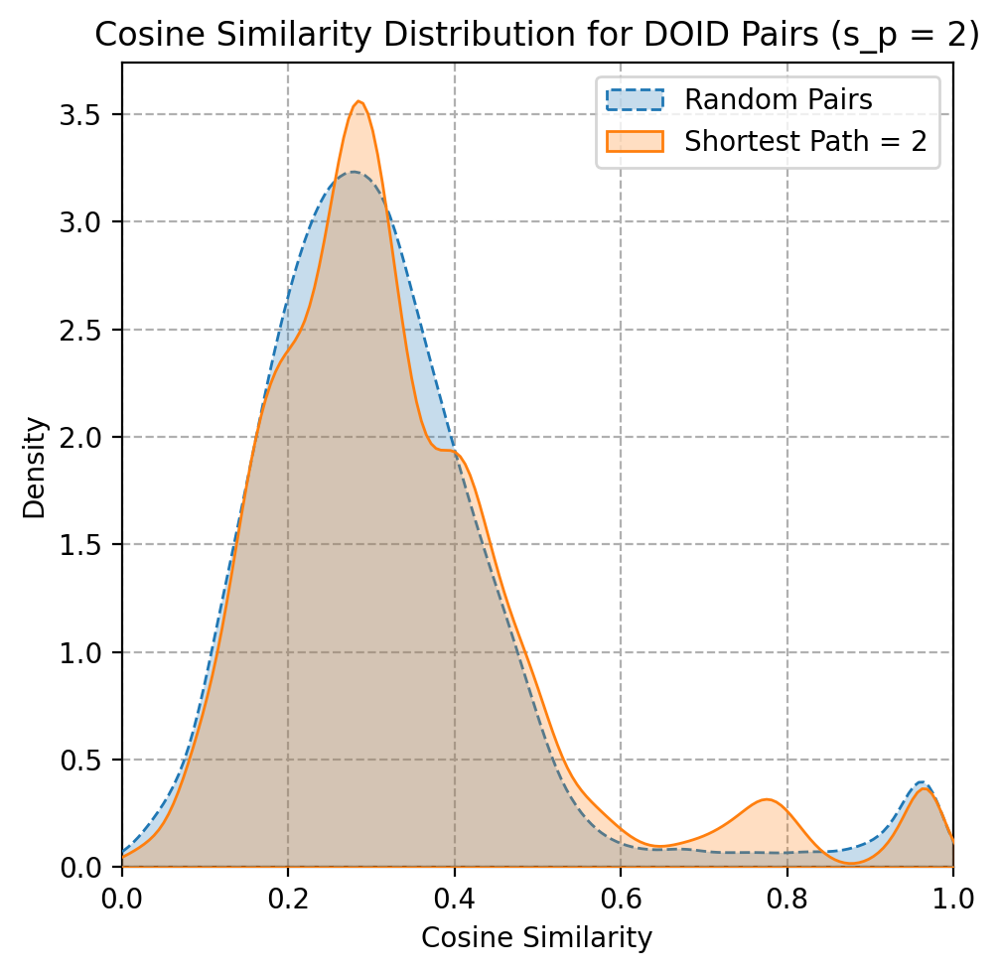

Cosine Similarity Values: 281674
Mean Cosine Similarity: 0.33907745361998004
Random Cosine Similarity Values: 281674


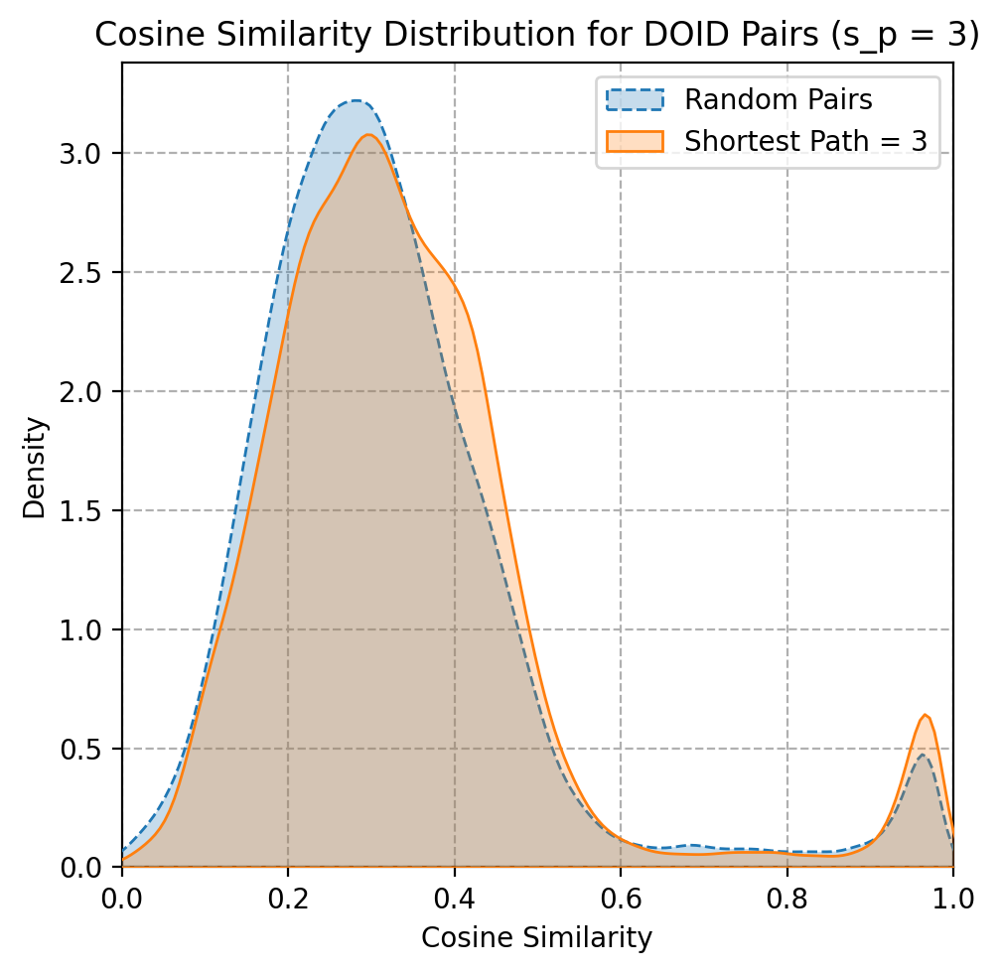

Cosine Similarity Values: 1018446
Mean Cosine Similarity: 0.3402101639050031
Random Cosine Similarity Values: 1018446


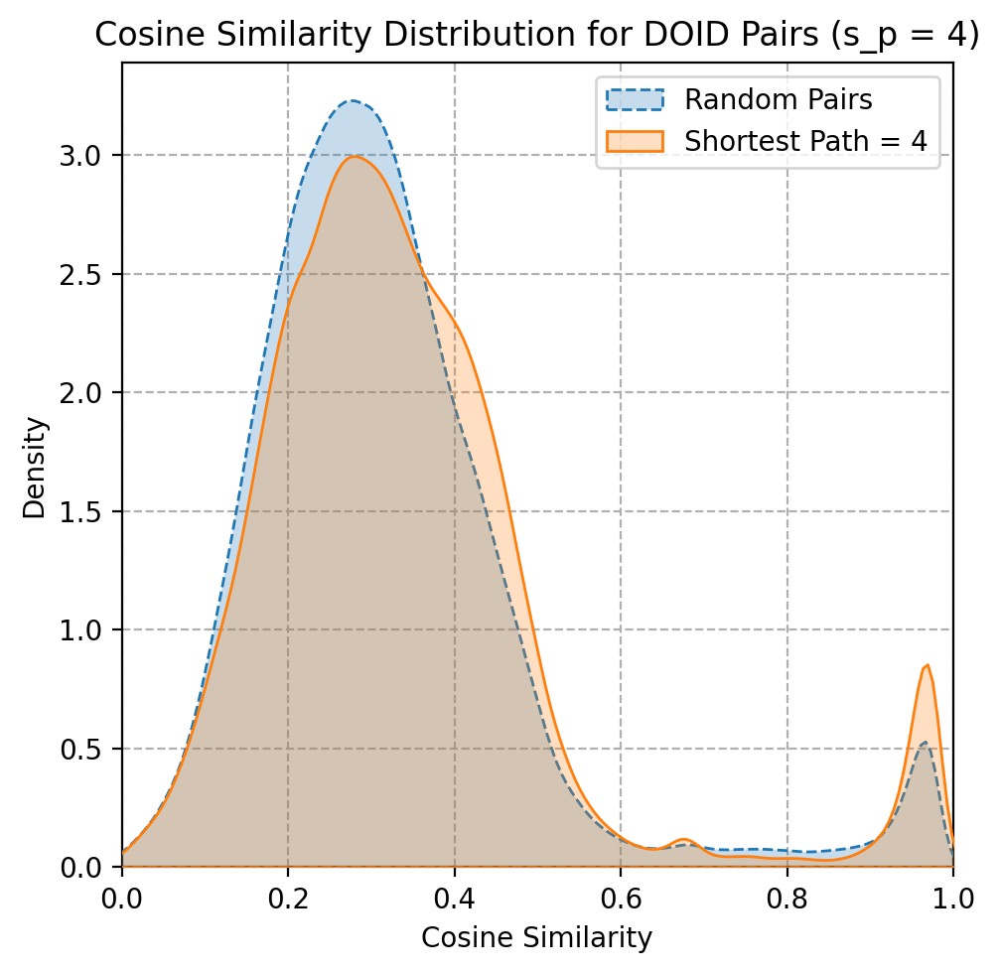

Cosine Similarity Values: 1181852
Mean Cosine Similarity: 0.3267676364959127
Random Cosine Similarity Values: 1181852


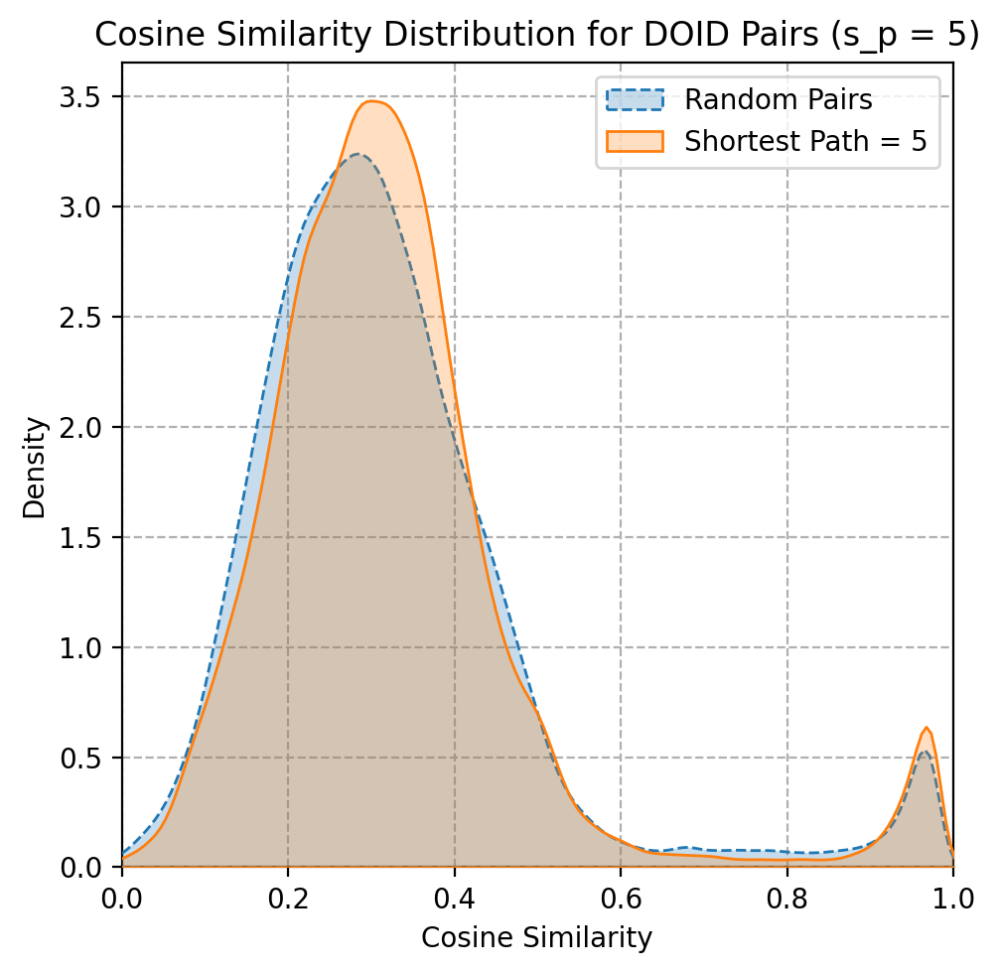

In [ ]:
import itertools
flatten = lambda l: [item for sublist in l for item in sublist]

# compute cosine similarity for entire training set ! ! !
cosine_train = 1 - cdist(scgpt_emb_train,scgpt_emb_train, "cosine")

# get indexes of pairs 
for s_p in [2,3,4,5]:
    # get pairs w/ shortest path
    _df_query = df_query.query(f"shortest_path == {s_p}")

    _cosine_values = list()

    _all_idxs = list()
    for _, _row in _df_query.iterrows():

        _n1, _n2 = _row["node_1"], _row["node_2"]

        # get indexes of nodes
        _idx1 = np.where(adata_train.obs["do_id"] == _n1)[0]
        _idx2 = np.where(adata_train.obs["do_id"] == _n2)[0]

        # get all combinations between indexes
        _all_idxs.extend(list(itertools.product(_idx1, _idx2)))


    _all_idxs = np.array(_all_idxs)

    _cosine_values = cosine_train[_all_idxs[:,0], _all_idxs[:,1]]

    print(f"Cosine Similarity Values: {len(_cosine_values)}")
    print(f"Mean Cosine Similarity: {np.mean(_cosine_values)}")
    
    # random distribution
    i = 0
    _rand_idx1 = list()
    _rand_idx2 = list()
    while i < len(_cosine_values):
        
        # get random indexes
        _idx1, _idx2 = np.random.choice(
            np.arange(len(adata_train)), 2, replace=False
        )

        # retrieve do ids
        rand_n1 = adata_train.obs["do_id"].iloc[_idx1]
        rand_n2 = adata_train.obs["do_id"].iloc[_idx2]

        # filter out same disease pairs
        if rand_n1 == rand_n2:
            continue

        # filter out related disease pairs
        if str(tuple(sorted([rand_n1, rand_n2]))) in df_query["pair_key_doid"].to_list():
            continue

        # store indexes
        _rand_idx1.append(_idx1)
        _rand_idx2.append(_idx2)

        i += 1
        print(f"{i}/{len(_cosine_values)}", end="\r")

    # retrieve embeddings
    _cosine_rand = cosine_train[_rand_idx1, _rand_idx2]
        
    print(f"Random Cosine Similarity Values: {len(_cosine_rand)}")

    plt.figure(figsize=(5, 5), dpi=200)
    sns.kdeplot(_cosine_rand, label="Random Pairs", linestyle="--", fill=True, zorder=3)
    sns.kdeplot(_cosine_values, label=f"Shortest Path = {s_p}", fill=True, zorder=3)
    plt.title(f"Cosine Similarity Distribution for DOID Pairs (s_p = {s_p})")
    plt.xlabel("Cosine Similarity")
    plt.ylabel("Density")
    plt.legend()
    plt.tight_layout()
    plt.xlim(0, 1)
    plt.grid(zorder=-3, linestyle="--")
    plt.show()



Cosine Similarity Values: 2366208
Mean Cosine Similarity: 0.3747620547923489
Random Cosine Similarity Values: 2366208


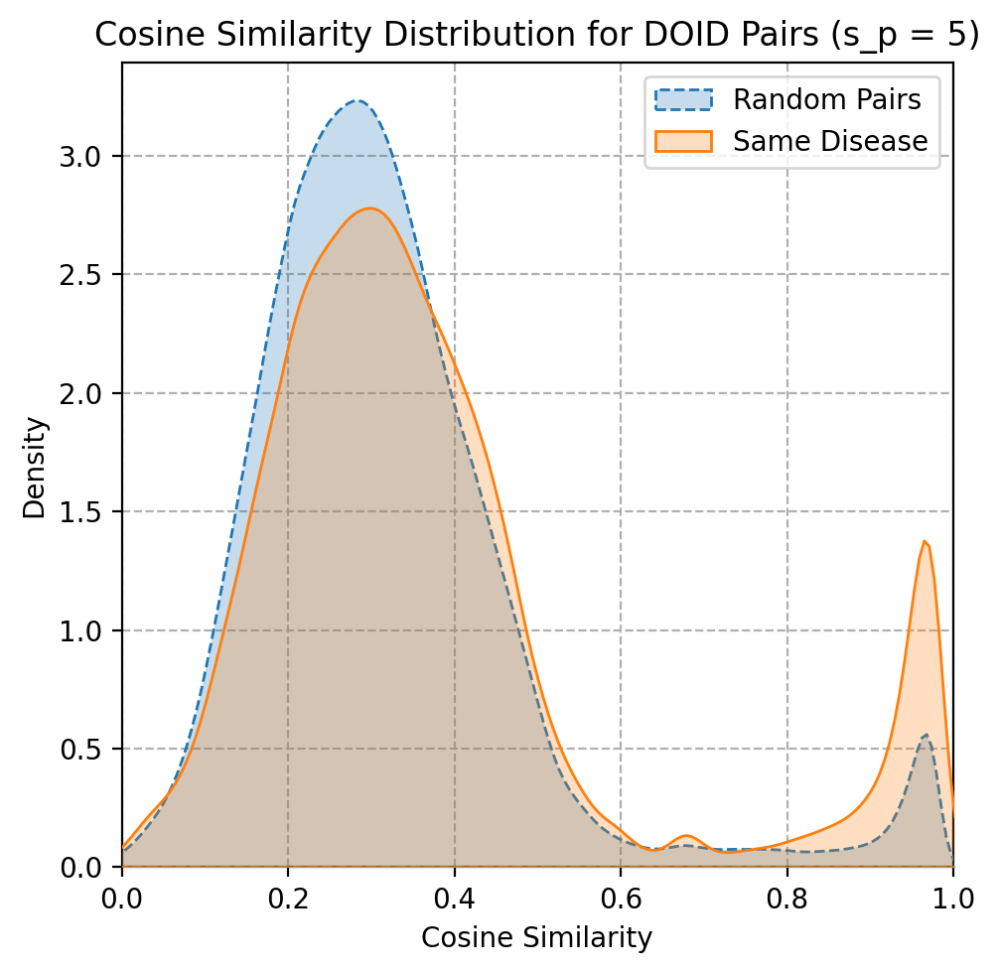

In [ ]:
import itertools
flatten = lambda l: [item for sublist in l for item in sublist]

# compute cosine similarity for entire training set ! ! !
cosine_train = 1 - cdist(scgpt_emb_train,scgpt_emb_train, "cosine")


# get pairs w/ shortest path

_all_idxs = list()
for _doid in adata_train.obs["do_id"].unique():

    # get idxs which match disease
    _idxs = np.where(adata_train.obs["do_id"] == _doid)[0]

    _combination = list(itertools.combinations(_idxs, 2))

    # get all pairs of indexes exlucding itself
    _all_idxs.extend(_combination)

_all_idxs = np.array(_all_idxs)

_cosine_values = cosine_train[_all_idxs[:,0], _all_idxs[:,1]]

print(f"Cosine Similarity Values: {len(_cosine_values)}")
print(f"Mean Cosine Similarity: {np.mean(_cosine_values)}")

# random distribution
i = 0
_rand_idx1 = list()
_rand_idx2 = list()
while i < len(_cosine_values):
    
    # get random indexes
    _idx1, _idx2 = np.random.choice(
        np.arange(len(adata_train)), 2, replace=False
    )

    # retrieve do ids
    rand_n1 = adata_train.obs["do_id"].iloc[_idx1]
    rand_n2 = adata_train.obs["do_id"].iloc[_idx2]

    # filter out same disease pairs
    if rand_n1 == rand_n2:
        continue

    # filter out related disease pairs
    if str(tuple(sorted([rand_n1, rand_n2]))) in df_query["pair_key_doid"].to_list():
        continue

    # store indexes
    _rand_idx1.append(_idx1)
    _rand_idx2.append(_idx2)

    i += 1
    print(f"{i}/{len(_cosine_values)}", end="\r")

# retrieve embeddings
_cosine_rand = cosine_train[_rand_idx1, _rand_idx2]
    
print(f"Random Cosine Similarity Values: {len(_cosine_rand)}")

plt.figure(figsize=(5, 5), dpi=200)
sns.kdeplot(_cosine_rand, label="Random Pairs", linestyle="--", fill=True, zorder=3)
sns.kdeplot(_cosine_values, label=f"Same Disease", fill=True, zorder=3)
plt.title(f"Cosine Similarity Distribution for DOID Pairs (s_p = {s_p})")
plt.xlabel("Cosine Similarity")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.xlim(0, 1)
plt.grid(zorder=-3, linestyle="--")
plt.show()



In [ ]:
import itertools
flatten = lambda l: [item for sublist in l for item in sublist]

# compute cosine similarity for entire training set ! ! !
cosine_train = 1 - cdist(scgpt_emb_train,scgpt_emb_train, "cosine")



NameError: name 'tqdm' is not defined

In [ ]:
from tqdm import tqdm
# get pairs w/ shortest path

_cosine_values_mean = list()
for _doid in tqdm(adata_train.obs["do_id"].unique()):

    # get idxs which match disease
    _idxs = np.where(adata_train.obs["do_id"] == _doid)[0]

    _combination = np.array(list(itertools.combinations(_idxs, 2)))

    _v = cosine_train[_combination[:,0], _combination[:,1]]

    _cosine_values_mean.append(np.mean(_v))

100%|██████████| 117/117 [00:00<00:00, 272.34it/s]


(array([10., 32., 25., 16., 12.,  6.,  3.,  2.,  4.,  7.]),
 array([0.31183139, 0.37982059, 0.44780979, 0.51579899, 0.58378819,
        0.65177739, 0.71976658, 0.78775578, 0.85574498, 0.92373418,
        0.99172338]),
 <BarContainer object of 10 artists>)

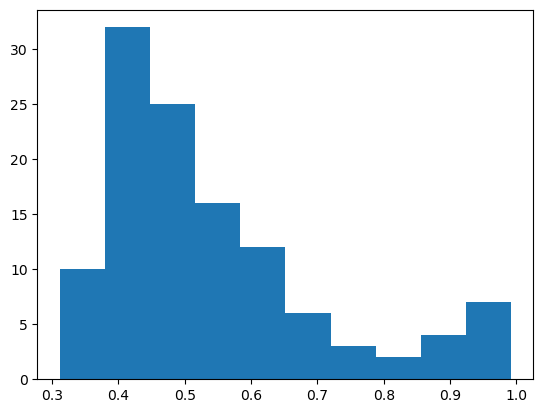

In [ ]:
plt.hist(_cosine_values_mean)

In [ ]:
_idxs = np.where(adata_train.obs["do_id"]=="DOID:9074")[0]
_emb = scgpt_emb_train[_idxs]


(array([  7763.,  85756., 248609., 360340., 275532.,  99380.,  19751.,
         11168.,   6623.,  57824.]),
 array([-0.08686447,  0.02182198,  0.13050842,  0.23919487,  0.34788132,
         0.45656776,  0.56525421,  0.67394066,  0.78262711,  0.89131355,
         1.        ]),
 <BarContainer object of 10 artists>)

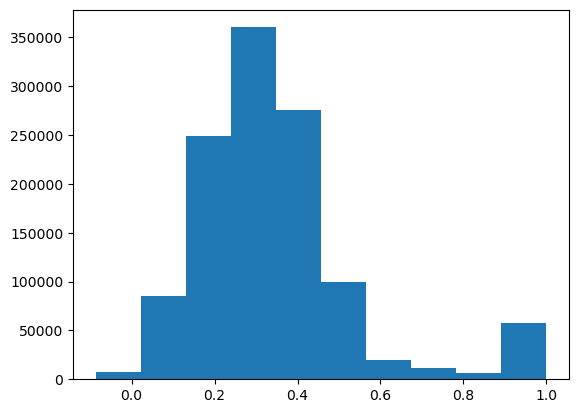

In [ ]:
# get indexes under diagonal
plt.hist((1 - pairwise_distances(_emb, metric = "cosine"))[np.tril_indices(len(_emb), -1)])

In [ ]:
scgpt_emb_train

(11002, 512)

In [ ]:
list(itertools.combinations([1,2,3,4,5], 2))

In [ ]:
_idx = np.argwhere(_cosine_rand>0.9).flatten()

_idx1 = np.array(_rand_idx1)[_idx]
_idx2 = np.array(_rand_idx2)[_idx]

for i in range(len(_idx1)):
    print(f"Pair: {i+1}/{len(_idx1)}", end="\r")
    _n1 = adata_train.obs["do_term"].iloc[_idx1[i]]
    _n2 = adata_train.obs["do_term"].iloc[_idx2[i]]

    _d1 = adata_train.obs["dataset"].iloc[_idx1[i]]
    _d2 = adata_train.obs["dataset"].iloc[_idx2[i]]

    print(f"Pair: {i+1}/{len(_idx1)}")
    print(f"Node 1: {_n1} {_d1}")
    print(f"Node 2: {_n2} {_d2}")
    

Pair: 1/1160
Node 1: cervix uteri carcinoma in situ GSE120691
Node 2: Kawasaki disease GSE68004
Pair: 2/1160
Node 1: Richter's syndrome GSE50006
Node 2: nasopharynx carcinoma GSE64634
Pair: 3/1160
Node 1: myelodysplastic syndrome GSE58831
Node 2: Ehlers-Danlos syndrome hypermobility type GSE218012
Pair: 4/1160
Node 1: systemic lupus erythematosus GSE72326
Node 2: bacterial sepsis GSE64457
Pair: 5/1160
Node 1: idiopathic pulmonary fibrosis GSE124685
Node 2: systemic lupus erythematosus GSE72509
Pair: 6/1160
Node 1: idiopathic pulmonary fibrosis GSE28042
Node 2: central nervous system lymphoma GSE25638
Pair: 7/1160
Node 1: systemic lupus erythematosus GSE45291
Node 2: Down syndrome GSE69210
Pair: 8/1160
Node 1: trachoma GSE20430
Node 2: tetralogy of Fallot GSE26125
Pair: 9/1160
Node 1: toxic shock syndrome GSE4607
Node 2: myelodysplastic syndrome GSE58831
Pair: 10/1160
Node 1: Richter's syndrome GSE66117
Node 2: myotonic dystrophy type 1 GSE67812
Pair: 11/1160
Node 1: membranous glomerul

In [ ]:
import torch
model = torch.load("/aloy/home/ddalton/projects/scGPT_playground/outputs/run-25-04-29-01/model_1.pt")

/tmp/ipykernel_29224/1296222550.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("/aloy/home/ddalton/projects/scGPT_playground/outputs/run-25-04-29-01/

In [ ]:
adata_train.obs

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3
22342,DSA06906;GSM103007;Case,GSE4607,GSE4607,153,153,DSA06906,Blood,17043,Septic Shock,toxic shock syndrome,Septic Shock,Microarray,DOID:14115,DOID:14115,toxic shock syndrome,118,1,0,0
6981,DSA02194;GSM1650348;Case,GSE67596,GSE67596,133,133,DSA02194,nan,17043,Juvenile Idiopathic Arthritis,juvenile rheumatoid arthritis,Juvenile Idiopathic Arthritis,Microarray,DOID:676,DOID:676,juvenile rheumatoid arthritis,75,0,1,0
22181,DSA06862;GSM1101116;Case,GSE45291,GSE45291,619,619,DSA06862,Blood,15388,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,Microarray,DOID:9074,DOID:9074,systemic lupus erythematosus,114,0,1,0
16337,DSA05054;GSM5795816;Case,GSE193351,GSE193351,370,370,DSA05054,Skin,19399,Lichen Planus,lichen planus,Lichen Planus,RNA-Seq,DOID:9201,DOID:9201,lichen planus,78,0,0,0
11676,DSA03666;GSM952787;Case,GSE38958,GSE38958,403,403,DSA03666,nan,16337,Idiopathic Pulmonary Fibrosis,idiopathic pulmonary fibrosis,Idiopathic Pulmonary Fibrosis,Microarray,DOID:0050156,DOID:0050156,idiopathic pulmonary fibrosis,71,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9757,DSA03245;GSM728451;Case,GSE29429,GSE29429,183,183,DSA03245,Blood,17865,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,Microarray,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,0,0,1
182,DSA00094;GSM4057447;Case,GSE136757,GSE136757,293,293,DSA00094,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
20397,DSA06304;GSM1863683;Case,GSE72509,GSE72509,767,767,DSA06304,Whole blood,19399,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,RNA-Seq,DOID:9074,DOID:9074,systemic lupus erythematosus,114,0,0,1
17292,DSA05533;GSM2672810;Case,GSE100163,GSE100163,328,328,DSA05533,Whole blood,17786,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,Microarray,DOID:9074,DOID:9074,systemic lupus erythematosus,114,1,0,0


In [ ]:
adata_test

,ids,dataset,dataset_id,batch,batch_id,dsaid,tissue,n_genes,disease,celltype,disease_study,library,do_id_study,do_id,do_term,celltype_id,test_split_1,test_split_2,test_split_3
111,DSA00093;GSM4057387;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
112,DSA00093;GSM4057391;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
113,DSA00093;GSM4057394;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
114,DSA00093;GSM4057396;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
115,DSA00093;GSM4057400;Case,GSE136757,GSE136757,293,293,DSA00093,Skin,17043,Psoriasis,pustulosis of palm and sole,Psoriasis,Microarray,DOID:4398,DOID:4398,pustulosis of palm and sole,107,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30670,DSA10004;GSM4962541;Case,GSE162828,GSE162828,395,395,DSA10004,Peripheral blood,19399,Systemic Lupus Erythematosus,systemic lupus erythematosus,Systemic Lupus Erythematosus,RNA-Seq,DOID:9074,DOID:9074,systemic lupus erythematosus,114,1,0,0
30850,DSA10131;GSM5005391;Case,GSE164264,GSE164264,454,454,DSA10131,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0
30851,DSA10131;GSM5005392;Case,GSE164264,GSE164264,454,454,DSA10131,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0
30853,DSA10132;GSM5005393;Case,GSE164264,GSE164264,454,454,DSA10132,Blood,19399,Acquired Immunodeficiency Syndrome,acquired immunodeficiency syndrome,Acquired Immunodeficiency Syndrome,RNA-Seq,DOID:635,DOID:635,acquired immunodeficiency syndrome,26,1,0,0


In [ ]:
_idx

array([  184,   199,   260, ..., 41381, 41454, 41470])

In [ ]:
np.array(_rand_idx1)[_idx]

array([5430, 4670, 3705, ..., 7511,  743, 3069])

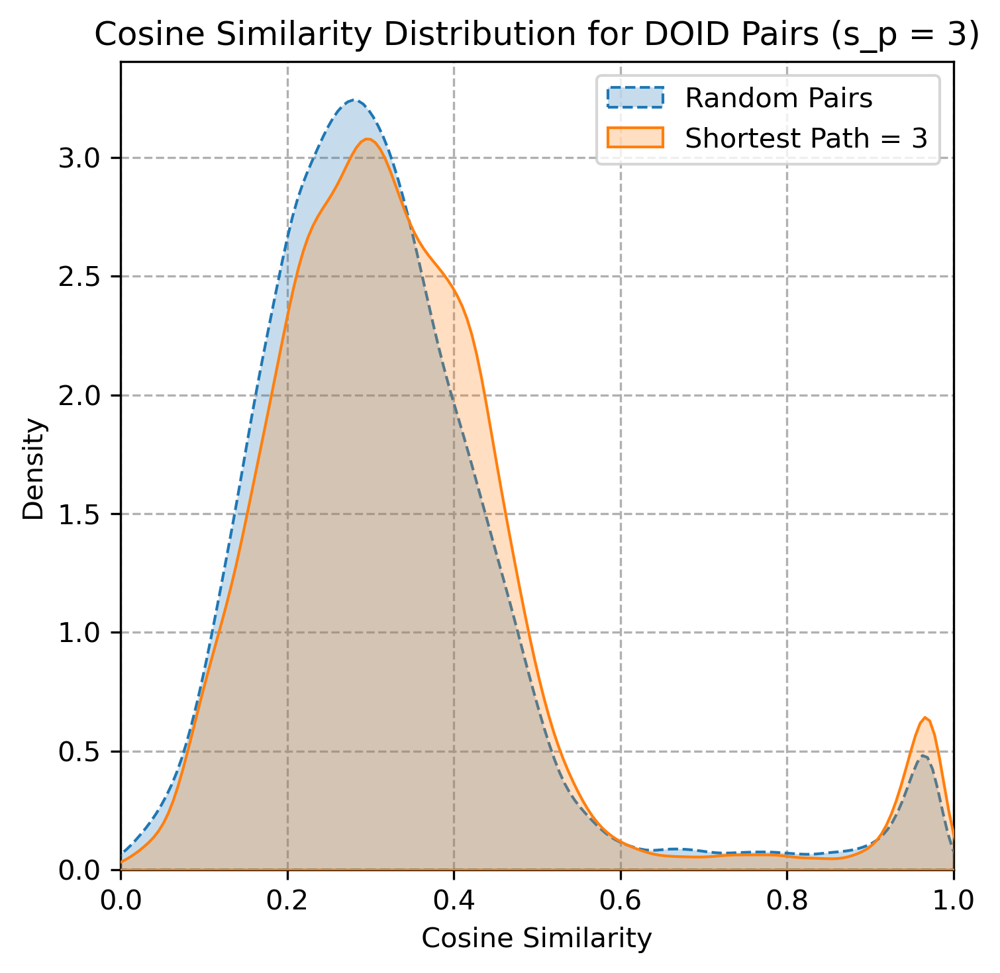

In [ ]:
plt.kde(_cosine_rand)

array([0.28321151, 0.33771284, 0.1149905 , ..., 0.33839087, 0.3725148 ,
       0.2900417 ])

In [ ]:
emb1.shape

(281674, 512)

In [ ]:

emb1 = scgpt_emb_train[_rand_idx1]
emb2 = scgpt_emb_train[_rand_idx2]


In [ ]:

pairwise_distances(emb1, emb2, metric="cosine")

MemoryError: Unable to allocate 296. GiB for an array with shape (281674, 281674) and data type float32

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
[cosine_similarity(emb1[i], emb2[i]) for i in range(1000)]

ValueError: Expected 2D array, got 1D array instead:
array=[-5.36117315e-01  1.83163673e-01 -7.67452240e-01 -1.15434253e+00
  1.64696240e+00 -1.41770196e+00  2.12332726e+00  1.45115435e+00
  6.92168593e-01  6.19922020e-02  4.60300781e-02  7.71683693e-01
 -7.76380181e-01 -2.26134155e-02  1.46478999e+00 -1.50627673e+00
 -2.27536857e-01 -4.60907727e-01  1.18202841e+00  1.14245690e-01
  2.14282081e-01 -1.53947428e-01  8.18866551e-01  6.38992906e-01
  5.59179246e-01 -7.24799111e-02  1.24259627e+00  2.65743911e-01
  9.40038323e-01  2.98811495e-01 -1.39203250e+00  5.59309125e-01
  8.11412632e-01 -6.14345789e-01  1.48525703e+00  3.29280227e-01
 -6.81995094e-01  1.17691374e+00  1.09152853e+00 -4.55690891e-01
 -1.22371387e+00 -1.07348286e-01 -1.70058346e+00 -2.12780610e-01
 -1.73894972e-01  8.21500897e-01 -1.40749764e+00 -1.64678788e+00
  8.86509955e-01 -2.12612247e+00  6.80173397e-01 -1.19117931e-01
 -2.43178651e-01  1.79450020e-01  6.21613264e-01 -1.00933433e+00
 -3.33960384e-01 -1.90982997e-01 -2.71537805e+00 -1.54918343e-01
  4.43157017e-01 -1.52064335e+00 -6.83178604e-01 -1.51969790e+00
 -1.02001905e+00 -1.13514352e+00  1.77947021e+00  2.31227577e-01
 -1.28224635e+00 -2.53696829e-01  9.61471617e-01 -8.62409353e-01
 -2.45755479e-01 -1.19594872e+00  8.51378679e-01 -6.33190691e-01
  8.00605357e-01  1.34219393e-01 -7.74858892e-01  4.12645906e-01
 -4.03598696e-01 -1.18963897e+00  3.53207588e-01 -1.11739337e+00
 -5.25959373e-01  3.75688970e-01  4.52313900e-01 -1.30124956e-01
  1.39679742e+00 -9.58144486e-01  7.94430494e-01 -3.57072614e-02
 -8.39308091e-03  6.07917786e-01 -7.06179738e-01  1.24872947e+00
 -2.10379474e-02  1.38116825e+00  2.17666960e+00  8.06552112e-01
  1.40454805e+00 -2.16320419e+00 -4.53043401e-01  1.63833261e+00
 -5.73533416e-01  1.72477171e-01 -1.98476925e-01  2.32398525e-01
  8.27064574e-01 -3.29887241e-01 -8.31610382e-01 -1.99106514e-01
  5.82965851e-01 -2.39015967e-01  1.19914651e+00 -1.48077905e-01
 -1.01371431e+00  4.12525535e-01  4.93668467e-01 -9.63532448e-01
 -9.49348986e-01 -7.35742748e-01 -8.91572416e-01  5.17450929e-01
 -8.20597768e-01  1.98759317e-01  8.88107955e-01  6.11875430e-02
 -1.38931847e+00  1.34313416e+00  1.30469823e+00  5.78139313e-02
 -1.01356614e+00  3.43157232e-01 -7.34742403e-01 -1.45849836e+00
 -4.34815019e-01  9.96424913e-01  5.30046113e-02 -5.82237005e-01
  9.18451548e-01  6.21184230e-01 -8.05649579e-01 -4.22616482e-01
 -5.66599309e-01  4.14173335e-01  1.37037539e+00  1.13078102e-01
  6.90373838e-01  5.50837636e-01 -1.16095066e+00 -1.04250979e+00
 -6.69234872e-01  3.05626914e-02 -5.41830361e-01 -4.81294572e-01
 -1.19278338e-02 -5.64770842e+00  1.39400935e+00  2.18694115e+00
 -3.49521905e-01  1.21287175e-01 -4.14553255e-01  2.58775294e-01
  8.45776916e-01  2.58831441e-01 -2.53877103e-01 -5.66896081e-01
  4.98777062e-01  2.70813182e-02 -1.07022502e-01  1.98299372e+00
  7.82476306e-01  1.37014389e+00 -1.10324752e+00  3.66326094e-01
 -5.01827240e-01 -5.07047296e-01  5.57714514e-02 -8.26750278e-01
  1.91365194e+00 -1.64497519e+00 -5.00938356e-01  1.71355879e+00
 -5.92815757e-01 -9.35294569e-01  9.27129209e-01 -5.02417982e-01
 -6.12822056e-01  5.97331285e-01  1.28341839e-01 -5.36978602e-01
  1.21640038e+00 -5.88562846e-01 -1.72264719e+00  1.62582085e-01
 -9.67065096e-01 -4.95244980e-01  2.38253146e-01  3.76098603e-01
  3.14938784e-01 -4.00478654e-02  8.76396775e-01  6.43375099e-01
  1.70405567e-01  3.68305743e-01  9.50987339e-01 -4.46776032e-01
 -8.83669972e-01 -4.37447459e-01 -1.34820372e-01 -9.54906881e-01
 -4.07318830e-01  2.30998054e-01  1.83718574e+00 -2.78368592e-01
 -7.44626597e-02 -1.43044972e+00 -1.26814401e+00  1.21619904e+00
  5.20594418e-01  3.87537591e-02 -5.64760625e-01 -1.04732180e+00
 -5.55707037e-01  3.04746866e-01 -5.36071002e-01 -3.02285284e-01
  3.27429324e-01 -2.55155087e-01  1.06756769e-01 -1.58847606e+00
 -1.69227526e-01 -8.45577717e-01 -2.87783414e-01 -5.23118794e-01
  6.51521087e-01 -4.68030572e-01 -2.01021135e-03  1.11401188e+00
  1.09930539e+00  3.51568520e-01  1.93652306e-02 -1.80294335e+00
  2.46911664e-02  9.14954662e-01  6.31825924e-01 -3.05705637e-01
  3.45165431e-01  8.03244948e-01 -4.41306114e-01 -9.91223276e-01
 -1.24201226e+00 -1.00672498e-01  7.80899450e-02  4.51625764e-01
  3.62413645e-01  1.28420305e+00 -2.83883542e-01  1.74795166e-01
  4.60520554e+00  5.71956933e-01 -5.89102745e-01 -1.20108128e+00
  3.11619848e-01  1.37728512e+00 -1.74181247e+00  2.37549022e-01
 -6.32682323e-01 -1.93591058e-01 -3.93554449e-01 -2.77608991e+00
 -6.50328279e-01 -1.05557919e+00  3.89131904e-01 -2.45280194e+00
 -9.88110840e-01 -1.21021259e+00  1.76448059e+00  1.07747877e+00
 -1.11100841e+00  8.91911602e+00 -1.00043699e-01  8.09852719e-01
 -3.13431829e-01 -9.31917250e-01 -2.53160924e-01  1.13016200e+00
 -1.13570988e+00  2.23898029e+00  3.58038098e-01  5.08681297e-01
 -1.80415288e-01  1.61972535e+00 -2.44729314e-02  8.82773519e-01
  2.47709915e-01  2.13813230e-01  1.20139682e+00  6.02480650e-01
  1.90375984e+00  7.61823729e-02  2.02243423e+00 -2.66486794e-01
 -3.71449828e-01 -2.10090324e-01  8.67350638e-01 -2.08504510e+00
  8.93086731e-01 -6.82990313e-01  8.83673191e-01  7.03558400e-02
  1.19571531e+00 -2.54718876e+00  1.49610794e+00  1.10911620e+00
  4.57819737e-02  4.45989341e-01 -5.73688269e-01 -1.76984504e-01
 -2.03862771e-01  5.92706859e-01 -1.04697466e+00  9.58284199e-01
 -4.33735222e-01 -5.43130755e-01 -3.15011293e-01 -1.61040485e+00
 -1.80862308e+00 -6.30214751e-01  8.01462591e-01  4.03448641e-01
  6.61964059e-01  2.07359970e-01 -2.22875535e-01 -1.24442625e+00
  3.59089434e-01 -1.72905648e+00  6.69047087e-02  5.98995909e-02
  3.15884314e-02  2.55088538e-01  1.01878369e+00  8.80343765e-02
  5.65370381e-01  5.78022838e-01 -1.05872548e+00  7.01980770e-01
 -1.21535860e-01  5.26290357e-01 -6.18108869e-01 -2.92229980e-01
 -9.62624885e-03 -1.21338032e-01  1.27720058e-01 -3.00451815e-01
 -2.36896724e-01  5.94856143e-01  1.25236940e+00 -4.82977927e-01
 -7.88783133e-01  2.79659450e-01  5.28929889e-01 -2.75856346e-01
  5.50444543e-01  1.39717638e-01 -9.85796630e-01 -7.62455642e-01
  2.03892797e-01 -1.28255415e+00 -4.96046007e-01  1.15248702e-01
  8.39538455e-01 -1.46179805e-02 -8.23507488e-01  5.40450752e-01
  9.94758844e-01 -9.53028023e-01  3.86408329e-01  5.63738346e-01
 -1.94270477e-01 -7.10437536e-01  6.22259617e-01 -8.46950233e-01
  9.40488636e-01 -3.95756155e-01  5.27408898e-01  2.29130244e+00
  1.58938503e+00 -4.79276627e-01 -3.25852215e-01  1.41838467e+00
 -6.94243431e-01  5.06316245e-01 -6.42055050e-02 -5.07561862e-01
 -8.83888066e-01 -5.65536082e-01 -2.78909523e-02 -2.76683778e-01
 -8.84317607e-02  9.61177051e-01 -5.55315793e-01  9.67216492e-01
  2.75639147e-01 -2.67544370e-02  3.17393810e-01  3.20982002e-02
  3.87919396e-01  1.58796400e-01  8.36535573e-01 -1.20450890e+00
 -3.72657984e-01 -8.31440926e-01 -5.93035743e-02  6.40577316e-01
 -1.71297505e-01  5.09386241e-01  1.58810616e+00 -1.13583052e+00
  1.84787046e-02  9.84273374e-01 -8.63375794e-03  1.11473048e+00
  2.16249064e-01  7.56418288e-01 -1.57137081e-01  1.38993895e+00
  2.44901136e-01 -8.26467931e-01  5.18310130e-01 -2.51027852e-01
  9.43121985e-02 -1.15139015e-01  2.52166361e-01  6.60552382e-01
  7.17081651e-02 -2.91202068e-01 -8.25742185e-01  8.57595086e-01
  6.55201316e-01 -7.13850796e-01  8.25230896e-01  1.43114841e+00
 -7.54025340e-01  5.61083496e-01  5.88398099e-01 -4.77193713e-01
 -5.93660362e-02  2.51774287e+00  1.15095007e+00 -7.98228621e-01
  7.72974193e-01 -6.49075687e-01  1.54141009e+00 -7.85281286e-02
  1.53183806e+00  8.97859275e-01 -1.60867751e+00  4.07332145e-02
 -1.31947935e-01 -1.81143665e+00 -1.16318353e-02 -2.14849472e-01
 -1.77003711e-01 -4.11742359e-01  1.61853957e+00 -5.27694039e-02
 -1.02972820e-01 -6.22858584e-01  1.42585707e+00  3.02594066e-01
 -6.45437717e-01 -3.42303127e-01 -5.57458878e-01 -6.82857513e-01
  1.47949070e-01  3.43958706e-01 -7.40698278e-01  2.98214197e-01
  2.30411917e-01 -6.63334250e-01  2.22702965e-01 -9.25390944e-02
 -8.59090149e-01  3.55162472e-01 -6.67324483e-01  2.33802229e-01
 -4.23848510e-01 -1.16287148e+00 -3.57065499e-01 -1.52520284e-01
 -4.43109483e-01 -5.15835881e-01 -9.69242677e-02 -3.33119512e-01
 -9.34335053e-01  6.57846034e-01  1.71470508e-01 -8.29215050e-01
 -5.54485381e-01  4.02831435e-02 -3.09747398e-01  4.28911000e-02
 -4.94141400e-01 -3.40569764e-01  2.24202707e-01  4.15988117e-02
 -3.69540215e-01  1.37846380e-01  2.19198614e-01  5.93244255e-01].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [ ]:
scgpt_emb_train.shape

(11002, 512)

In [ ]:
pairwise_distances(emb1[:2], emb2[:2], metric="cosine")

array([[0.8628025 , 0.88471323],
       [0.7812766 , 0.6635143 ]], dtype=float32)

In [ ]:
print()

281674

[0.24272768158392877,
 0.26681294697543145,
 0.2865399520978561,
 0.2562141748976956,
 0.30395680618759324,
 0.2534613317606351,
 0.26999440347558434,
 0.4529380619856118,
 0.2893220681584392,
 0.2559018092806482,
 0.25893762655624286,
 0.30501801492785896,
 0.2950162028412098,
 0.2526114744687996,
 0.270972987554451,
 0.2813738928005889,
 0.29589077426677646,
 0.27157550301717037,
 0.25527937474592044,
 0.3644545563116499,
 0.26931549032047564,
 0.2799812566827289,
 0.2615977583332185,
 0.3000879012436921,
 0.2705607147772988,
 0.25046122235664003,
 0.2856321020636685,
 0.2898780605477145,
 0.30395064098549884,
 0.3308134849148412,
 0.2510028744421564,
 0.2597770979832241,
 0.25225094959269123,
 0.3066239611583237,
 0.33399753257224085,
 0.34339145873163834,
 0.2721785571676063,
 0.23956138963611018,
 0.2948076017829606,
 0.2760529489889194,
 0.2544358524242374,
 0.3069270454422275,
 0.24382939126868797,
 0.35039202229959154,
 0.2770561097378813,
 0.2841889328959689,
 0.15473363926661

In [ ]:
_cosine_values

[0.2636332876726913,
 0.31759693602399747,
 0.24064768923554453,
 0.3700001557517969,
 0.4701986596911767,
 0.2841127748698475,
 0.27221379057367023]

In [ ]:
n1 = 'DOID:0040085'
n2 = "DOID:11265"


if str(tuple(sorted([n1, n2]))) in df_query["pair_key_doid"].to_list():
    print("Pair exists")

"('DOID:0040085', 'DOID:11265')"

In [ ]:
df_query

,node_1,node_2,shortest_path,pair_key,node_lca,term_lca,pair_key_doid,term_1,term_2,ic_seco,ic_sanchez,ic_zhou,ic_baseline
820434,DOID:0040085,DOID:11265,3,"('DOID:104', ('DOID:0040085', 'DOID:11265'))",DOID:104,bacterial infectious disease,"('DOID:0040085', 'DOID:11265')",bacterial sepsis,trachoma,0.434360,5.443527,0.352297,156.0
821184,DOID:0040085,DOID:14115,3,"('DOID:104', ('DOID:0040085', 'DOID:14115'))",DOID:104,bacterial infectious disease,"('DOID:0040085', 'DOID:14115')",bacterial sepsis,toxic shock syndrome,0.434360,5.443527,0.352297,156.0
1376435,DOID:0050156,DOID:12132,4,"('DOID:850', ('DOID:0050156', 'DOID:12132'))",DOID:850,lung disease,"('DOID:0050156', 'DOID:12132')",idiopathic pulmonary fibrosis,granulomatosis with polyangiitis,0.453338,6.023651,0.496905,131.0
1377179,DOID:0050156,DOID:1578,4,"('DOID:850', ('DOID:0050156', 'DOID:1578'))",DOID:850,lung disease,"('DOID:0050156', 'DOID:1578')",idiopathic pulmonary fibrosis,pulmonary systemic sclerosis,0.453338,6.023651,0.496905,131.0
1379716,DOID:0050156,DOID:9261,6,"('DOID:1579', ('DOID:0050156', 'DOID:9261'))",DOID:1579,respiratory system disease,"('DOID:0050156', 'DOID:9261')",idiopathic pulmonary fibrosis,nasopharynx carcinoma,0.363181,4.855028,0.316707,281.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
47816897,DOID:676,DOID:9074,4,"('DOID:0060032', ('DOID:676', 'DOID:9074'))",DOID:0060032,autoimmune disease of musculoskeletal system,"('DOID:676', 'DOID:9074')",juvenile rheumatoid arthritis,systemic lupus erythematosus,0.569031,7.357889,0.498672,46.0
47816913,DOID:676,DOID:9146,5,"('DOID:0080001', ('DOID:676', 'DOID:9146'))",DOID:0080001,bone disease,"('DOID:676', 'DOID:9146')",juvenile rheumatoid arthritis,visceral leishmaniasis,0.325414,4.828110,0.432942,433.0
48000188,DOID:7442,DOID:9513,9,"('DOID:74', ('DOID:7442', 'DOID:9513'))",DOID:74,hematopoietic system disease,"('DOID:7442', 'DOID:9513')",monoclonal gammopathy of uncertain significance,plasma cell leukemia,0.335501,4.550584,0.302866,381.0
48173226,DOID:8398,DOID:9146,4,"('DOID:0080001', ('DOID:8398', 'DOID:9146'))",DOID:0080001,bone disease,"('DOID:8398', 'DOID:9146')",osteoarthritis,visceral leishmaniasis,0.325414,4.828110,0.432942,433.0


In [ ]:
_cosine_sim

0.27221379057367023

In [ ]:
_emb1.shape

(56, 1, 512)

In [ ]:
np.argwhere([adata_train.obs["do_id"] == _n1])

array([[    0,   238],
       [    0,   328],
       [    0,   371],
       [    0,   401],
       [    0,   481],
       [    0,   887],
       [    0,   951],
       [    0,  1108],
       [    0,  1230],
       [    0,  1653],
       [    0,  1828],
       [    0,  2341],
       [    0,  2483],
       [    0,  2751],
       [    0,  3148],
       [    0,  3208],
       [    0,  3365],
       [    0,  3777],
       [    0,  3996],
       [    0,  4136],
       [    0,  4422],
       [    0,  4502],
       [    0,  4662],
       [    0,  4694],
       [    0,  4766],
       [    0,  5051],
       [    0,  5149],
       [    0,  5164],
       [    0,  5813],
       [    0,  5858],
       [    0,  5883],
       [    0,  6127],
       [    0,  6307],
       [    0,  6332],
       [    0,  6625],
       [    0,  6710],
       [    0,  6742],
       [    0,  6782],
       [    0,  7202],
       [    0,  7251],
       [    0,  7253],
       [    0,  7291],
       [    0,  7311],
       [   

array([False, False, False, ..., False, False, False])

In [ ]:
scgpt_emb_train[]


SyntaxError: invalid syntax (1128568434.py, line 1)

In [ ]:
_idx1

['10099',
 '10136',
 '10143',
 '10102',
 '10159',
 '10109',
 '10130',
 '10155',
 '10097',
 '10145',
 '10151',
 '10104',
 '10112',
 '10115',
 '10095',
 '10154',
 '10094',
 '10098',
 '10153',
 '10088',
 '10096',
 '10090',
 '10110',
 '10133',
 '10108',
 '10138',
 '10091',
 '8912',
 '12694',
 '10134',
 '10158',
 '10146',
 '10150',
 '10089',
 '12695',
 '10092',
 '10129',
 '10085',
 '10152',
 '10144',
 '10106',
 '10107',
 '10111',
 '10113',
 '10141',
 '10135',
 '12696',
 '10157',
 '8911',
 '10114',
 '10147',
 '10132',
 '10087',
 '10100',
 '10156',
 '10140']

In [ ]:
_idx1

['10099',
 '10136',
 '10143',
 '10102',
 '10159',
 '10109',
 '10130',
 '10155',
 '10097',
 '10145',
 '10151',
 '10104',
 '10112',
 '10115',
 '10095',
 '10154',
 '10094',
 '10098',
 '10153',
 '10088',
 '10096',
 '10090',
 '10110',
 '10133',
 '10108',
 '10138',
 '10091',
 '8912',
 '12694',
 '10134',
 '10158',
 '10146',
 '10150',
 '10089',
 '12695',
 '10092',
 '10129',
 '10085',
 '10152',
 '10144',
 '10106',
 '10107',
 '10111',
 '10113',
 '10141',
 '10135',
 '12696',
 '10157',
 '8911',
 '10114',
 '10147',
 '10132',
 '10087',
 '10100',
 '10156',
 '10140']

In [ ]:
# Calculate the bottom n% threshold for each method
thresholds = [np.percentile(method_ics, pct) for method_ics in all_ics[:3]]
thresholds.append(np.percentile(all_ics[3], int(100-pct)))


In [ ]:
c_matrix_train = np.load(os.path.join(output_dir, "c_matrix_train_parallel.npy"))

In [ ]:
c_matrix_train

array([1.    , 0.905 , 0.9106, ..., 0.3247, 0.2544, 0.2074], dtype=float16)

In [ ]:
scgpt_emb_train.shape

(57407, 512)

In [ ]:
def get_grouped_ps(matrix: np.array, idxs: np.array, labels: List) -> Dict:
    """Get Grouped Pairwise Similarities
    Args:
        matrix (np.array): Pairwise similarity matrix
        idxs (List): List of indexes
        labels (List): List of labels
    Returns:
        grouped_ps (Dict): Dictionary with grouped pairwise similarities
    """
    grouped_ps = dict()
    label_idxs = list(range(len(labels)))
    for i, idx_i in enumerate(label_idxs):
        for idx_j in label_idxs[i:]:
            label_i = labels[idx_i]
            label_j = labels[idx_j]

            if idx_i == idx_j:
                grouped_ps[f"{label_i}-{label_j}"] = get_pairwise_similarities(
                    matrix, idxs[idx_i]
                )
            else:
                grouped_ps[f"{label_i}-{label_j}"] = get_pairwise_similarities(
                    matrix, idxs[idx_i], idxs[idx_j]
                )
    return grouped_ps

In [ ]:
metric_params = {
    "Cosine Similarity": (-1, 1),
    "Euclidean Distance": (None, None),  # Empty tuple if you don't want to set bounds
    "Pearson Correlation": (-1, 1),
}


# for data_type in ["train", "test"]:
for data_type in ["train"]:

    if data_type == "train":
        adata = adata_train
        c_matrix = c_matrix_train
        # e_matrix = e_matrix_train
        # p_matrix = p_matrix_train
    else:
        adata = adata_test
        c_matrix = c_matrix_test
        # e_matrix = e_matrix_test
        # p_matrix = p_matrix_test

    # Compute pairwise similarities for each disease
    for disease_it in adata.obs["disease_study"].unique()[:10]:

        # get disease & control indexes
        disease_idxs = list()
        control_idxs = list()
        other_disease_idxs = list()
        for i, (disease, disease_study) in enumerate(
            zip(adata.obs["disease"].to_list(), adata.obs["disease_study"].to_list())
        ):
            if (disease == disease_it) & (disease_study == disease_it):
                disease_idxs.append(i)
            elif (disease == "Control") & (disease_study == disease_it):
                control_idxs.append(i)
            elif disease != disease_study:
                other_disease_idxs.append(i)

        print(f"Control: {len(control_idxs)}")
        print(f"Disease: {len(disease_idxs)}")
        n_samples = len(disease_idxs)
        # Plot Metrics
        for metric, matrix in zip(
            [
                "Cosine Similarity",
            ],
            [c_matrix],
        ):

            d_ps = get_grouped_ps(
                matrix,
                [disease_idxs, control_idxs, other_disease_idxs],
                ["Disease", "Control", "Other Disease"],
            )

            d_data = {k: v for k, v in d_ps.items() if k.startswith("Disease-")}

            plt.figure(figsize=(4, 4))

            sns.kdeplot(
                d_data["Disease-Other Disease"],
                label="Disease-Other Disease",
                fill=True,
                alpha=0.8,
            )
            sns.kdeplot(
                d_data["Disease-Control"], label="Disease-Control", fill=True, alpha=0.5
            )
            sns.kdeplot(
                d_data["Disease-Disease"], label="Disease-Disease", fill=True, alpha=0.3
            )
            plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
            plt.title(f"{metric}\n{disease_it} {data_type} - ({n_samples})")
            plt.xlim(metric_params[metric])

            plt.show()

            # only one metric

Control: 67
Disease: 81
Control: 94
Disease: 97


In [ ]:
adata_train

NameError: name 'adata_train' is not defined

In [ ]:
adata_train.obs["disease_study"].unique()[:10]

['Myotonic Dystrophy Type 1', 'Diabetic Kidney Disease', 'Amyotrophic Lateral Sclerosis', 'Liver Cancer', 'Lung Adenocarcinoma', 'Cardiomyopathy', 'Leukemia', 'Colorectal Carcinoma', 'Type 1 Diabetes', 'Type 2 Diabetes']
Categories (85, object): ['Acute Kidney Injury', 'Acute Myeloid Leukemia', 'Acute Myeloid Leukemia (Aml-M2)', 'Alcohol Use Disorder', ..., 'Tuberculosis', 'Type 1 Diabetes', 'Type 2 Diabetes', 'Ulcerative Colitis']

In [ ]:
"""Compute distances for same disease tree?
    - Same disease
    - Control
    - Related disease
    - Unrelated disease
"""

array([[1.        , 0.99324301, 0.92164718, ..., 0.40070425, 0.38942855,
        0.42814108],
       [0.99324301, 1.        , 0.90260425, ..., 0.39190649, 0.38516918,
        0.42177076],
       [0.92164718, 0.90260425, 1.        , ..., 0.38478073, 0.37238066,
        0.41848797],
       ...,
       [0.40070425, 0.39190649, 0.38478073, ..., 1.        , 0.96743285,
        0.94200175],
       [0.38942855, 0.38516918, 0.37238066, ..., 0.96743285, 1.        ,
        0.9596637 ],
       [0.42814108, 0.42177076, 0.41848797, ..., 0.94200175, 0.9596637 ,
        1.        ]])

## Plot Different Latent Spaces

In [ ]:
# compute cosine similarity matrix, pdist and cdist
from scipy.spatial.distance import cosine
from scipy.spatial.distance import pdist, cdist

# cosine similarity matrix
c_matrix_scgpt_test = 1 - cdist(
    scgpt_emb_test, scgpt_emb_test, "cosine"
)  # 1 - cosine distance

raw_expr_patched = 
c_matrix_raw_test = 1 - cdist(
    np.nan_to_num(adata_test.X, nan=0), np.nan_to_num(adata_test.X, nan=0), "cosine"
)  # 1 - cosine distance

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
import random

# Example data (replace with your actual data)
labels = adata_test.obs["disease"].to_list()
matrix_A = c_matrix_scgpt_test
matrix_B = c_matrix_raw_test


def get_pair_idxs(labels, same=True):
    n_labels = len(labels)
    output_idxs = list()
    output_labels = list()
    if same:
        for i in range(n_labels):
            for j in range(i + 1, n_labels):
                if labels[i] == labels[j]:
                    output_idxs.append([i, j])
                    output_labels.append(labels[i] + "-" + labels[j])
    else:
        for i in range(n_labels):
            for j in range(i + 1, n_labels):
                if labels[i] != labels[j]:
                    output_idxs.append([i, j])
                    output_labels.append(labels[i] + "-" + labels[j])

    output_idxs = np.array(output_idxs)
    output_labels = np.array(output_labels)

    return output_idxs, output_labels


same_idxs, same_labels = get_pair_idxs(labels, same=True)
diff_idxs, random_labels = get_pair_idxs(labels, same=False)

data_same_A = matrix_A[same_idxs[:, 0], same_idxs[:, 1]]
data_same_B = matrix_B[same_idxs[:, 0], same_idxs[:, 1]]

colormap = plt.cm.get_cmap(
    "gist_rainbow", len(set(same_labels))
)  # You can change "tab20" to any other colormap

/tmp/ipykernel_7441/3966013533.py:41: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colormap = plt.cm.get_cmap(


/tmp/ipykernel_7441/850300922.py:53: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y, ax=y_kde_ax, color="green", vertical=True, fill=True)


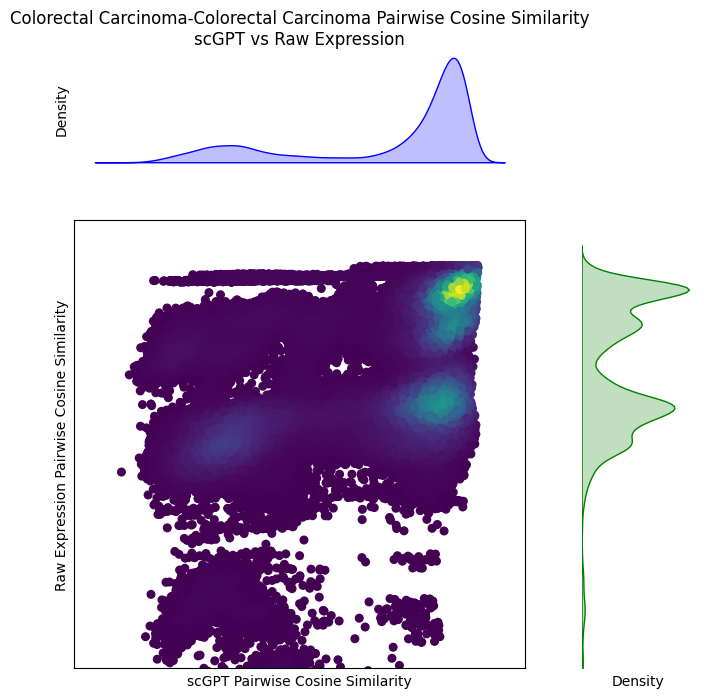

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde
import random

plt.figure(figsize=(8, 8))

# Define a grid for the plot layout
grid = plt.GridSpec(4, 4, hspace=0.5, wspace=0.5)

# Scatter plot will go in the main panel (bottom-right)
main_ax = plt.subplot(grid[1:, :-1])

# KDE plots for Matrix A on top (x-axis KDE)
x_kde_ax = plt.subplot(grid[0, :-1], sharex=main_ax)

# KDE plots for Matrix B on the right (y-axis KDE)
y_kde_ax = plt.subplot(grid[1:, -1], sharey=main_ax)

# Plot the same-label data points with different colors
for i, label in enumerate(set(same_labels)):
    label == "Breast Cancer-Breast"

    data_idxs = same_labels == label

    x = data_same_A[data_idxs]
    y = data_same_B[data_idxs]

    # Combine all points into a 2D array for density estimation
    xy = np.vstack([x, y])
    density = gaussian_kde(xy)(xy)

    # Normalize density values to [0, 1] for coloring
    density_norm = (density - density.min()) / (density.max() - density.min())

    # Define a colormap for the scatter plot
    colormap = plt.cm.viridis

    # Scatter plot in the main axis
    main_ax.scatter(
        data_same_A[data_idxs],
        data_same_B[data_idxs],
        label=label,
        c=density_norm,  # Color by normalized density
        cmap=colormap,
        marker="o",
        s=30,
    )

    # Plot the KDE for Matrix A (x-axis) on the top subplot
    sns.kdeplot(x, ax=x_kde_ax, color="blue", fill=True)

    # Plot the KDE for Matrix B (y-axis) on the right subplot
    sns.kdeplot(y, ax=y_kde_ax, color="green", vertical=True, fill=True)

    # Remove ticks and boxes from the KDE plots
    x_kde_ax.set_xticks([])
    x_kde_ax.set_yticks([])
    x_kde_ax.spines["top"].set_visible(False)
    x_kde_ax.spines["right"].set_visible(False)
    x_kde_ax.spines["left"].set_visible(False)
    x_kde_ax.spines["bottom"].set_visible(False)
    x_kde_ax.set_ylim(
        -0.1,
    )
    x_kde_ax.set_title(f"{label} Pairwise Cosine Similarity\nscGPT vs Raw Expression")

    y_kde_ax.set_xticks([])
    y_kde_ax.set_yticks([])
    y_kde_ax.spines["top"].set_visible(False)
    y_kde_ax.spines["right"].set_visible(False)
    y_kde_ax.spines["left"].set_visible(False)
    y_kde_ax.spines["bottom"].set_visible(False)
    y_kde_ax.set_ylim(
        -0.1,
    )

    # Final plot settings
    main_ax.set_xlabel("scGPT Pairwise Cosine Similarity")
    main_ax.set_ylabel("Raw Expression Pairwise Cosine Similarity")

    break  # Assuming you want to do this for one label only, hence the break.

plt.show()

/tmp/ipykernel_7441/2745416307.py:56: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)


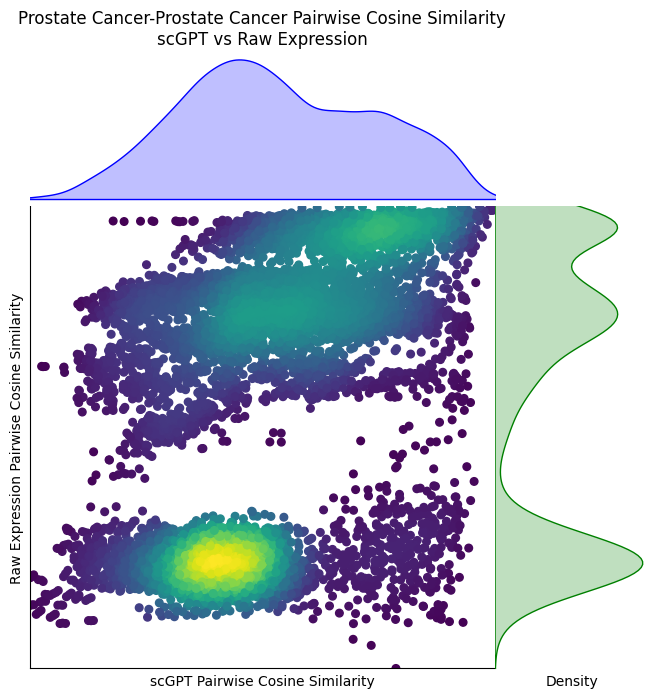

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde
import random

plt.figure(figsize=(8, 8))

# Define a grid for the plot layout
grid = plt.GridSpec(
    4, 4, hspace=0, wspace=0
)  # Set hspace and wspace to 0 for seamless plots

# Scatter plot will go in the main panel (bottom-right)
main_ax = plt.subplot(grid[1:, :-1])

# KDE plots for Matrix A on top (x-axis KDE)
x_kde_ax = plt.subplot(grid[0, :-1], sharex=main_ax)

# KDE plots for Matrix B on the right (y-axis KDE)
y_kde_ax = plt.subplot(grid[1:, -1], sharey=main_ax)

# Plot the same-label data points with different colors
for i, label in enumerate(set(same_labels)):
    label = "Prostate Cancer-Prostate Cancer"

    data_idxs = same_labels == label

    x = data_same_A[data_idxs]
    y = data_same_B[data_idxs]

    # Combine all points into a 2D array for density estimation
    xy = np.vstack([x, y])
    density = gaussian_kde(xy)(xy)

    # Normalize density values to [0, 1] for coloring
    density_norm = (density - density.min()) / (density.max() - density.min())

    # Define a colormap for the scatter plot
    colormap = plt.cm.viridis

    # Scatter plot in the main axis
    main_ax.scatter(
        data_same_A[data_idxs],
        data_same_B[data_idxs],
        c=density_norm,  # Color by normalized density
        cmap=colormap,
        marker="o",
        s=30,
    )

    # Plot the KDE for Matrix A (x-axis) on the top subplot
    sns.kdeplot(x, ax=x_kde_ax, color="blue", fill=True)

    # Plot the KDE for Matrix B (y-axis) on the right subplot
    sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)

    # Remove ticks and boxes from the KDE plots
    x_kde_ax.set_xticks([])
    x_kde_ax.set_yticks([])
    x_kde_ax.spines["top"].set_visible(False)
    x_kde_ax.spines["right"].set_visible(False)
    x_kde_ax.spines["left"].set_visible(False)
    x_kde_ax.spines["bottom"].set_visible(False)
    x_kde_ax.set_ylim(
        -0.1,
    )
    x_kde_ax.set_ylabel("")
    x_kde_ax.set_title(f"{label} Pairwise Cosine Similarity\nscGPT vs Raw Expression")

    y_kde_ax.set_xticks([])
    y_kde_ax.set_yticks([])
    y_kde_ax.spines["top"].set_visible(False)
    y_kde_ax.spines["right"].set_visible(False)
    y_kde_ax.spines["left"].set_visible(False)
    y_kde_ax.spines["bottom"].set_visible(False)
    y_kde_ax.set_ylabel("")
    y_kde_ax.set_ylim(
        -0.1,
    )

    # Remove ticks from the main scatter plot
    main_ax.tick_params(left=True, bottom=True)

    main_ax.set_xlabel("scGPT Pairwise Cosine Similarity")
    main_ax.set_ylabel("Raw Expression Pairwise Cosine Similarity")
    main_ax.set_ylim(min(y), max(y))
    main_ax.set_xlim(min(x), max(x))
    main_ax.spines["top"].set_visible(False)
    main_ax.spines["right"].set_visible(False)

    plt.show()
    break  # Assuming you want to do this for one label only, hence the break.

/tmp/ipykernel_7441/1223837045.py:55: UserWarning: 

The `vertical` parameter is deprecated; assigning data to `y`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)


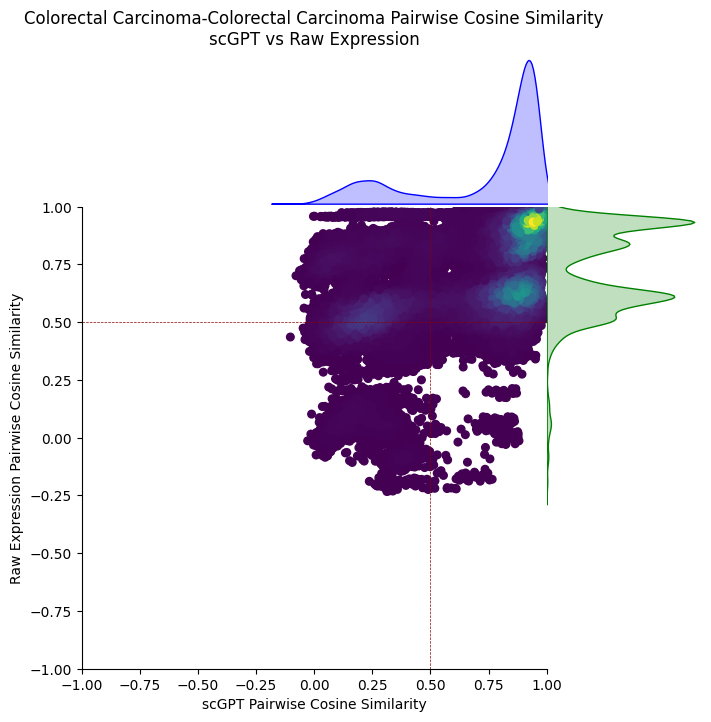

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde

plt.figure(figsize=(8, 8))

# Define a grid for the plot layout
grid = plt.GridSpec(
    4, 4, hspace=0, wspace=0
)  # Set hspace and wspace to 0 for seamless plots

# Scatter plot will go in the main panel (bottom-right)
main_ax = plt.subplot(grid[1:, :-1])

# KDE plots for Matrix A on top (x-axis KDE)
x_kde_ax = plt.subplot(grid[0, :-1], sharex=main_ax)

# KDE plots for Matrix B on the right (y-axis KDE)
y_kde_ax = plt.subplot(grid[1:, -1], sharey=main_ax)

# Plot the same-label data points with different colors
for i, label in enumerate(set(same_labels)):
    label = "Colorectal Carcinoma-Colorectal Carcinoma"

    data_idxs = same_labels == label

    x = data_same_A[data_idxs]
    y = data_same_B[data_idxs]

    # Combine all points into a 2D array for density estimation
    xy = np.vstack([x, y])
    density = gaussian_kde(xy)(xy)

    # Normalize density values to [0, 1] for coloring
    density_norm = (density - density.min()) / (density.max() - density.min())

    # Define a colormap for the scatter plot
    colormap = plt.cm.viridis

    # Scatter plot in the main axis
    main_ax.scatter(
        data_same_A[data_idxs],
        data_same_B[data_idxs],
        c=density_norm,  # Color by normalized density
        cmap=colormap,
        marker="o",
        s=30,
    )

    # Plot the KDE for Matrix A (x-axis) on the top subplot
    sns.kdeplot(x, ax=x_kde_ax, color="blue", fill=True)

    # Plot the KDE for Matrix B (y-axis) on the right subplot
    sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)

    # Remove ticks and boxes from the KDE plots
    # x_kde_ax.set_xticks([])
    x_kde_ax.set_yticks([])
    x_kde_ax.spines["top"].set_visible(False)
    x_kde_ax.spines["right"].set_visible(False)
    x_kde_ax.spines["left"].set_visible(False)
    x_kde_ax.spines["bottom"].set_visible(False)
    x_kde_ax.set_ylim(-0.1)
    x_kde_ax.set_ylabel("")
    x_kde_ax.set_title(f"{label} Pairwise Cosine Similarity\nscGPT vs Raw Expression")

    y_kde_ax.set_xticks([])
    # y_kde_ax.set_yticks([])
    y_kde_ax.spines["top"].set_visible(False)
    y_kde_ax.spines["right"].set_visible(False)
    y_kde_ax.spines["left"].set_visible(False)
    y_kde_ax.spines["bottom"].set_visible(False)
    y_kde_ax.set_xlabel("")
    y_kde_ax.set_ylim(-0.1)

    # Re-enable ticks on the main scatter plot

    main_ax.set_xlabel("scGPT Pairwise Cosine Similarity")
    main_ax.set_ylabel("Raw Expression Pairwise Cosine Similarity")
    # main_ax.set_ylim(min(min(y), min(x)), max(max(y), max(x)))
    # main_ax.set_xlim(min(min(y), min(x)), max(max(y), max(x)))
    main_ax.spines["top"].set_visible(False)
    main_ax.spines["right"].set_visible(False)
    main_ax.set_ylim(-1, 1)
    main_ax.set_xlim(-1, 1)
    main_ax.tick_params(left=True, bottom=True)
    main_ax.hlines(0.5, -1, 1, color="darkred", linestyle="--", linewidth=0.5)
    main_ax.vlines(0.5, -1, 1, color="darkred", linestyle="--", linewidth=0.5)

    plt.setp(x_kde_ax.get_xticklabels(), visible=False)
    plt.setp(y_kde_ax.get_yticklabels(), visible=False)

    x_kde_ax.tick_params(axis="x", which="both", length=0)  # Removes the tick lines
    y_kde_ax.tick_params(axis="y", which="both", length=0)  # Removes the tick lines

    plt.show()
    break  # Assuming you want to do this for one label only, hence the break.

In [ ]:
set(same_labels)

{'Breast Cancer-Breast Cancer',
 'Colorectal Carcinoma-Colorectal Carcinoma',
 'Control-Control',
 "Crohn's Disease-Crohn's Disease",
 'Hepatocellular Carcinoma-Hepatocellular Carcinoma',
 'Multiple Sclerosis-Multiple Sclerosis',
 'Prostate Cancer-Prostate Cancer'}

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import gaussian_kde

plt.figure(figsize=(8, 8))

# Define a grid for the plot layout
grid = plt.GridSpec(
    4, 4, hspace=0, wspace=0
)  # Set hspace and wspace to 0 for seamless plots

# Scatter plot will go in the main panel (bottom-right)
main_ax = plt.subplot(grid[1:, :-1])

# KDE plots for Matrix A on top (x-axis KDE)
x_kde_ax = plt.subplot(grid[0, :-1], sharex=main_ax)

# KDE plots for Matrix B on the right (y-axis KDE)
y_kde_ax = plt.subplot(grid[1:, -1], sharey=main_ax)

# Plot the same-label data points with different colors
for i, label in enumerate(set(same_labels)):
    label = "Prostate Cancer-Prostate Cancer"

    data_idxs = same_labels == label

    x = data_same_A[data_idxs]
    y = data_same_B[data_idxs]

    # Combine all points into a 2D array for density estimation
    xy = np.vstack([x, y])
    density = gaussian_kde(xy)(xy)

    # Normalize density values to [0, 1] for coloring
    density_norm = (density - density.min()) / (density.max() - density.min())

    # Define a colormap for the scatter plot
    colormap = plt.cm.viridis

    # Scatter plot in the main axis
    main_ax.scatter(
        data_same_A[data_idxs],
        data_same_B[data_idxs],
        c=density_norm,  # Color by normalized density
        cmap=colormap,
        marker="o",
        s=30,
    )

    # Plot the KDE for Matrix A (x-axis) on the top subplot
    sns.kdeplot(x, ax=x_kde_ax, color="blue", fill=True)

    # Plot the KDE for Matrix B (y-axis) on the right subplot
    sns.kdeplot(y, ax=y_kde_ax, color="green", fill=True, vertical=True)

    # Remove ticks and boxes from the KDE plots
    x_kde_ax.set_xticks([])
    x_kde_ax.set_yticks([])
    x_kde_ax.spines["top"].set_visible(False)
    x_kde_ax.spines["right"].set_visible(False)
    x_kde_ax.spines["left"].set_visible(False)
    x_kde_ax.spines["bottom"].set_visible(False)
    x_kde_ax.set_ylim(-0.1)
    x_kde_ax.set_ylabel("")
    x_kde_ax.set_title(f"{label} Pairwise Cosine Similarity\nscGPT vs Raw Expression")

    y_kde_ax.tick_params(left=False, bottom=False, top=False, right=False)
    x_kde_ax.set_xticks([])
    x_kde_ax.set_yticks([])
    y_kde_ax.spines["top"].set_visible(False)
    y_kde_ax.spines["right"].set_visible(False)
    y_kde_ax.spines["left"].set_visible(False)
    y_kde_ax.spines["bottom"].set_visible(False)
    y_kde_ax.set_ylabel("")
    y_kde_ax.set_ylim(-0.1)

    # Re-enable ticks on the main scatter plot

    main_ax.set_xlabel("scGPT Pairwise Cosine Similarity")
    main_ax.set_ylabel("Raw Expression Pairwise Cosine Similarity")
    main_ax.set_ylim(min(y), max(y))
    main_ax.set_xlim(min(x), max(x))
    main_ax.spines["top"].set_visible(False)
    main_ax.spines["right"].set_visible(False)
    main_ax.tick_params(left=False, bottom=False, right=False, top=False)

    plt.show()
    break  # Assuming you want to do this for one label only, hence the break.

In [ ]:
from collections import Counter

Counter(same_labels)

Counter({'Control-Control': 2216565,
         "Crohn's Disease-Crohn's Disease": 377146,
         'Hepatocellular Carcinoma-Hepatocellular Carcinoma': 218130,
         'Breast Cancer-Breast Cancer': 188191,
         'Colorectal Carcinoma-Colorectal Carcinoma': 123256,
         'Multiple Sclerosis-Multiple Sclerosis': 92235,
         'Prostate Cancer-Prostate Cancer': 10585})

In [ ]:
def get_pairwise_similarities(matrix, indexes_1, indexes_2=None):

    pairs = list()
    if indexes_2 is not None:

        for i in indexes_1:
            for j in indexes_2:
                pairs.append([i, j])

        pairs = np.array(pairs)
        return matrix[pairs[:, 0], pairs[:, 1]]

    else:
        for n, i in enumerate(indexes_1):
            for j in indexes_1[n + 1 :]:
                pairs.append([i, j])

        pairs = np.array(pairs)
        return matrix[pairs[:, 0], pairs[:, 1]]


m1 = get_pairwise_similarities(cosine_matrix, disease_idxs)

In [ ]:
set(same_labels)

{'Breast Cancer-Breast Cancer',
 'Colorectal Carcinoma-Colorectal Carcinoma',
 'Control-Control',
 "Crohn's Disease-Crohn's Disease",
 'Hepatocellular Carcinoma-Hepatocellular Carcinoma',
 'Multiple Sclerosis-Multiple Sclerosis',
 'Prostate Cancer-Prostate Cancer'}

## MLP Prediction


In [ ]:
"""MLP Prediction

Structure:  
    1. Imports, Variables, Functions
    2. Define Splits
    3. Train MLP
    4. Evaluate MLP

"""

# 1. Imports, Variables, Functions
# imports
import random
import numpy as np
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
import sklearn
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score, f1_score, classification_report

# variables
data_type = "Raw Expression"

# functions

# 2. Process Data
logging.info(f"Unfiltered shape: {adata_test.X.shape}")

if data_type == "Raw Expression":
    X_train = adata_train.X
    X_test = adata_test.X

    # replace nans with 0
    X_train[np.isnan(X_train)] = 0
    X_test[np.isnan(X_test)] = 0

elif data_type == "scGPT":

    X_train = scgpt_emb_train
    X_test = scgpt_emb_test


# 3. Define Splits


# 4. Train MLP
y_train = adata_train.obs["celltype"].values


# Create and train the model
mlp = MLPClassifier(
    hidden_layer_sizes=(128, 128, 128, 128),  # Four hidden layers with varying sizes
    activation="relu",  # Activation function for the hidden layers
    solver="adam",  # Optimizer
    max_iter=500,  # Maximum number of iterations
    random_state=42,  # For reproducibility
)
mlp.fit(X_train, y_train)


# 4. Evaluate MLP
# Predict
y_pred = mlp.predict(X_test)
accuracy = accuracy_score(adata_test.obs["celltype"], y_pred)

f1_value = f1_score(adata_test.obs["celltype"], y_pred, average="weighted")


print("Predicted labels:", y_pred)
print("Accuracy:", accuracy)
print("F1 Score:", f1_value)

INFO:root:Unfiltered shape: (5323, 3500)


Predicted labels: ['Breast Cancer' 'Breast Cancer' 'Control' ... 'Colorectal Carcinoma'
 'Colorectal Carcinoma' 'Colorectal Carcinoma']
Accuracy: 0.5959045650948713
F1 Score: 0.5841850706693823


In [ ]:
X_train.shape

(10591, 3500)

                  Condition  Accuracy  Precision    Recall  F1-Score
0             Breast Cancer  0.595905   0.777070  0.794788  0.785829
1      Colorectal Carcinoma  0.595905   0.713775  0.802817  0.755682
2                   Control  0.595905   0.537843  0.698481  0.607726
3           Crohn's Disease  0.595905   0.478098  0.439586  0.458034
4  Hepatocellular Carcinoma  0.595905   0.935484  0.482602  0.636727
5        Multiple Sclerosis  0.595905   0.333333  0.139535  0.196721
6           Prostate Cancer  0.595905   0.654321  0.363014  0.466960


/tmp/ipykernel_7441/3955214210.py:54: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  sns.barplot(


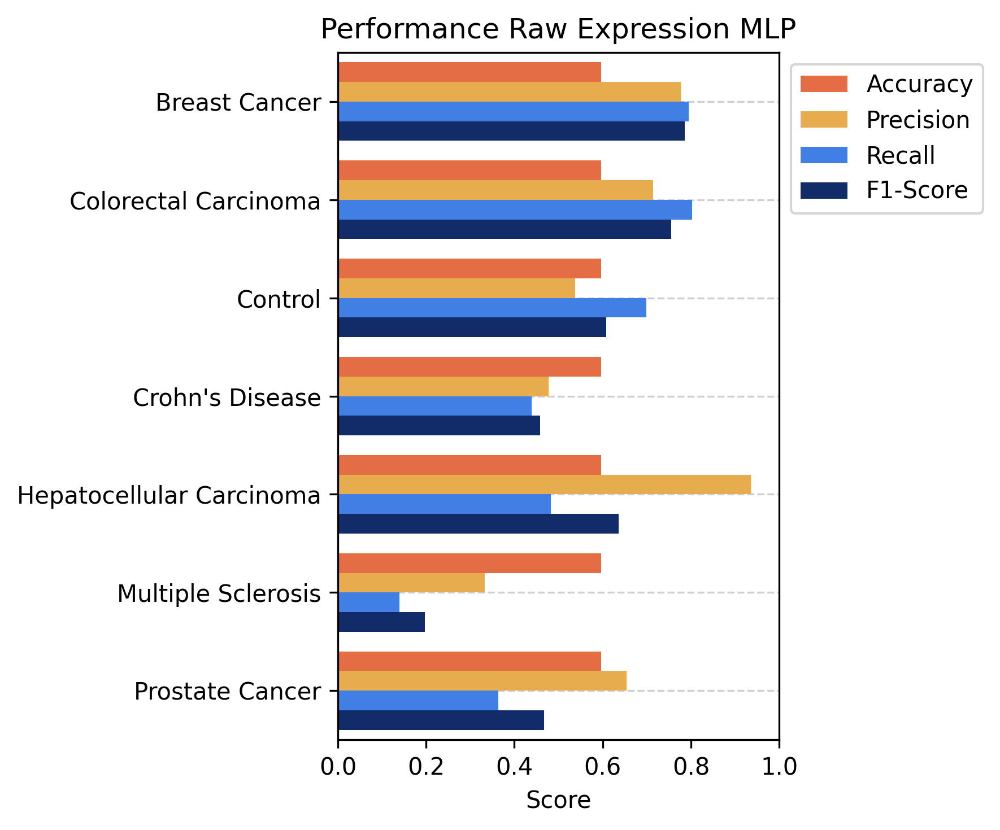

In [ ]:
import pandas as pd
from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    accuracy_score,
    balanced_accuracy_score,
)

# Assuming y_true and y_pred are already defined
y_true = adata_test.obs["celltype"]  # True labels
y_pred = y_pred  # Predicted labels

# Get the unique labels (cell types or classes)
labels = sorted(set(y_true))

palette = [
    "#ff6028",
    "#ffb234",
    "#2779ff",
    "#022778",
    "#ff958e",
]

# Initialize dictionaries to store metrics
metrics_dict = {
    "Condition": labels,
    "Accuracy": accuracy_score(y_true, y_pred),
    # "Balanced Accuracy": balanced_accuracy_score(y_true, y_pred),
    "Precision": precision_score(
        y_true, y_pred, labels=labels, average=None, zero_division=0
    ),
    "Recall": recall_score(
        y_true, y_pred, labels=labels, average=None, zero_division=0
    ),
    "F1-Score": f1_score(y_true, y_pred, labels=labels, average=None, zero_division=0),
}

# Create a DataFrame
report_df = pd.DataFrame(metrics_dict)

# Display the computed report
print(report_df)

# Plot the results using Seaborn
import seaborn as sns
import matplotlib.pyplot as plt

# Reshape DataFrame to long format for Seaborn
df_long = report_df.melt(id_vars="Condition", var_name="Metric", value_name="Score")

# Plotting
plt.figure(figsize=(6, 5), dpi=300)
sns.barplot(
    y="Condition",
    x="Score",
    hue="Metric",
    data=df_long,
    zorder=2,
    orient="h",
    palette=palette,
)

# Adjust legend location
plt.legend(loc="upper left", bbox_to_anchor=(1, 1))

# plt.xticks(rotation=90)
plt.xlim(0, 1)
plt.grid(axis="y", linestyle="--", alpha=0.6, zorder=-3)
plt.title(f"Performance {data_type} MLP")
plt.ylabel("")
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

# 4. Train KNN
y_train = adata_train.obs["celltype"].values

# Create and train the KNN model
knn = KNeighborsClassifier(n_neighbors=5)  # You can adjust the number of neighbors
knn.fit(X_train, y_train)

# 4. Evaluate KNN
# Predict
y_pred = knn.predict(X_test)
accuracy = accuracy_score(adata_test.obs["celltype"], y_pred)

f1_value = f1_score(adata_test.obs["celltype"], y_pred, average="weighted")

print("Predicted labels:", y_pred)
print("Accuracy:", accuracy)
print("F1 Score:", f1_value)

Predicted labels: ['Hepatocellular Carcinoma' 'Hepatocellular Carcinoma' 'Prostate Cancer'
 ... 'Prostate Cancer' 'Prostate Cancer' 'Prostate Cancer']
Accuracy: 0.33007702423445423
F1 Score: 0.3530034515307768


                  Condition  Accuracy  Precision    Recall  F1-Score
0             Breast Cancer  0.330077   0.290411  0.172638  0.216547
1      Colorectal Carcinoma  0.330077   0.117738  0.305835  0.170022
2                   Control  0.330077   0.519001  0.473409  0.495158
3           Crohn's Disease  0.330077   0.397363  0.242808  0.301429
4  Hepatocellular Carcinoma  0.330077   0.437500  0.201210  0.275648
5        Multiple Sclerosis  0.330077   0.455072  0.365116  0.405161
6           Prostate Cancer  0.330077   0.001767  0.006849  0.002809


/tmp/ipykernel_7441/1210530212.py:54: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  sns.barplot(


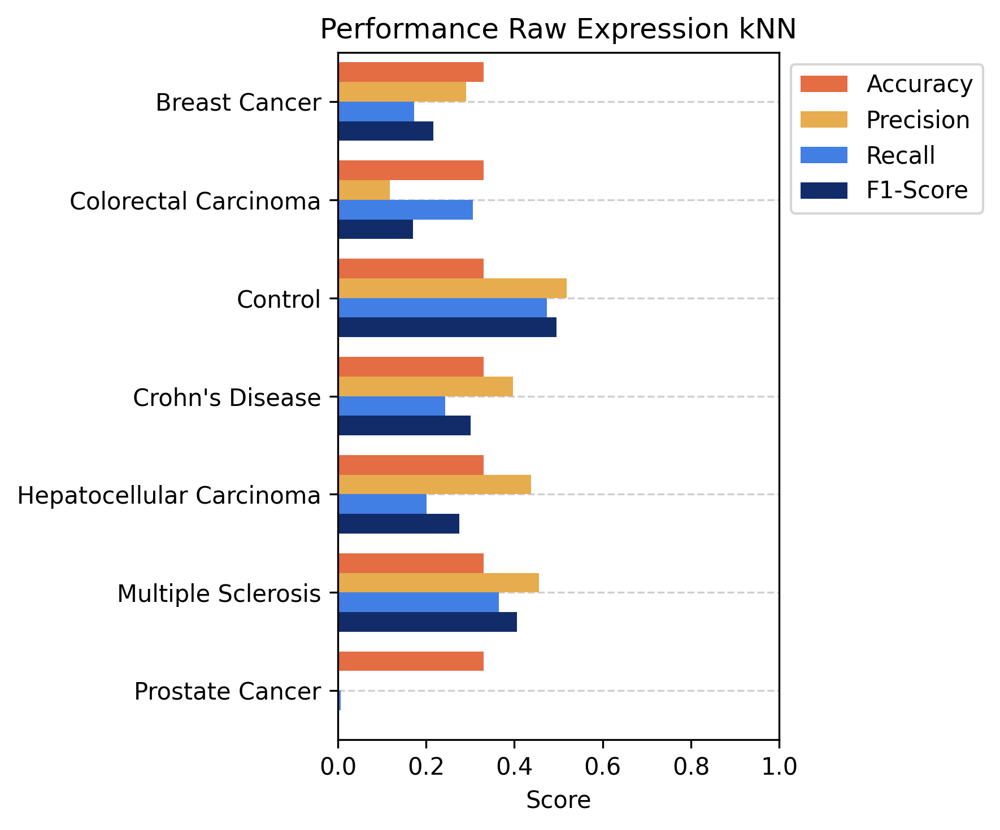

In [ ]:
import pandas as pd
from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    accuracy_score,
    balanced_accuracy_score,
)

# Assuming y_true and y_pred are already defined
y_true = adata_test.obs["celltype"]  # True labels
y_pred = y_pred  # Predicted labels

# Get the unique labels (cell types or classes)
labels = sorted(set(y_true))

palette = [
    "#ff6028",
    "#ffb234",
    "#2779ff",
    "#022778",
    "#ff958e",
]

# Initialize dictionaries to store metrics
metrics_dict = {
    "Condition": labels,
    "Accuracy": accuracy_score(y_true, y_pred),
    # "Balanced Accuracy": balanced_accuracy_score(y_true, y_pred),
    "Precision": precision_score(
        y_true, y_pred, labels=labels, average=None, zero_division=0
    ),
    "Recall": recall_score(
        y_true, y_pred, labels=labels, average=None, zero_division=0
    ),
    "F1-Score": f1_score(y_true, y_pred, labels=labels, average=None, zero_division=0),
}

# Create a DataFrame
report_df = pd.DataFrame(metrics_dict)

# Display the computed report
print(report_df)

# Plot the results using Seaborn
import seaborn as sns
import matplotlib.pyplot as plt

# Reshape DataFrame to long format for Seaborn
df_long = report_df.melt(id_vars="Condition", var_name="Metric", value_name="Score")

# Plotting
plt.figure(figsize=(6, 5), dpi=300)
sns.barplot(
    y="Condition",
    x="Score",
    hue="Metric",
    data=df_long,
    zorder=2,
    orient="h",
    palette=palette,
)

# Adjust legend location
plt.legend(loc="upper left", bbox_to_anchor=(1, 1))

# plt.xticks(rotation=90)
plt.xlim(0, 1)
plt.grid(axis="y", linestyle="--", alpha=0.6, zorder=-3)
plt.title(f"Performance {data_type} kNN")
plt.ylabel("")
plt.tight_layout()
plt.show()

"                          precision    recall  f1-score   support\n\n           Breast Cancer       0.55      0.79      0.65       614\n    Colorectal Carcinoma       0.67      0.84      0.75       497\n                 Control       0.64      0.63      0.64      2106\n         Crohn's Disease       0.51      0.40      0.45       869\nHepatocellular Carcinoma       0.74      0.84      0.79       661\n      Multiple Sclerosis       0.19      0.08      0.11       430\n         Prostate Cancer       0.42      0.42      0.42       146\n\n                accuracy                           0.61      5323\n               macro avg       0.53      0.57      0.54      5323\n            weighted avg       0.58      0.61      0.59      5323\n"

In [ ]:
report

{'Breast Cancer': {'precision': 0.552901023890785,
  'recall': 0.7915309446254072,
  'f1-score': 0.6510381781647689,
  'support': 614.0},
 'Colorectal Carcinoma': {'precision': 0.6720257234726688,
  'recall': 0.8410462776659959,
  'f1-score': 0.7470956210902592,
  'support': 497.0},
 'Control': {'precision': 0.6441658630665381,
  'recall': 0.6343779677113011,
  'f1-score': 0.6392344497607656,
  'support': 2106.0},
 "Crohn's Disease": {'precision': 0.5116959064327485,
  'recall': 0.40276179516685845,
  'f1-score': 0.4507405022537025,
  'support': 869.0},
 'Hepatocellular Carcinoma': {'precision': 0.7442799461641992,
  'recall': 0.8366111951588502,
  'f1-score': 0.7877492877492878,
  'support': 661.0},
 'Multiple Sclerosis': {'precision': 0.1907514450867052,
  'recall': 0.07674418604651163,
  'f1-score': 0.10945273631840796,
  'support': 430.0},
 'Prostate Cancer': {'precision': 0.4189189189189189,
  'recall': 0.4246575342465753,
  'f1-score': 0.4217687074829932,
  'support': 146.0},
 'a

In [ ]:
classification_report(adata_test.obs["celltype"], y_pred, output_dict=True)

{'Breast Cancer': {'precision': 0.552901023890785,
  'recall': 0.7915309446254072,
  'f1-score': 0.6510381781647689,
  'support': 614.0},
 'Colorectal Carcinoma': {'precision': 0.6720257234726688,
  'recall': 0.8410462776659959,
  'f1-score': 0.7470956210902592,
  'support': 497.0},
 'Control': {'precision': 0.6441658630665381,
  'recall': 0.6343779677113011,
  'f1-score': 0.6392344497607656,
  'support': 2106.0},
 "Crohn's Disease": {'precision': 0.5116959064327485,
  'recall': 0.40276179516685845,
  'f1-score': 0.4507405022537025,
  'support': 869.0},
 'Hepatocellular Carcinoma': {'precision': 0.7442799461641992,
  'recall': 0.8366111951588502,
  'f1-score': 0.7877492877492878,
  'support': 661.0},
 'Multiple Sclerosis': {'precision': 0.1907514450867052,
  'recall': 0.07674418604651163,
  'f1-score': 0.10945273631840796,
  'support': 430.0},
 'Prostate Cancer': {'precision': 0.4189189189189189,
  'recall': 0.4246575342465753,
  'f1-score': 0.4217687074829932,
  'support': 146.0},
 'a

In [ ]:
report_df

,precision,recall,f1-score
Breast Cancer,0.552901,0.791531,0.651038
Colorectal Carcinoma,0.672026,0.841046,0.747096
Control,0.644166,0.634378,0.639234
Crohn's Disease,0.511696,0.402762,0.450741
Hepatocellular Carcinoma,0.744280,0.836611,0.787749
Multiple Sclerosis,0.190751,0.076744,0.109453
Prostate Cancer,0.418919,0.424658,0.421769
accuracy,0.608304,0.608304,0.608304


In [ ]:
report_df

,precision,recall,f1-score
Breast Cancer,0.552901,0.791531,0.651038
Colorectal Carcinoma,0.672026,0.841046,0.747096
Control,0.644166,0.634378,0.639234
Crohn's Disease,0.511696,0.402762,0.450741
Hepatocellular Carcinoma,0.744280,0.836611,0.787749
Multiple Sclerosis,0.190751,0.076744,0.109453
Prostate Cancer,0.418919,0.424658,0.421769
accuracy,0.608304,0.608304,0.608304


In [ ]:
"""MLP Prediction

Structure:  
    1. Imports, Variables, Functions
    2. Define Splits
    3. Train MLP
    4. Evaluate MLP

"""

# 1. Imports, Variables, Functions
# imports
import random
import numpy as np
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, f1_score, classification_report

# variables


# functions

# 2. Process Data
logging.info(f"Unfiltered shape: {adata_test.X.shape}")

# clean unknown values
# mask_unknown = [
#     False if x.split(";")[2] == "Unknown" else True
#     for x in adata_test.obs["ids"].values
# ]

X_train = scgpt_emb_train
X_test = scgpt_emb_test


# replace nans with 0
X_train[np.isnan(X_train)] = 0
X_test[np.isnan(X_test)] = 0

# 3. Define Splits

import sklearn
from sklearn.metrics import f1_score

# 4. Train MLP

y_train = adata_train.obs["celltype"].values


# Create and train the model
mlp = MLPClassifier(
    hidden_layer_sizes=(384, 256, 128, 64),  # Four hidden layers with varying sizes
    activation="relu",  # Activation function for the hidden layers
    solver="adam",  # Optimizer
    max_iter=500,  # Maximum number of iterations
    random_state=42,  # For reproducibility
)
mlp.fit(X_train, y_train)


# 4. Evaluate MLP
# Predict
y_pred = mlp.predict(X_test)
accuracy = accuracy_score(adata_test.obs["celltype"], y_pred)

f1_value = f1_score(adata_test.obs["celltype"], y_pred, average="weighted")


print("Predicted labels:", y_pred)
print("Accuracy:", accuracy)
print("F1 Score:", f1_value)

INFO:root:Unfiltered shape: (3497, 2999)


Predicted labels: ['Control' 'Control' 'Control' ... 'Ulcerative Colitis' 'Control'
 'Ulcerative Colitis']
Accuracy: 0.48212753788961965
F1 Score: 0.46451639653461646


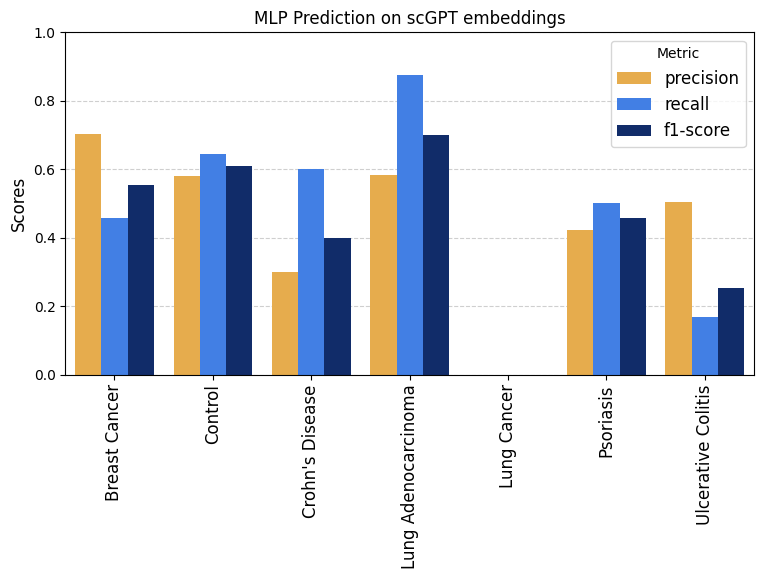

In [ ]:
import seaborn as sns

report = classification_report(adata_test.obs["celltype"], y_pred, output_dict=True)

report_df = pd.DataFrame(report).transpose()
# Drop non-label rows (accuracy, macro avg, weighted avg)
report_df.drop(index=["accuracy", "macro avg", "weighted avg"], inplace=True)
report_df.drop(columns=["support"], inplace=True)


# Creating the dataframe in a long format for seaborn
df_long = report_df.reset_index().melt(
    id_vars="index", var_name="Metric", value_name="Score"
)
df_long.columns = ["Condition", "Metric", "Score"]

custom_palette = {
    "precision": irb_colors[0],  # Blue
    "recall": irb_colors[3],  # Orange
    "f1-score": irb_colors[4],  # Green
}

# Plotting with seaborn
plt.figure(figsize=(8, 4))
sns.barplot(
    x="Condition",
    y="Score",
    hue="Metric",
    data=df_long,
    palette=custom_palette,
    zorder=2,
)

plt.grid(axis="y", linestyle="--", alpha=0.6, zorder=-3)

# Adding labels and title
plt.xlabel("")
plt.ylabel("Scores", fontsize=12)
plt.title("")

plt.legend(title="Metric", loc="upper right", fontsize=12)
plt.xticks(fontsize=12)

plt.tight_layout()
plt.ylim(0, 1)
plt.xticks(rotation=90)
plt.title("MLP Prediction on scGPT embeddings")

plt.savefig(
    os.path.join(output_dir, "mlp_report.scgpt.png"),
    dpi=300,
    bbox_inches="tight",
)

/home/ddalton/miniconda3/envs/scgpt/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/home/ddalton/miniconda3/envs/scgpt/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


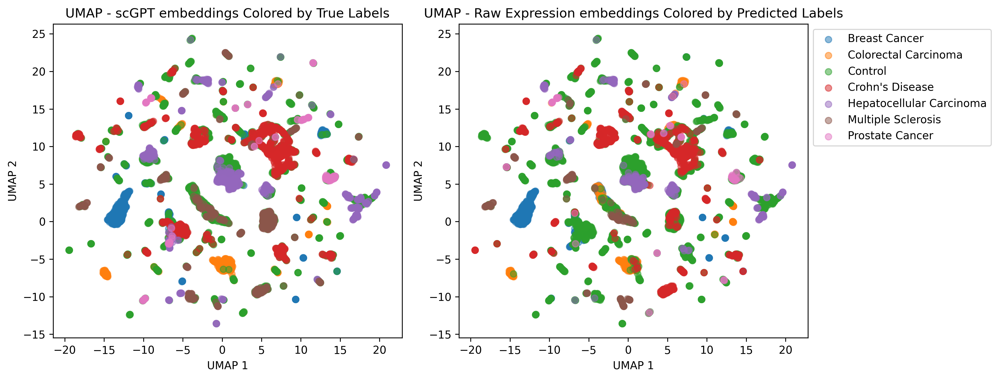

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define your labels and corresponding colors
labels = np.unique(adata_test.obs["celltype"])

# Create UMAP embeddings
reducer = umap.UMAP(n_neighbors=5, min_dist=0.3, random_state=42)
X_test_umap = reducer.fit_transform(X_test)


# color_map = {label: color for label, color in zip(labels, irb_colors)}


# Plotting the UMAP results
fig, axes = plt.subplots(1, 2, figsize=(13, 5), dpi=300)

# UMAP colored by true labels
for label in labels:
    idx = adata_test.obs["celltype"] == label
    axes[0].scatter(
        X_test_umap[idx, 0],
        X_test_umap[idx, 1],
        # c=color_map[label],
        label=label,
        s=35,
        alpha=0.5,
    )
axes[0].set_title("UMAP - scGPT embeddings Colored by True Labels")
# axes[0].legend()
axes[0].set_xlabel("UMAP 1")
axes[0].set_ylabel("UMAP 2")

# UMAP colored by predicted labels
for label in labels:
    idx = y_pred == label
    axes[1].scatter(
        X_test_umap[idx, 0],
        X_test_umap[idx, 1],
        # c=color_map[label],
        label=label,
        s=35,
        alpha=0.5,
    )
axes[1].set_title(f"UMAP - {data_type} embeddings Colored by Predicted Labels")
axes[1].legend(loc="upper left", bbox_to_anchor=(1, 1))

axes[1].set_xlabel("UMAP 1")
axes[1].set_ylabel("UMAP 2")

plt.tight_layout()
# plt.savefig("outputs/umap_raw_data_pred_labels.scgpt.png", dpi=300, bbox_inches="tight")

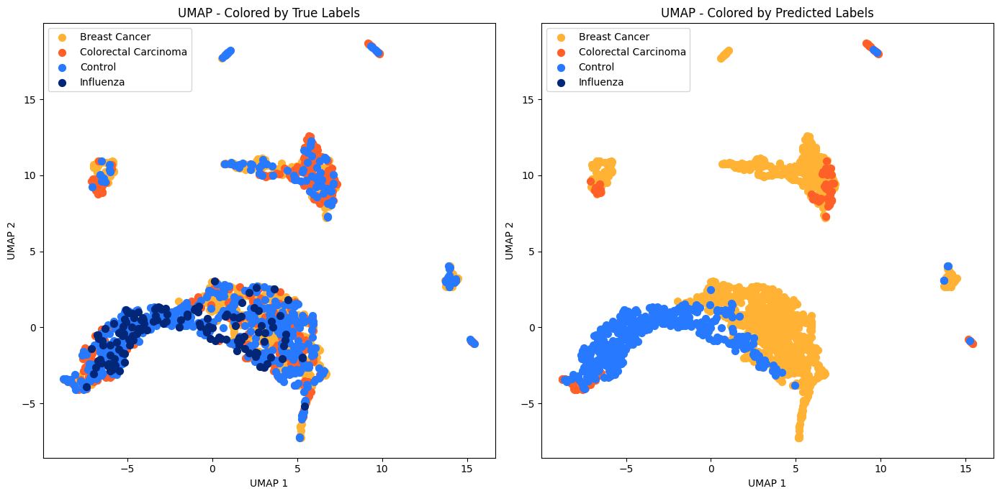

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define your labels and corresponding colors
labels = np.unique(y_test)


color_map = {
    label: color for label, color in zip(labels, irb_colors[:1] + irb_colors[2:])
}

# Plotting the UMAP results
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# UMAP colored by true labels
for label in labels:
    idx = y_test == label
    axes[0].scatter(
        X_test_umap[idx, 0], X_test_umap[idx, 1], c=color_map[label], label=label, s=50
    )
axes[0].set_title("UMAP - Colored by True Labels")
axes[0].legend()
axes[0].set_xlabel("UMAP 1")
axes[0].set_ylabel("UMAP 2")

# UMAP colored by predicted labels
for label in labels:
    idx = y_pred == label
    axes[1].scatter(
        X_test_umap[idx, 0], X_test_umap[idx, 1], c=color_map[label], label=label, s=50
    )
axes[1].set_title("UMAP - Colored by Predicted Labels")
axes[1].legend()
axes[1].set_xlabel("UMAP 1")
axes[1].set_ylabel("UMAP 2")

plt.tight_layout()
plt.savefig(
    "outputs/umap.scgpt_embed.pred_labels.raw.png", dpi=300, bbox_inches="tight"
)

# Testing Area

In [ ]:
# for data_type in ["test"]:

#     if data_type == "train":
#         adata = adata_train
#         c_matrix = c_matrix_train
#         e_matrix = e_matrix_train
#         p_matrix = p_matrix_train
#     else:
#         adata = adata_test
#         c_matrix = c_matrix_test
#         e_matrix = e_matrix_test
#         p_matrix = p_matrix_test

#     # Compute pairwise similarities for each disease
#     for disease_it in adata.obs["disease_study"].unique():

#         # get disease & control indexes
#         disease_idxs = list()
#         control_idxs = list()
#         for i, (disease, disease_study) in enumerate(
#             zip(adata.obs["disease"].to_list(), adata.obs["disease_study"].to_list())
#         ):
#             if (disease == disease_it) & (disease_study == disease_it):
#                 disease_idxs.append(i)
#             elif (disease == "Control") & (disease_study == disease_it):
#                 control_idxs.append(i)

#         print(f"Control: {len(control_idxs)}")
#         print(f"Disease: {len(disease_idxs)}")
#         n_samples = len(disease_idxs) + len(control_idxs)
#         # Plot Metrics
#         for metric, matrix in zip(
#             ["Cosine Similarity", "Euclidean Distance", "Pearson Correlation"],
#             [c_matrix, e_matrix, p_matrix],
#         ):

#             d_ps = get_grouped_ps(
#                 c_matrix, [disease_idxs, control_idxs], ["Disease", "Control"]
#             )

#             plot_metrics(
#                 d_ps.values(),
#                 d_ps.keys(),
#                 metric,
#                 title=f"{data_type} - {disease_it} ({n_samples})",
#                 output_txt=f"{data_type}_{disease_it.replace(' ','_')}.control_vs_disease",
#                 save=True,
#             )

In [ ]:
# imports

import xml.etree.ElementTree as ET, os


# variables
mesh_file_path = os.path.join(
    "/aloy/home/ddalton/projects/disease_signatures/data/MeSH/desc2023.xml"
)

mesh_da_mappings_path = "/aloy/home/ddalton/projects/disease_signatures/data/DiSignAtlas/mesh_tree_terms.pkl"

df_info_path = os.path.join(
    "/aloy",
    "home",
    "ddalton",
    "projects",
    "disease_signatures",
    "data",
    "DiSignAtlas",
    "Disease_information_Datasets_extended.csv",
)


# functions
def parse_mesh_data(file_path):
    """Parse MeSH XML data and extract disease terms."""
    tree = ET.parse(file_path)
    root = tree.getroot()

    # Extract disease terms
    disease_terms = list()
    list_tree_numbers = list()
    for descriptor in root.findall("DescriptorRecord"):
        # Check if the term is under the category of diseases
        tree_numbers = descriptor.findall("TreeNumberList/TreeNumber")
        for tree_number in tree_numbers:
            # This is a basic check for TreeNumbers starting with 'C' which usually denotes diseases in MeSH
            # You might need to adjust this based on the specific structure of your XML file
            if tree_number.text.startswith("C"):
                list_tree_numbers.append(tree_number.text)
                term = descriptor.find("DescriptorName/String").text
                disease_terms.append(term)
                break  # Break after adding the term to avoid duplicates

    return disease_terms, list_tree_numbers


def parse_mesh_data(file_path):
    """Parse MeSH XML data and extract disease terms."""
    tree = ET.parse(file_path)
    root = tree.getroot()

    # Dictionary to map tree numbers to disease terms
    tree_2_term = {}
    term_2_tree = {}

    # Extract disease terms and tree numbers
    for descriptor in root.findall("DescriptorRecord"):
        # Get the disease term name
        term = descriptor.find("DescriptorName/String").text

        # Get all tree numbers for this term
        tree_numbers = descriptor.findall("TreeNumberList/TreeNumber")

        for tree_number in tree_numbers:
            # Check for disease-related tree numbers starting with 'C'
            # if tree_number.text.startswith("C"):
            # Map each tree number to its term
            tree_2_term[tree_number.text] = term
            term_2_tree[term] = tree_number.text

    return tree_2_term, term_2_tree


# load DiSignAtlas info
df_info = pd.read_csv(df_info_path)

# load MeSH data
# disease_terms, list_tree_numbers = parse_mesh_data(file_path=mesh_file_path)
# print(disease_terms)

# tree_2_term = dict(zip(list_tree_numbers, disease_terms))
# term_2_tree = dict(zip(disease_terms, list_tree_numbers))

tree_2_term, term_2_tree = parse_mesh_data(file_path=mesh_file_path)

# map DisignAtlas to MeSH tree
mesh_da_mappings = pickle.load(open(mesh_da_mappings_path, "rb"))

# map samples to mesh terms
adata_orig.obs["dsaid"]

# get disease terms
disease_terms = adata_orig.obs["disease_study"].to_list()

In [ ]:
# get DA tree numbers
dsaid_2_tree = dict(
    zip(mesh_da_mappings["dsaids"], mesh_da_mappings["mesh_tree_terms"])
)
da_tree_numbers = [dsaid_2_tree.get(x) for x in adata_orig.obs["dsaid"].to_list()]

In [ ]:
def shorten_tree(tree_ids):
    """For a given list of tree ids return the shortest the root tree id"""
    return [x.split(".")[0] for x in tree_ids]


def get_related_disease(disease_id, disease_trees, disease_tree, rest_ids, rest_trees):
    """Get dsaids from the same family
    Must be different disease but same family
    """

    disease_trees = shorten_tree(disease_trees)
    rest_trees = shorten_tree(rest_trees)

    idxs = list()

    for idx, (id, tree) in enumerate(zip(rest_ids, rest_trees)):
        condition_1 = disease_id != id
        condition_2 = len(set(disease_trees).intersection(set(tree))) > 0
        condition_3 = len(set(disease_tree).intersection(set(tree))) > 0
        if condition_1 & condition_3:
            idxs.append(idx)

    return idxs


def get_unrelated_disease(disease_info, rest_info, disease_tree):
    """Get dsaids from different families
    Must be different disease and different family. No overlap w/ other trees
    """
    ds_id, ds_name, ds_trees, ds_dt = disease_info
    rest_id, rest_name, rest_trees, rest_dt = rest_info

    ds_trees = shorten_tree(ds_trees)
    rest_trees = shorten_tree(rest_trees)

    idxs = list()

    for idx, (id, name, tree, dt) in enumerate(
        zip(rest_id, rest_name, rest_trees, rest_dt)
    ):
        condition_1 = id != ds_id
        condition_2
        condition_3 = len(set(ds_trees).intersection(set(tree))) == 0
        condition_ = len(set(ds_trees).intersection(set(tree))) == 0
        condition_ = name != "Control"

        if condition_1 & condition_2 & condition_3:
            idxs.append(idx)

    return idxs


def get_same_disease(disease_info, rest_info, disease_tree):
    """Get dsaids from the same family
    Must be the same disease
    """
    disease_trees = shorten_tree(disease_trees)
    rest_trees = shorten_tree(rest_trees)

    idxs = list()

    for idx, (id, tree, disease_name) in enumerate(
        zip(rest_ids, rest_trees, disease_names)
    ):
        condition_1 = disease_id != id
        condition_2 = len(set(disease_trees).intersection(set(tree))) == 0
        condition_3 = len(set(disease_tree).intersection(set(tree))) == 0
        condition_4 = disease_name != "Control"
        if condition_1 & condition_4:
            idxs.append(idx)

    return idxs


def get_control(disease_info, rest_info, disease_tree):
    """Get dsaids from the same family
    Must be the same experiment but control conditions
    """
    disease_trees = shorten_tree(disease_trees)
    rest_trees = shorten_tree(rest_trees)

    idxs = list()

    for idx, (id, tree, disease_name) in enumerate(
        zip(rest_ids, rest_trees, disease_names)
    ):
        condition_1 = disease_id != id
        condition_2 = len(set(disease_trees).intersection(set(tree))) == 0
        condition_3 = len(set(disease_tree).intersection(set(tree))) == 0
        condition_4 = disease_name == "Control"
        if condition_1 & condition_4:
            idxs.append(idx)

    return idxs


def get_same_disease_diff_dataset(disease_info, rest_info, disease_tree):
    """Get dsaids from the same family
    Must be the same disease but different datasets
    """
    pass


def get_same_disease_same_dataset(disease_info, rest_info, disease_tree):
    """Get dsaids from the same family
    Must be the same disease and same datasets
    """
    pass